# Downstream spatial analysis 02

This notebook performs the following downstream analyses, starting with the adata object generated in [00_downstream_analysis.ipynb](00_downstream_analysis.ipynb)
- Investigation of Th0 in parenchyma
- Evaluate distance within TLS


In [1]:
import sys
import os
import time
import warnings
import re
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
import scanpy as sc
import squidpy as sq


import scipy
from scipy.spatial import distance_matrix
from scipy.spatial.distance import cdist
from scipy import stats
import scipy.ndimage as ndi
from scipy.stats import gaussian_kde
from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks

from shapely.geometry import Point

from shapely.geometry import MultiPolygon
from alphashape import alphashape
from alphashape import optimizealpha
import geopandas as gpd

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer

import pickle
import joblib

import random
import matplotlib.colors as mcolors

import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 24
mpl.rcParams['pdf.fonttype'] = 42

import warnings
warnings.simplefilter(action='ignore', category=Warning)

sys.version_info

sys.version_info(major=3, minor=12, micro=2, releaselevel='final', serial=0)

In [2]:
import matplotlib.colors as clr
import colorcet

zissou = [
    "#3A9AB2",
    "#6FB2C1",
    "#91BAB6",
    "#A5C2A3",
    "#BDC881",
    "#DCCB4E",
    "#E3B710",
    "#E79805",
    "#EC7A05",
    "#EF5703",
    "#F11B00",
]

colormap = clr.LinearSegmentedColormap.from_list("Zissou", zissou)
colormap_r = clr.LinearSegmentedColormap.from_list("Zissou", zissou[::-1])

## Local file info

In [3]:
dist_out_dir = '/home/workspace/spatial_mouse_lung_outputs/downstream_analysis/distance'

if not os.path.exists (dist_out_dir):
    os.makedirs(dist_out_dir)

plot_out_dir = os.path.join(dist_out_dir, 'plots_updates')
if not os.path.exists (plot_out_dir):
    os.makedirs(plot_out_dir)

## Load adata

In [4]:
xen_filepath = os.path.join(dist_out_dir,'adata_distance_zones_structure.h5ad')
adata = sc.read_h5ad(xen_filepath)



## Load palettes

In [5]:
with open(os.path.join(dist_out_dir, '20250519_celltype_palette_mapped.pkl'), 'rb') as f:
    celltype_palette_mapped = pickle.load(f)

with open(os.path.join(dist_out_dir, '20250520_celltype_palette_coarse_mapped.pkl'), 'rb') as f:
    celltype_palette_coarse_mapped = pickle.load(f)

with open(os.path.join(dist_out_dir, '20250520_celltype_palette_coarser_mapped.pkl'), 'rb') as f:
    celltype_palette_coarser_mapped = pickle.load(f)

with open(os.path.join(dist_out_dir, '20250521_zone_consol_palette_mapped.pkl'), 'rb') as f:
    zone_consol_palette_mapped = pickle.load(f)

## Plotting functions

In [6]:
def zone_composition_heatmap_2(adata, label_col, zone_col, swap_axes = False, save_path=None):

    summary_df = adata.obs.groupby([zone_col, label_col]).size().reset_index(name='count')

    # Pivot the table to get 'zone' as rows, 'majority_voting' as columns, and 'count' as values
    summary_counts = pd.pivot_table(summary_df, values='count', index=zone_col, columns=label_col, fill_value=0)

    # calculate fractions
    row_sums= summary_counts.sum(axis=1)
    summary_frac = summary_counts.div(row_sums, axis=0)  
    # del summary_frac['unknown']

    ##### Previously was scaling values between 0 and 1
    # scaler = MinMaxScaler()
    # summary_frac_scaled = scaler.fit_transform(summary_frac.T).T

    ##### Update to make values fraction of 1 (rows add up to 1)
    # summary_frac_scaled = summary_frac.div(summary_frac.sum(axis=1), axis=0)

    ## or no scaling
    summary_frac_scaled = summary_frac

    if swap_axes:
        print('swap')
        summary_frac_scaled = summary_frac_scaled.T
        xticklabels=summary_frac.index
        yticklabels=summary_frac.columns
        fig, ax = plt.subplots(1, 1, figsize=(2, 6))
    else:

        xticklabels=summary_frac.columns
        yticklabels=summary_frac.index
        fig, ax = plt.subplots(1, 1, figsize=(6, 2))
        
    
    
    # fig, ax = plt.subplots(1, 1, figsize=(10, 1))
    sns.heatmap(
        summary_frac_scaled,
        xticklabels=xticklabels,
        yticklabels=yticklabels,
        ax=ax,
        cmap='Blues',
        linecolor="white",
        linewidths=0.5,
    )
    ax.tick_params(axis='x', labelsize=14)

    if save_path is not None:
        fig.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    return(summary_frac_scaled)
    

# DE functions 

In [7]:
def filter_adata_expressed_in_n_cells(adata, fraction=0.05):
    """
    Filter the adata to only include genes expressed in more than a certain fraction of cells

    Parameters:
    - adata (anndata): The anndata object containing the gene expression
    - fraction (float): The fraction of cells a gene must be expressed in to be included

    Return:
    - adata (anndata): The filtered anndata object
    """
    adata = adata.copy()
    adata.layers["bin"] = adata.X > 0
    gene_expressed_in_fraction_cells = np.mean(adata.layers["bin"], axis=0)
    keep = gene_expressed_in_fraction_cells > fraction
    adata = adata[:, keep]
    return adata
    



In [8]:
def DE_test(adata, cell_column, cell_list=None, groupby=None, groups = 'all', reference= 'rest', stat_method = 'wilcoxon', use_raw = False, expression_threshold=None):
    """
    Performs differential expression (DE) testing on an AnnData object using Scanpy's `rank_genes_groups`.

    Parameters:
        adata (AnnData): The input AnnData object.
        cell_column (str): Column in `adata.obs` used to filter cells by type.
        cell_list (list, optional): List of cell types to subset before DE testing. If None, all cells are used.
        groupby (str): Column in `adata.obs` used to define groups for DE testing.
        groups (str or list, optional): Groups to test. Default is 'all'.
        reference (str, optional): Reference group for comparison. Default is 'rest'.
        stat_method (str, optional): Statistical test to use. 
        use_raw (bool, optional): Whether to use `.raw` for DE testing. Default is False.
        expression_threshold (float, optional): If set, filters genes to only those expressed in at least this fraction of cells.

    Returns:
        AnnData: A subsetted copy of the input `AnnData` object with DE results stored in `adata.uns['rank_genes_groups']`.
    """
    
    if cell_list:
        print('subsetting by celltype')
        adata_sub = adata[adata.obs[cell_column].isin(cell_list), :]
    else:
        print('not subsetting by cell type')
        adata_sub = adata.copy()
        
    # Optionally to include only genes that are expressed in 5% of the cells
    if expression_threshold:
        print('removing genes by expression threshold: ', expression_threshold)
        adata_sub=filter_adata_expressed_in_n_cells(adata_sub,fraction=expression_threshold)
              
    sc.tl.rank_genes_groups(adata_sub, groupby, method=stat_method, corr_method='benjamini-hochberg', groups=groups, reference= reference, use_raw=use_raw)
    return(adata_sub)

In [9]:
from adjustText import adjust_text

def DE_volcano(
    df_DEG,
    pval_col="pvals_adj",
    gene_col="names",
    lfc_col="logfoldchanges",
    lfc_threshold=1.0,
    genes_to_label=None,
    pval_cutoff=0.05,
    axis_lims = None,
    down_color="darkblue",
    up_color="darkred",
    nonsig_color="gray",
    title=""
):
    """
    Generate a volcano plot from DE results.

    Parameters
    ----------
    df_DEG : pd.DataFrame
        DE result table with logFC and p-values.
    pval_col : str
        Name of column with adjusted p-values.
    gene_col : str
        Name of column with gene names.
    lfc_col : str
        Name of column with log2 fold changes.
    lfc_threshold : float
        Minimum |log2FC| to consider significant.
    genes_to_label : set or list, optional
        Genes to label regardless of significance.
    pval_cutoff : float
        Adjusted p-value threshold.
    down_color : str
        Color for significantly downregulated genes.
    up_color : str
        Color for significantly upregulated genes.
    nonsig_color : str
        Color for non-significant points.
    title : str
        Title for the plot.

    Returns
    -------
    matplotlib.figure.Figure
        The volcano plot figure.
    """

    df_DEG = df_DEG.copy()

    # Avoid log(0) issues
    df_DEG[pval_col] = df_DEG[pval_col].replace(0, 1e-300)
    df_DEG['-log10p'] = -np.log10(df_DEG[pval_col])

    # Default label set
    if genes_to_label is None:
        genes_to_label = set()

    # Assign color for each point
    def get_color(row):
        sig = row[pval_col] < pval_cutoff
        up = row[lfc_col] > lfc_threshold
        down = row[lfc_col] < -lfc_threshold
        if sig and up:
            genes_to_label.add(row[gene_col])
            return up_color
        elif sig and down:
            genes_to_label.add(row[gene_col])
            return down_color
        return nonsig_color

    df_DEG['color'] = df_DEG.apply(get_color, axis=1)

    # Define axis lims
    if axis_lims is None:
        lim = max(abs(min(df_DEG[lfc_col])), max(df_DEG[lfc_col]))
        axis_lims = [-lim, lim]
    # Clip axes
    df_DEG["lfc_clipped"] = df_DEG[lfc_col].clip(axis_lims[0], axis_lims[1])

    # Start plot
    fig, ax = plt.subplots(figsize=(8, 6))

    ax.scatter(
        df_DEG["lfc_clipped"],
        df_DEG["-log10p"],
        c=df_DEG["color"],
        s=20,
        zorder=1,
        alpha=0.7
    )

    # Significance threshold lines
    ax.axhline(-np.log10(pval_cutoff), color="gray", linestyle="--", zorder=2)
    ax.axvline(-lfc_threshold, color="gray", linestyle="--", zorder=2)
    ax.axvline(lfc_threshold, color="gray", linestyle="--", zorder=2)

    # Label significant genes
    text_objects = []
    for _, row in df_DEG.iterrows():
        if row[gene_col] in genes_to_label:
            ax.scatter(row["lfc_clipped"], row["-log10p"], color=row["color"], s=20, zorder=3)
            text = ax.text(
                row["lfc_clipped"], row["-log10p"], row[gene_col],
                fontsize=10, zorder=4
            )
            text_objects.append(text)

    adjust_text(
        text_objects,
        expand_points=(1.5, 1.5),
        expand_text=(1.2, 1.2),
        force_text=(0.2, 0.5),
        force_points=(0.3, 0.5),
        lim=300,
        arrowprops=dict(arrowstyle="-", color="black", lw=0.5)
    )

    ax.set_xlabel("log2 Fold Change")
    ax.set_ylabel("-log10(p-adj)")
    ax.set_title(title)
    ax.set_xlim(axis_lims[0], axis_lims[1])

    plt.tight_layout()
    return fig



In [10]:
def run_zone_DE_analysis(
    adata,
    celltype,
    celltype_col,
    zone_col,
    zone_order,
    reference_zone='rest',
    pval_cutoff=0.05,
    lfc_cutoff=1,
    expression_threshold = 0.01,
    plot=True
):
    """
    Run differential expression within a cell type across two zones, return DE tables.

    Parameters
    ----------
    adata : AnnData
        Input AnnData object with raw counts or log-normalized data.
    celltype : str
        The cell type to isolate for DE analysis.
    celltype_col : str
        Column in adata.obs containing cell type labels.
    zone_col : str
        Column in adata.obs indicating zone (e.g. 'Tzone', 'Foll').
    zone_order : list of str
        Order of zones for plotting and sorting.
    reference_zone : str
        Zone to use as reference in DE.
    pval_cutoff : float
        Adjusted p-value threshold.
    lfc_cutoff : float
        Log fold change threshold.
    plot : bool
        Whether to generate volcano plots and dotplot.

    Returns
    -------
    df_DEG_all : pd.DataFrame
        Full DE table across zones.
    df_DEG_filt : pd.DataFrame
        Filtered DE genes.
    """

    # Subset to cell type and zones of interest
    adata_subset = adata[adata.obs[celltype_col] == celltype, :]
    adata_subset = adata_subset[adata_subset.obs[zone_col].isin(zone_order), :]
    print(f"Subset shape: {adata_subset.shape} for celltype: {celltype}")

    # Run DE (assumes DE_test adds results to .uns['rank_genes_groups'])
    adata_subset = DE_test(
        adata_subset,
        celltype_col,
        groupby=zone_col,
        groups='all',
        reference=reference_zone,
        stat_method='wilcoxon',
        use_raw=False,
        expression_threshold = expression_threshold
    )

    results = adata_subset.uns['rank_genes_groups']
    groups = results['names'].dtype.names

    # Build full DE table and volcano plots
    df_DEG_list = []
    for group in groups:
        df_DEG = pd.DataFrame({
            key: results[key][group]
            for key in ['names', 'logfoldchanges', 'pvals_adj']
        })
        df_DEG['group'] = group
        df_DEG_list.append(df_DEG)

        if plot:
            _ = DE_volcano(
                df_DEG,
                pval_col='pvals_adj',
                gene_col='names',
                lfc_col='logfoldchanges',
                lfc_threshold=lfc_cutoff,
                title=f'{celltype}: {group}'
            )

    df_DEG_all = pd.concat(df_DEG_list, ignore_index=True)

    # Get max-LFC per gene across zones
    df_max_lfc = df_DEG_all.loc[
        df_DEG_all.groupby("names")["logfoldchanges"].idxmax()
    ].copy()

    df_max_lfc["group_rank"] = df_max_lfc["group"].map(
        {z: i for i, z in enumerate(zone_order)}
    )
    df_max_lfc = df_max_lfc.sort_values(["group_rank", "logfoldchanges"])
    gene_order = df_max_lfc["names"].tolist()

    print(f"Unique DEGs before pval/lfc filter: {len(gene_order)}")

    # Apply filtering
    df_DEG_filt = df_DEG_all[
        (df_DEG_all["pvals_adj"] < pval_cutoff) &
        (df_DEG_all["logfoldchanges"].abs() > lfc_cutoff)
    ]
    gene_order_filt = [g for g in gene_order if g in set(df_DEG_filt["names"])]
    print(f"Unique DEGs after pval/lfc filter: {len(gene_order_filt)}")

    # Dotplot
    if plot and gene_order_filt:
        sc.pl.dotplot(
            adata_subset,
            var_names=gene_order_filt,
            groupby=zone_col,
            categories_order=zone_order,
            standard_scale='var',
            swap_axes=False,
            show=False
        )

    return df_DEG_all, df_DEG_filt


## B cell subclustering and DE; check PD1

In [121]:
# load previously subclustered B cells
adata_Bcell_subclustered = sc.read_h5ad('/home/workspace/spatial_mouse_lung_outputs/cell_labeling/ouputs_mouselung_hurskainen_ref_consolidate_labels_xenseg_HDM/adata_Bcell.h5ad')

In [129]:
def subcluster_celltype(adata, label_col, labels, res=1, seed=1234):
    """
    Subcluster a specific cell type or set of labels in an AnnData object using a precomputed embedding (e.g., scVI).

    Parameters
    ----------
    adata : anndata.AnnData
        The full AnnData object containing expression data, metadata, and embeddings.

    label_col : 
        The name of the column in `adata.obs` that contains labels used for subsetting (e.g., "celltype", "cluster").

    labels : list
        A list of values to use for subsetting. These values will be matched against entries in `adata.obs[label_col]`.

    res : float, optional (default=1)
        Resolution parameter for Leiden clustering.

    seed : int, optional (default=1234)
        Random seed used for reproducibility.

    Returns
    -------
    adata_sub : anndata.AnnData
        The subset AnnData object containing only the specified labels, with new UMAP, Leiden clustering,
        and marker gene results stored.
    """
    np.random.seed(seed)
    
    # subcluster
    print(labels)
    print('res', res)
    adata_sub = adata[adata.obs[label_col].isin(labels), :]

    print('neighbors')
    sc.pp.neighbors(adata_sub, use_rep='X_scVI_refalign', key_added='neighbors_scvi_subset')
    print('leiden')
    sc.tl.leiden(adata_sub, neighbors_key='neighbors_scvi_subset', resolution=res, key_added='leiden_subset', n_iterations=2)
    print('umap')
    sc.tl.umap(adata_sub, neighbors_key='neighbors_scvi_subset')

    # identify markers of each subcluster 
    print('get cluster markers')
    sc.tl.rank_genes_groups(
        adata_sub,
        groupby='leiden_subset',  method='wilcoxon')
    
    # update the name of the subset umap dims
    adata_sub.obsm['X_umap_subset'] = adata_sub.obsm['X_umap']
    del adata_sub.obsm['X_umap']
    
    return adata_sub

In [130]:
adata_Bcell = subcluster_celltype(adata, label_col= 'label_fine', labels = ['B cell', 'Plasmablast'], res=0.7)

['B cell', 'Plasmablast']
res 0.7
neighbors
leiden
umap
get cluster markers


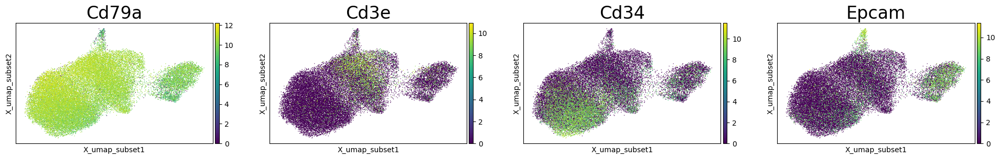

In [144]:
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=['Cd79a', 'Cd3e', 'Cd34', 'Epcam'])

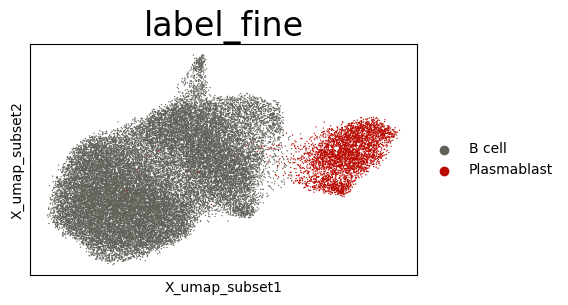

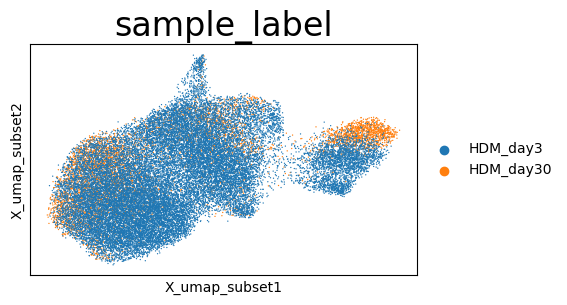

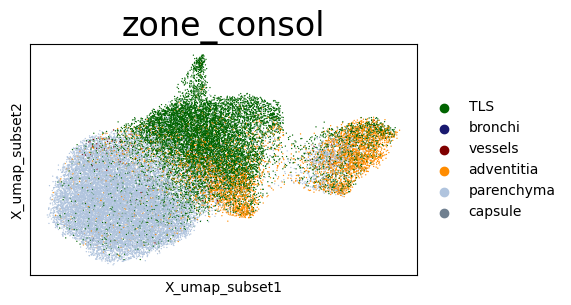

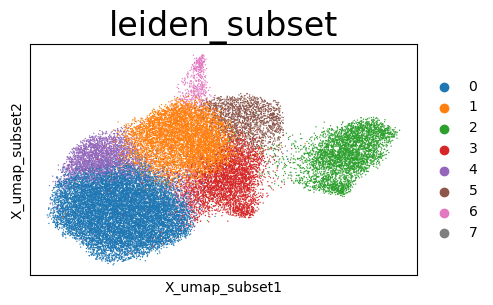

In [141]:
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=['label_fine'], palette=celltype_palette_mapped)
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=['sample_label'])
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color= 'zone_consol', palette=zone_consol_palette_mapped)
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=['leiden_subset'])

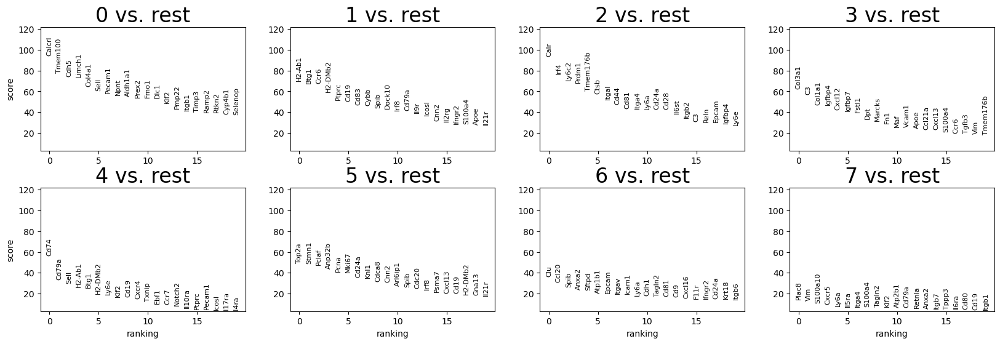

In [142]:
sc.pl.rank_genes_groups(adata_Bcell)

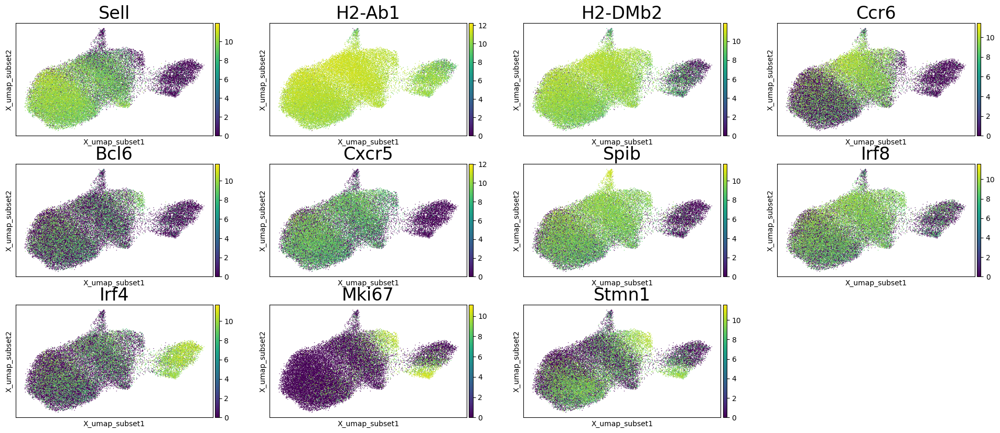

In [147]:
cluster_markers = ['Sell', 'H2-Ab1', 'H2-DMb2', 'Ccr6', 'Bcl6','Cxcr5', 'Spib', 'Irf8', 'Irf4', 'Mki67', 'Stmn1']
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=cluster_markers)

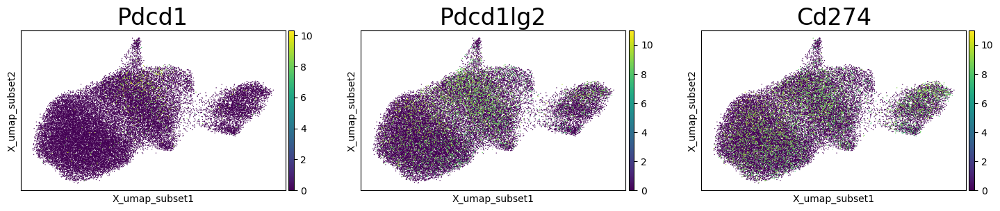

In [148]:
cluster_markers = ['Pdcd1', 'Pdcd1lg2', 'Cd274']
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color=cluster_markers)

In [150]:
# GC B cell gene signature? This one is generated from ChatGPT from our gene panel list. Ideally we would pull one from a publication

gc_bcell_signature = [
    "Bcl6", "Cd83", "Cd86", "Cd81", "Cd24a", "Cd74", "Cd79a", "Cd19",
    "H2-Ab1", "H2-DMb2", "Cxcr5", "Ccr6", "Ccr7", "Cxcr4",
    "Spib", "Irf8", "Btg1", "Mxd1", "Txnip", "Irf4",
    "Mki67", "Pcna", "Top2a", "Stmn1",
    "Il21r", "Il4ra", "Il6ra", "Il10ra",
    "Ccl19", "Ccl21a", "Pdcd1lg2", "Lag3", "Cd27"
]

sc.tl.score_genes(adata_Bcell, gene_list=gc_bcell_signature, score_name='gc_bcell_score')

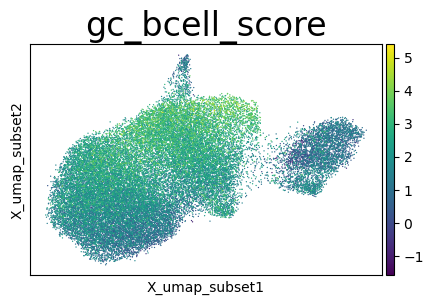

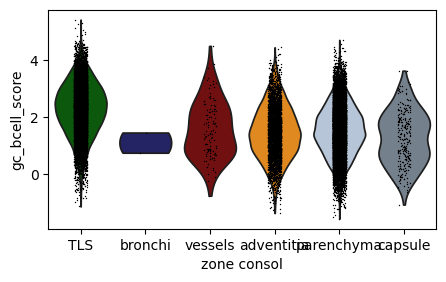

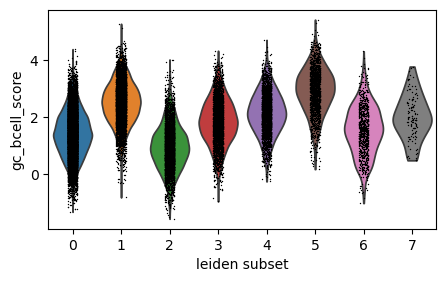

In [154]:
sc.pl.embedding(adata_Bcell, basis = 'X_umap_subset', color='gc_bcell_score')
sc.pl.violin(adata_Bcell, groupby='zone_consol', keys='gc_bcell_score', palette=zone_consol_palette_mapped)
sc.pl.violin(adata_Bcell, groupby='leiden_subset', keys='gc_bcell_score')

### PD1

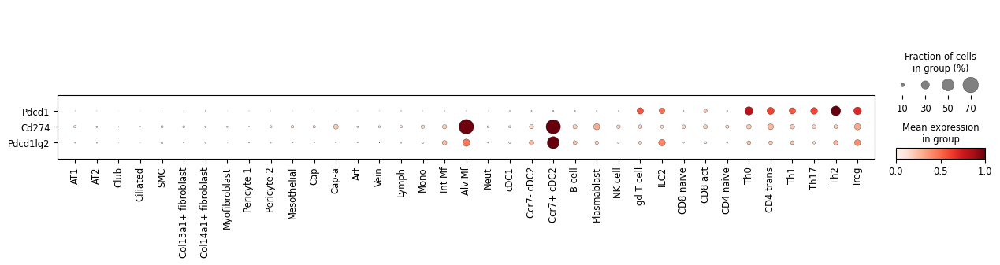

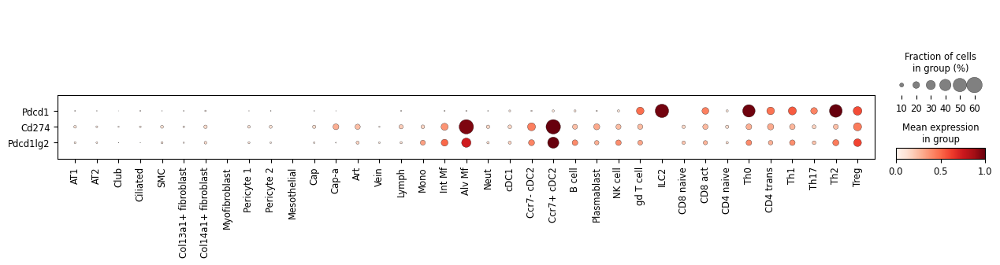

In [112]:
# What cell types express PD1 players

sc.pl.dotplot(adata, var_names = ['Pdcd1', 'Cd274', 'Pdcd1lg2'], groupby='label_fine', standard_scale = 'var', swap_axes=True)
sc.pl.dotplot(adata[adata.obs['zone_consol']=='TLS', :], var_names = ['Pdcd1', 'Cd274', 'Pdcd1lg2'], groupby='label_fine', standard_scale = 'var', swap_axes=True)

swap


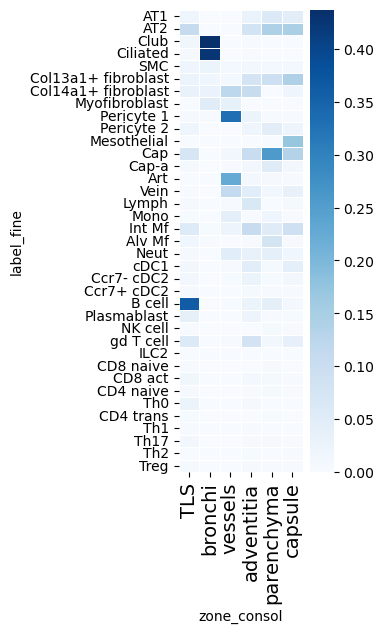

In [117]:
df = zone_composition_heatmap_2(adata, 'label_fine', 'zone_consol', swap_axes = True )

In [160]:
df.sort_values(by='TLS', ascending=False)

zone_consol,TLS,bronchi,vessels,adventitia,parenchyma,capsule
label_fine,,,,,,
B cell,0.362062,0.000026,0.003825,0.026555,0.041932,0.011912
AT2,0.107540,0.000826,0.000790,0.082726,0.139922,0.145911
Cap,0.070006,0.000155,0.015090,0.103001,0.256098,0.133226
gd T cell,0.059989,0.001679,0.001788,0.080781,0.012465,0.036446
Int Mf,0.057237,0.003667,0.022781,0.106104,0.053973,0.090599
Plasmablast,0.037755,0.000026,0.001039,0.022198,0.001746,0.004314
Col14a1+ fibroblast,0.032288,0.029337,0.121721,0.106975,0.001700,0.019511
Th0,0.025427,0.000000,0.000873,0.006386,0.001596,0.001481
Col13a1+ fibroblast,0.024363,0.016631,0.008688,0.077232,0.093798,0.142048


In [156]:
adata_sample.obs['label_fine'].unique().tolist()

['Col13a1+ fibroblast',
 'Alv Mf',
 'Cap',
 'Vein',
 'AT2',
 'Mono',
 'Th0',
 'Pericyte 2',
 'Cap-a',
 'Neut',
 'Pericyte 1',
 'Club',
 'Ciliated',
 'Art',
 'AT1',
 'CD4 naive',
 'B cell',
 'Th17',
 'Int Mf',
 'CD8 naive',
 'SMC',
 'gd T cell',
 'Plasmablast',
 'Th2',
 'Lymph',
 'Ccr7- cDC2',
 'NK cell',
 'cDC1',
 'CD4 trans',
 'Ccr7+ cDC2',
 'Th1',
 'CD8 act',
 'Mesothelial',
 'Treg',
 'Myofibroblast',
 'Col14a1+ fibroblast',
 'ILC2']

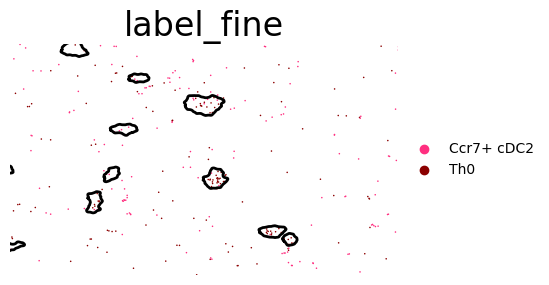

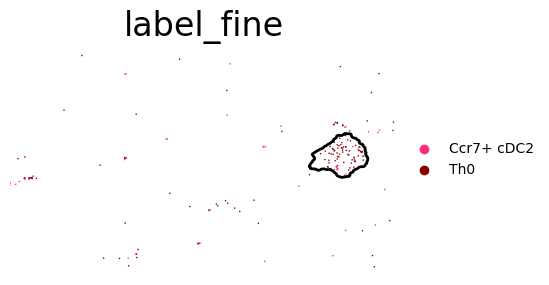

In [161]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['Ccr7+ cDC2', 'Th0'])], 
                    basis='spatial',
                    color = 'label_fine',
                    frameon=False, 
                    size=5, 
                    show=False)

    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=2)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.show()

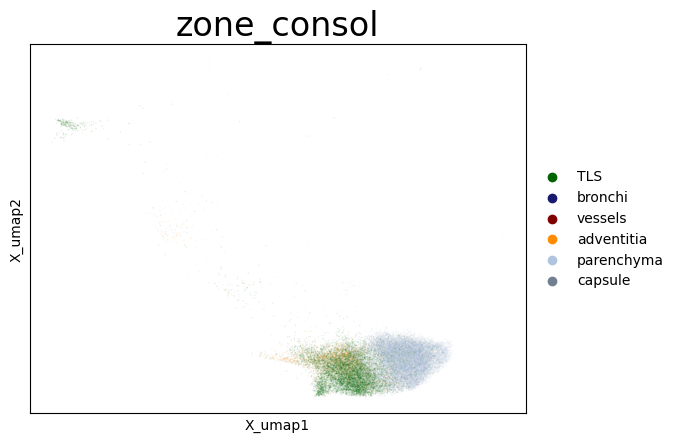

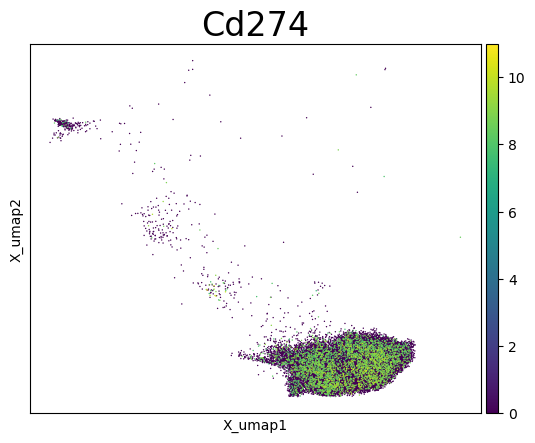

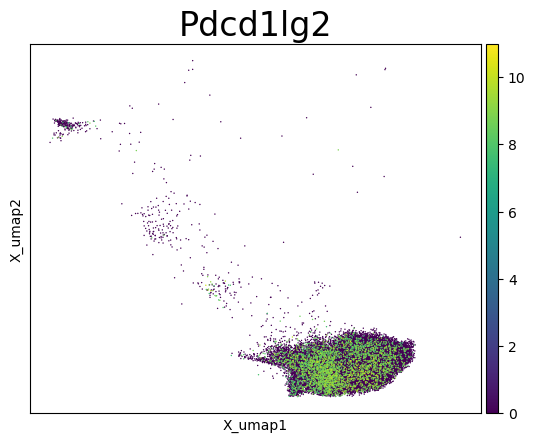

In [6]:
adata_b = adata[adata.obs['label_fine']=='B cell', :]
sc.pl.embedding(adata_b, basis='X_umap', color = 'zone_consol', palette =zone_consol_palette_mapped, alpha=.1)
sc.pl.embedding(adata_b, basis='X_umap', color = 'Cd274')
sc.pl.embedding(adata_b, basis='X_umap', color = 'Pdcd1lg2')

Subset shape: (21588, 480) for celltype: B cell
not subsetting by cell type
removing genes by expression threshold:  0.05
Unique DEGs before pval/lfc filter: 261
Unique DEGs after pval/lfc filter: 156
Subset shape: (4783, 480) for celltype: B cell
not subsetting by cell type
removing genes by expression threshold:  0.05
Unique DEGs before pval/lfc filter: 232
Unique DEGs after pval/lfc filter: 164


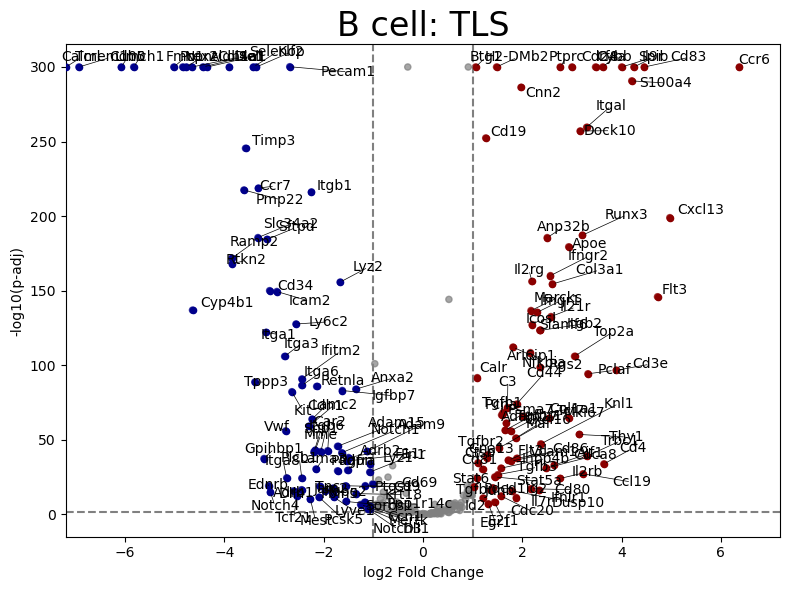

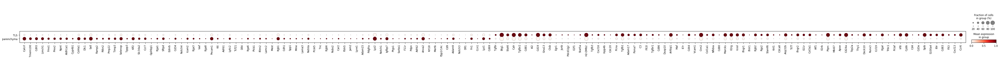

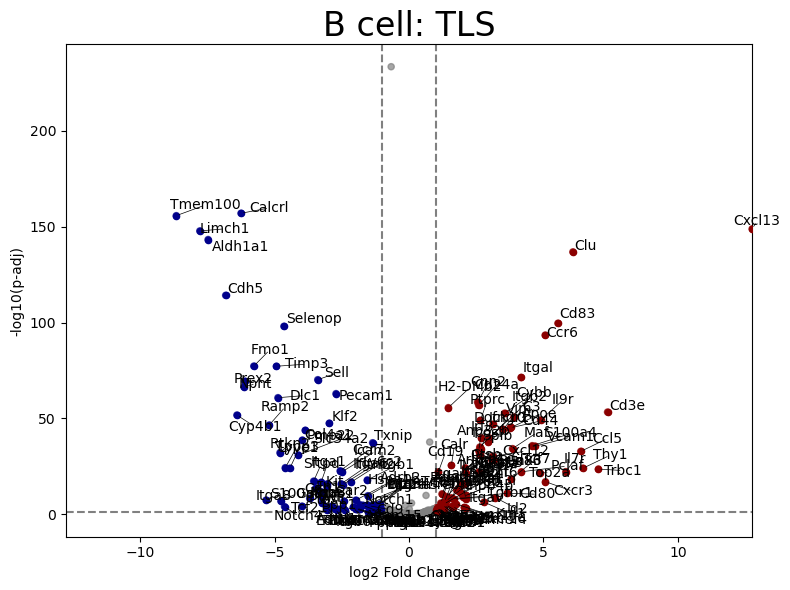

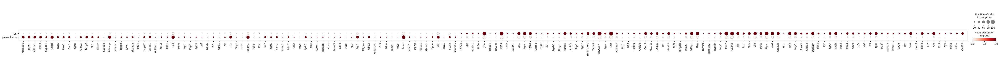

In [102]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    
    adata_select = adata[adata.obs['sample_label']==sample_label, :]
    
    df_DEG_Bcell, df_DEG_Bcell_filt = run_zone_DE_analysis(
        adata=adata_select,
        celltype='B cell',
        celltype_col = 'label_fine',
        zone_col = 'zone_consol',
        zone_order=['TLS', 'parenchyma'],
        reference_zone='parenchyma',
        lfc_cutoff=1,
        pval_cutoff=0.05,
        expression_threshold = 0.05,
    )

In [56]:
df_DEG_Bcell[df_DEG_Bcell['names']=='Pdcd1lg2']

,names,logfoldchanges,pvals_adj,group
72,Pdcd1lg2,1.408732,1.347903e-18,TLS


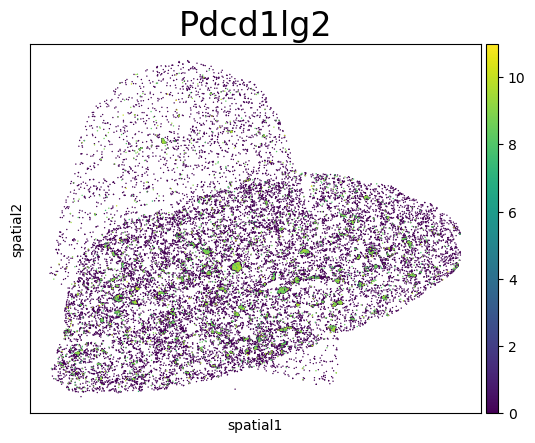

In [7]:
sc.pl.embedding(adata_b, basis='spatial', color = 'Pdcd1lg2')

HDM_day3


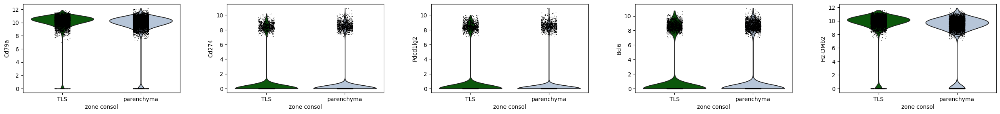

HDM_day30


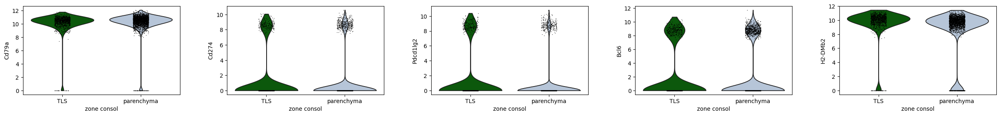

In [101]:
adata_Bcell = adata[adata.obs['label_fine']=='B cell', :]
adata_Bcell_sub = adata_Bcell[adata_Bcell.obs['zone_consol'].isin(['TLS', 'parenchyma']), :]
for sample_label in ['HDM_day3', 'HDM_day30']:
    print(sample_label)
    sc.pl.violin(adata_Bcell_sub[adata_Bcell_sub.obs['sample_label']==sample_label, :], 
                 keys = ['Cd79a','Cd274', 'Pdcd1lg2', 'Bcl6', 'H2-DMb2'], groupby='zone_consol', palette = zone_consol_palette_mapped)

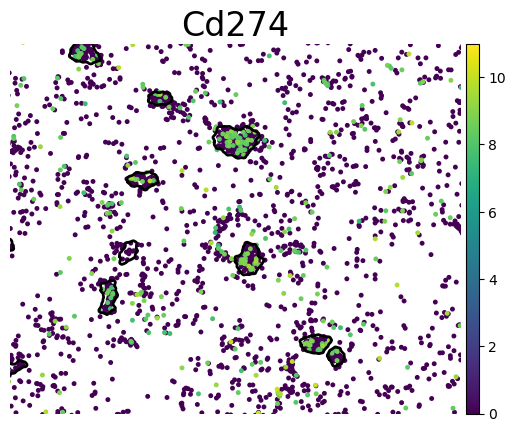

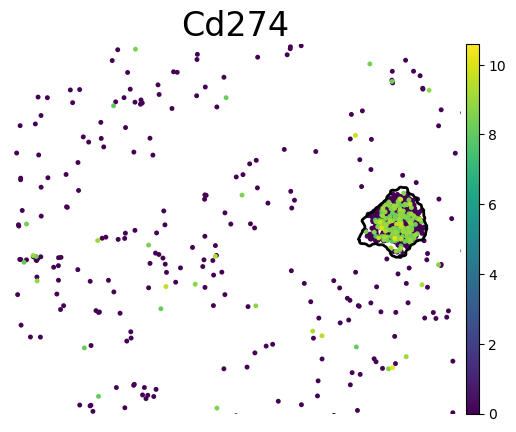

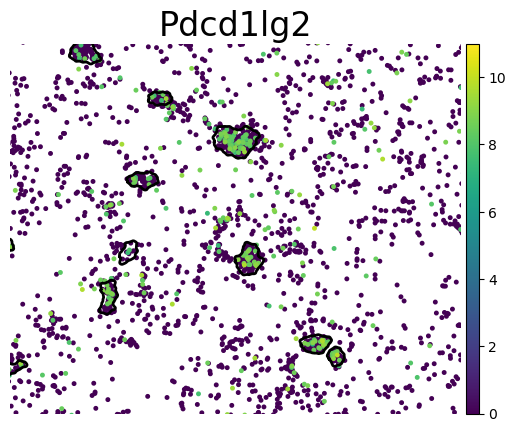

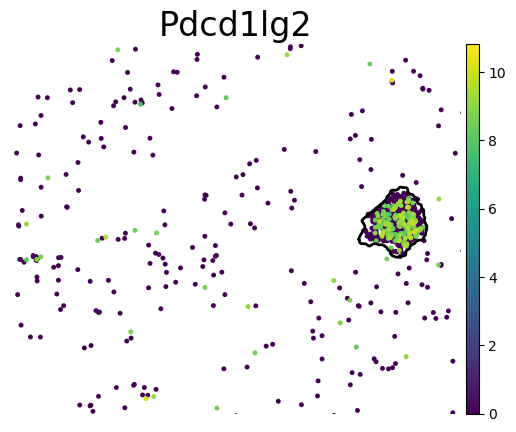

In [19]:
for gene in ['Cd274', 'Pdcd1lg2']:
    for sample_label in adata.obs['sample_label'].cat.categories:
        adata_sample = adata[adata.obs['sample_label']==sample_label, :]
    
        sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['B cell'])], 
                        basis='spatial',
                        color = gene,
                        frameon=False, 
                        size=50, 
                        show=False)
    
        ax = plt.gca()
        tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
        for p in tls_poly.geoms:
                ax.plot(*p.exterior.xy, c='black', linewidth=2)
            
        plt.xlim([3000, 5000])
        plt.ylim([3000, 5000])
        plt.show()

## B cell subsclustering and DE

## Investigation of Th0 in the parenchyma
- Do a DE test between TLS and parenchyma Th0
- Violin plot for markers associated with circulation or residency between TLS and parenchyma Th0
- Distance of Th0 to vessels (?)

In [21]:
adata_th0 = adata[adata.obs['label_fine']=='Th0', :]

In [22]:
adata_th0[:, adata_th0.var.index == 'Cd69'].var

""
Cd69


HDM_day3


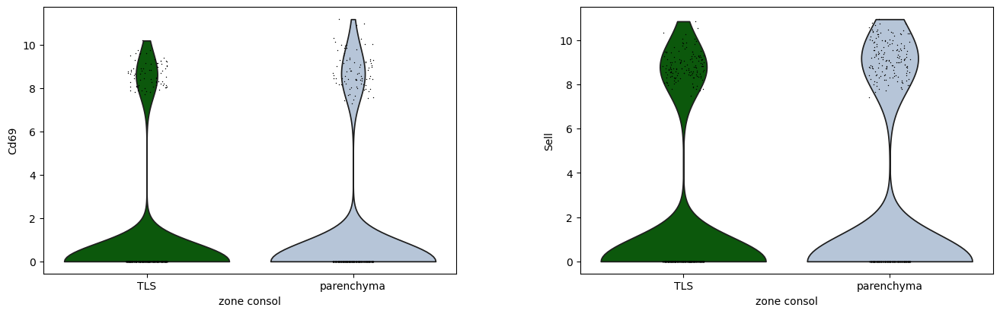

HDM_day30


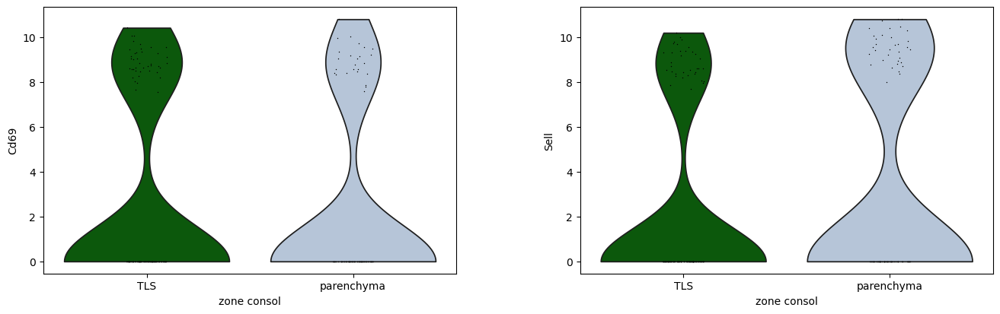

In [23]:
adata_th0_sub = adata_th0[adata_th0.obs['zone_consol'].isin(['TLS', 'parenchyma']), :]
for sample_label in ['HDM_day3', 'HDM_day30']:
    print(sample_label)
    sc.pl.violin(adata_th0_sub[adata_th0_sub.obs['sample_label']==sample_label, :], 
                 keys = ['Cd69', 'Sell'], groupby='zone_consol', palette = zone_consol_palette_mapped)

### DE between zones - within Th0


In [40]:
# CITE genes expressed in 5% of at least one subset
gene_df = pd.read_csv('/home/workspace/spatial_mouse_lung_outputs/cell_labeling/ouputs_mouselung_hurskainen_ref_consolidate_labels_xenseg_HDM/cite_integration/cite_expressed_genes_by_annotation.csv')
genes_cite_filt = gene_df['x'].tolist()

# Xenium genes expressed in 5% of at least one subset
genes_xen_filt = []
adata_cd4 = adata.copy()
for subset in adata_cd4.obs['label_fine'].unique().tolist():
    adata_cd4_subset = adata_cd4[adata_cd4.obs['label_fine'] == subset, :]
    adata_cd4_subset = filter_adata_expressed_in_n_cells(adata_cd4_subset, fraction=0.05)
    genes_xen_filt.extend(adata_cd4_subset.var.index.tolist())
genes_xen_filt = list(set(genes_xen_filt))

# take the intersection and use this list for heatmaps 
genes_cite_xen_filt = list(set(genes_cite_filt) & set(genes_xen_filt))

Subset shape: (1471, 184) for celltype: Th0
not subsetting by cell type
Unique DEGs before pval/lfc filter: 184
Unique DEGs after pval/lfc filter: 73


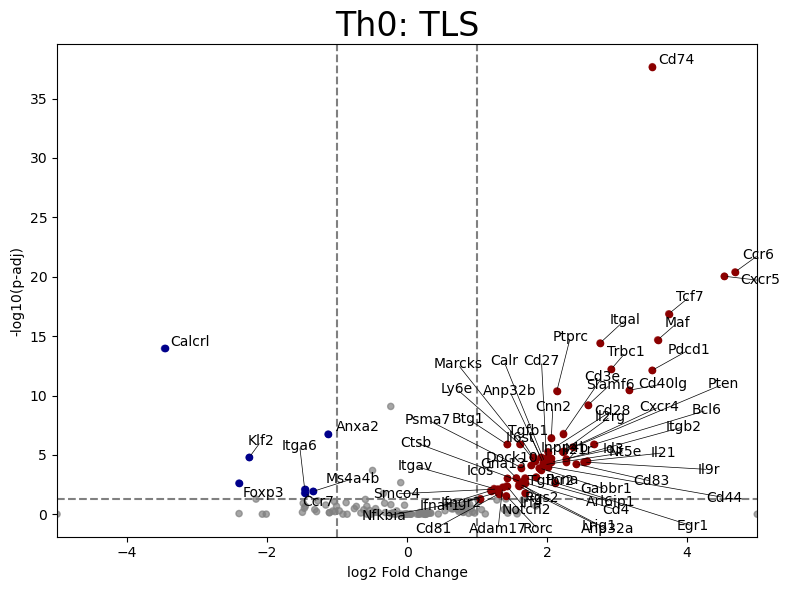

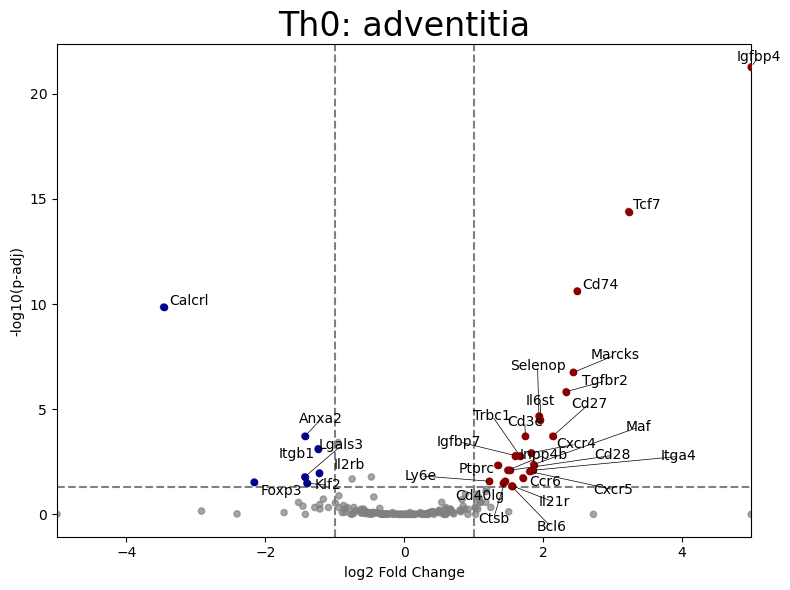

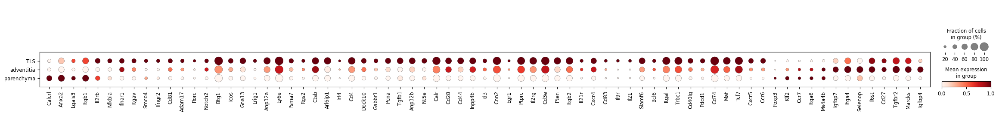

In [47]:
sample_label = 'HDM_day3'
celltype_col = 'label_fine'
celltype = 'Th0'

adata_select = adata[adata.obs['sample_label']==sample_label, genes_cite_xen_filt]
adata_select = adata_select[adata_select.obs[celltype_col]==celltype, :]

df_DEG_Th0, df_DEG_Th0_filt = run_zone_DE_analysis(
    adata=adata_select,
    celltype='Th0',
    celltype_col = 'label_fine',
    zone_col = 'zone_consol',
    zone_order=['TLS','adventitia', 'parenchyma'],
    reference_zone='parenchyma',
    lfc_cutoff=1,
    pval_cutoff=0.05,
    expression_threshold = None,
)

HDM_day3


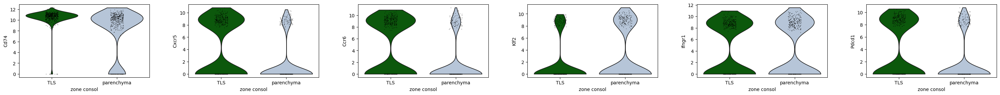

HDM_day30


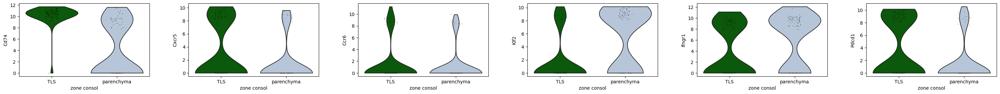

In [98]:
adata_th0 = adata[adata.obs['label_fine']=='Th0', :]
adata_th0_sub = adata_th0[adata_th0.obs['zone_consol'].isin(['TLS', 'parenchyma']), :]
for sample_label in ['HDM_day3', 'HDM_day30']:
    print(sample_label)
    sc.pl.violin(adata_th0_sub[adata_th0_sub.obs['sample_label']==sample_label, :], 
                 keys = ['Cd74', 'Cxcr5', 'Ccr6', 'Klf2', 'Ifngr1', 'Pdcd1'], groupby='zone_consol', palette = zone_consol_palette_mapped)

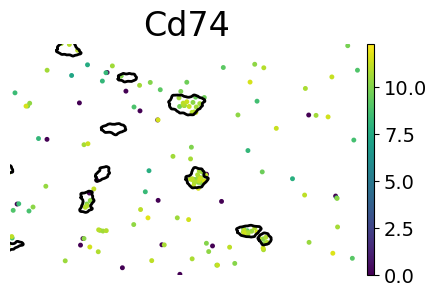

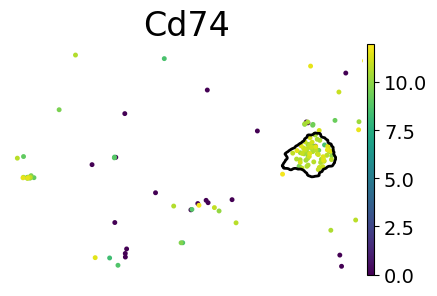

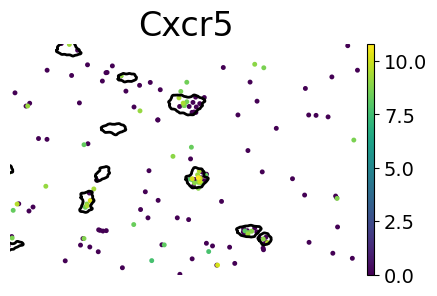

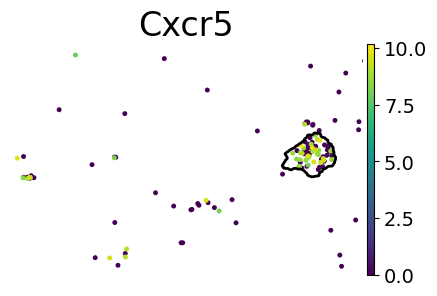

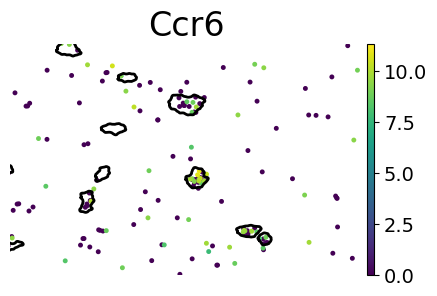

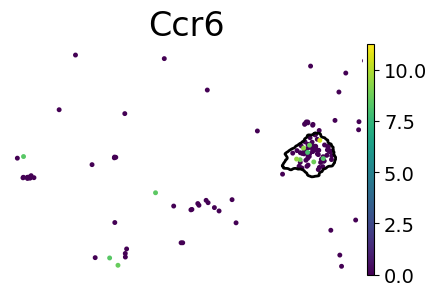

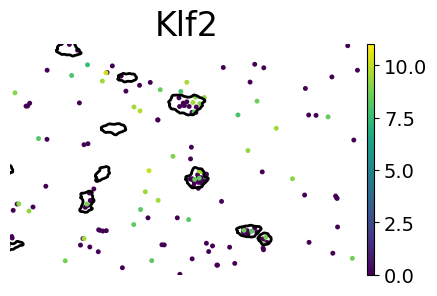

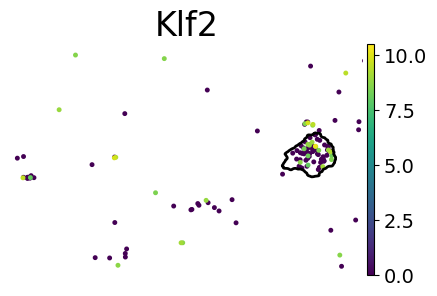

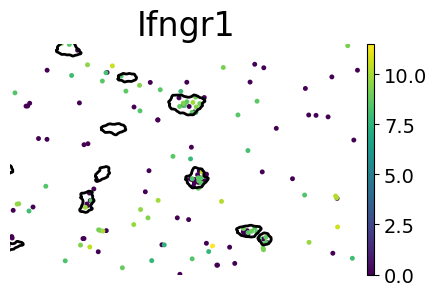

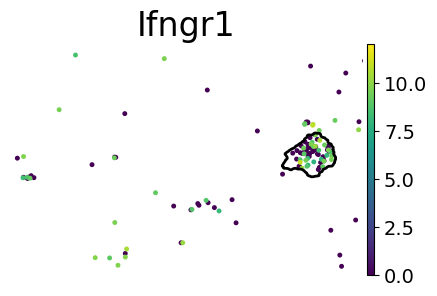

In [108]:
for gene in ['Cd74', 'Cxcr5', 'Ccr6', 'Klf2', 'Ifngr1']:
    for sample_label in adata.obs['sample_label'].cat.categories:
        adata_sample = adata[adata.obs['sample_label']==sample_label, :]
    
        sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['Th0'])], 
                        basis='spatial',
                        color = gene,
                        frameon=False, 
                        size=50, 
                        show=False)
    
        ax = plt.gca()
        tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
        bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
        vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
        for p in tls_poly.geoms:
                ax.plot(*p.exterior.xy, c='black', linewidth=2)
            
        plt.xlim([3000, 5000])
        plt.ylim([3000, 5000])
        plt.show()

### Distance to other cell types within parenchyma

- For parenchyma CD4s, calculate distance to capillary cells and compare that between subsets. Hypothesis is that the Th0 are closest to the capillaries of all the CD4 subsets in the parenchyma

In [83]:
def cell_dist_to_other_celltype(adata, cell_type_col, other_cell_type_col, other_cell_type, nearest_n):
    """
    For each unique cell type in `cell_type_col`, compute the average distance to its `nearest_n` 
    closest cells of a specified other cell type (e.g., a landmark or reference type).

    The function stores the resulting distances in a new column of `adata.obs`, named 
    `avg_distance_to_<other_cell_type>`.

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix with `.obs` columns for cell types and centroid coordinates.

    cell_type_col : str
        Column in `adata.obs` containing cell type identities to compute distances from.

    other_cell_type_col : str
        Column in `adata.obs` specifying the identity of the comparison group (e.g., cell type, state, region).

    other_cell_type : str
        Value in `other_cell_type_col` to which distances will be computed.

    nearest_n : int
        Number of nearest neighboring cells to include in the average distance calculation.

    Returns
    -------
    AnnData
        Updated `adata` object with a new column in `.obs` containing average distances 
        to the `other_cell_type`.
    """
    
    # get coordinates of other cell type (the one we want to calculate the distance to)
    adata_other_type = adata[adata.obs[other_cell_type_col] == other_cell_type, :]
    other_cell_type_coords = adata_other_type.obs[['x_centroid', 'y_centroid']].values
    print('adata_other_type shape ', adata_other_type.shape)
    
    # Iterate over each unique cell type
    for cell_type in adata.obs[cell_type_col].unique():
        
        # Filter AnnData object for the current cell type
        adata_filtered = adata[adata.obs[cell_type_col] == cell_type, :]
        adata_filtered_cell_type_indices = adata_filtered.obs.index
        print('adata_cell_type shape ', adata_filtered.shape)
    
        # Get the coordinates of the cells of the current type
        cell_type_coords = adata_filtered.obs[['x_centroid', 'y_centroid']].values
        
        # Calculate the pairwise distances between the current cell type and other cell type
        pairwise_distances = cdist(cell_type_coords, other_cell_type_coords, metric='euclidean')
    
        # Sort distances and select nearest n
        nearest_distances = np.sort(pairwise_distances, axis=1)[:, :nearest_n]
        
        # Calculate the average distance to the nearest n cells
        avg_distance = np.mean(nearest_distances, axis=1)

        # Store distances in adata.obs 

        # column name to store distance to other type
        dist_col = 'avg_distance_to_' + other_cell_type
        
        # Assigning values to the new column in the original DataFrame, using cell type filtered adata indices
        adata.obs.loc[adata_filtered_cell_type_indices, dist_col] = avg_distance

    return adata

In [85]:
adata_cd4_parenchyma.obs['label_fine'].unique().tolist()

['Th0', 'Th1', 'Th17', 'Treg', 'Th2', 'CD4 trans']

In [86]:
adata_parenchyma = adata[adata.obs['zone_consol']=='parenchyma', :].copy()

cell_type_col = 'label_fine'
other_cell_type_col = 'label_fine'
other_cell_type = 'Cap' 
dist_col = f'avg_distance_to_{other_cell_type}'
nearest_n = 2 

start_time = time.time()

adata_parenchyma.obs[dist_col] = np.nan

for sample_label in adata_parenchyma.obs['sample_label'].cat.categories:
    
    print(sample_label)

    adata_sample = adata_parenchyma[adata_parenchyma.obs['sample_label']==sample_label, :]
    
    # run distance calculation for each sample 
    adata_sample = cell_dist_to_other_celltype(adata_sample, cell_type_col, other_cell_type_col, other_cell_type, nearest_n)
    
    # get distance df for each structure and add it back to the main adata object
    dist_df = adata_sample.obs[[dist_col]] 
    adata_parenchyma.obs.loc[dist_df.index, dist_col] = dist_df[dist_col]

adata_parenchyma.obs[dist_col] = pd.to_numeric(adata_parenchyma.obs[dist_col])
end_time = time.time()
elapsed_time = (end_time - start_time) / 60
print(elapsed_time, ' min')


HDM_day3
adata_other_type shape  (52924, 480)
adata_cell_type shape  (2390, 480)
adata_cell_type shape  (1969, 480)
adata_cell_type shape  (20534, 480)
adata_cell_type shape  (13133, 480)
adata_cell_type shape  (38021, 480)
adata_cell_type shape  (26709, 480)
adata_cell_type shape  (12954, 480)
adata_cell_type shape  (19112, 480)
adata_cell_type shape  (52924, 480)
adata_cell_type shape  (8278, 480)
adata_cell_type shape  (3146, 480)
adata_cell_type shape  (3128, 480)
adata_cell_type shape  (4528, 480)
adata_cell_type shape  (11442, 480)
adata_cell_type shape  (4263, 480)
adata_cell_type shape  (10079, 480)
adata_cell_type shape  (416, 480)
adata_cell_type shape  (2382, 480)
adata_cell_type shape  (2107, 480)
adata_cell_type shape  (1581, 480)
adata_cell_type shape  (535, 480)
adata_cell_type shape  (860, 480)
adata_cell_type shape  (1110, 480)
adata_cell_type shape  (1359, 480)
adata_cell_type shape  (529, 480)
adata_cell_type shape  (1607, 480)
adata_cell_type shape  (128, 480)
adata

In [94]:
adata_parenchyma.write_h5ad(os.path.join(dist_out_dir, 'adata_parenchyma_cap_dist.h5ad'), compression='gzip')

<Axes: xlabel='label fine', ylabel='avg_distance_to_Cap'>

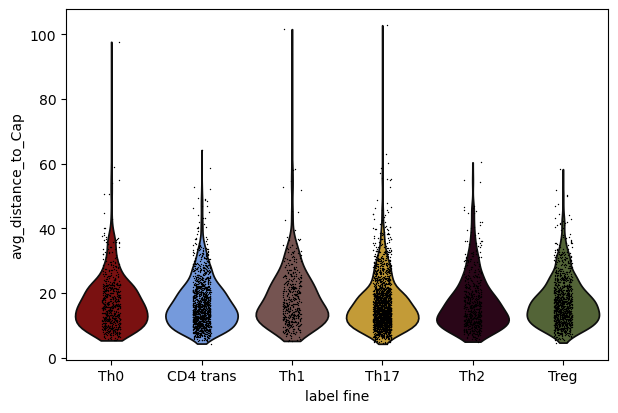

In [95]:
adata_parenchyma_cd4 = adata_parenchyma[adata_parenchyma.obs['label_medium']=='CD4 act', :]
sc.pl.violin(adata_parenchyma_cd4, keys = dist_col, groupby='label_fine', show=False )
# plt.ylim(0,30)

In [96]:
adata_parenchyma = adata[adata.obs['zone_consol']=='parenchyma', :].copy()

cell_type_col = 'label_fine'
other_cell_type_col = 'label_fine'
other_cell_type = 'Cap-a' 
dist_col = f'avg_distance_to_{other_cell_type}'
nearest_n = 2 

start_time = time.time()

adata_parenchyma.obs[dist_col] = np.nan

for sample_label in adata_parenchyma.obs['sample_label'].cat.categories:
    
    print(sample_label)

    adata_sample = adata_parenchyma[adata_parenchyma.obs['sample_label']==sample_label, :]
    
    # run distance calculation for each sample 
    adata_sample = cell_dist_to_other_celltype(adata_sample, cell_type_col, other_cell_type_col, other_cell_type, nearest_n)
    
    # get distance df for each structure and add it back to the main adata object
    dist_df = adata_sample.obs[[dist_col]] 
    adata_parenchyma.obs.loc[dist_df.index, dist_col] = dist_df[dist_col]

adata_parenchyma.obs[dist_col] = pd.to_numeric(adata_parenchyma.obs[dist_col])
end_time = time.time()
elapsed_time = (end_time - start_time) / 60
print(elapsed_time, ' min')

adata_parenchyma.write_h5ad(os.path.join(dist_out_dir, 'adata_parenchyma_cap-a_dist.h5ad'), compression='gzip')

HDM_day3
adata_other_type shape  (11442, 480)
adata_cell_type shape  (2390, 480)
adata_cell_type shape  (1969, 480)
adata_cell_type shape  (20534, 480)
adata_cell_type shape  (13133, 480)
adata_cell_type shape  (38021, 480)
adata_cell_type shape  (26709, 480)
adata_cell_type shape  (12954, 480)
adata_cell_type shape  (19112, 480)
adata_cell_type shape  (52924, 480)
adata_cell_type shape  (8278, 480)
adata_cell_type shape  (3146, 480)
adata_cell_type shape  (3128, 480)
adata_cell_type shape  (4528, 480)
adata_cell_type shape  (11442, 480)
adata_cell_type shape  (4263, 480)
adata_cell_type shape  (10079, 480)
adata_cell_type shape  (416, 480)
adata_cell_type shape  (2382, 480)
adata_cell_type shape  (2107, 480)
adata_cell_type shape  (1581, 480)
adata_cell_type shape  (535, 480)
adata_cell_type shape  (860, 480)
adata_cell_type shape  (1110, 480)
adata_cell_type shape  (1359, 480)
adata_cell_type shape  (529, 480)
adata_cell_type shape  (1607, 480)
adata_cell_type shape  (128, 480)
adata

<Axes: xlabel='label fine', ylabel='avg_distance_to_Cap-a'>

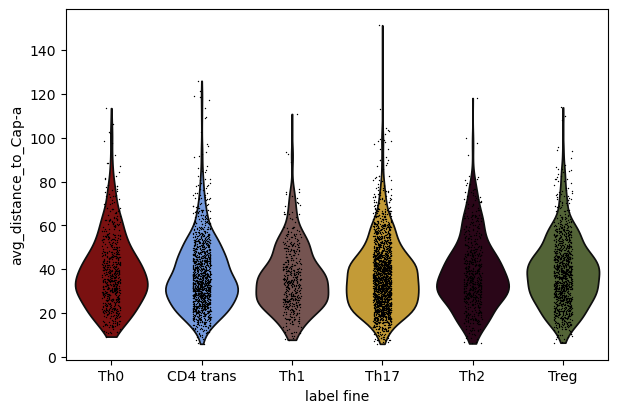

In [97]:
adata_parenchyma_cd4 = adata_parenchyma[adata_parenchyma.obs['label_medium']=='CD4 act', :]
sc.pl.violin(adata_parenchyma_cd4, keys = dist_col, groupby='label_fine', show=False )

### Plot CD4 zone localization normalized by zone tissue area (cell density in each zone)

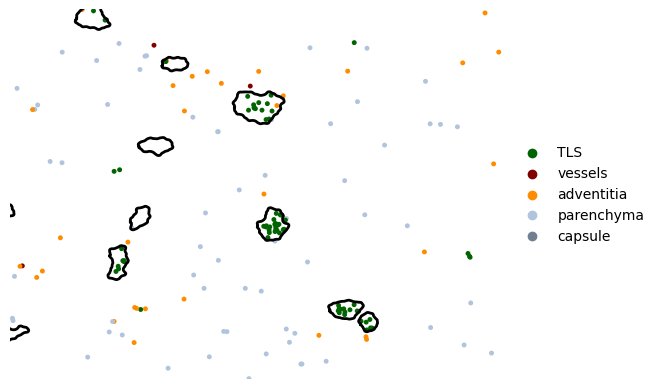

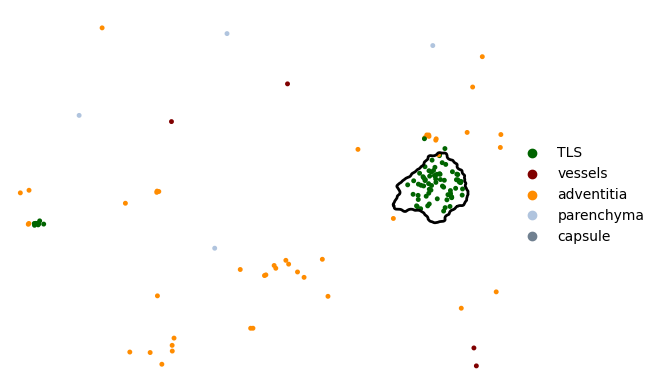

In [9]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['Th0'])], 
                    basis='spatial', color='zone_consol', 
                    palette=zone_consol_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=50, 
                    # legend_loc = 'none',
                    show=False)

    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
    vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=2)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.show()

In [11]:
adata_sample.obs['label_fine'].unique().tolist()

['Col13a1+ fibroblast',
 'Alv Mf',
 'Cap',
 'Vein',
 'AT2',
 'Mono',
 'Th0',
 'Pericyte 2',
 'Cap-a',
 'Neut',
 'Pericyte 1',
 'Club',
 'Ciliated',
 'Art',
 'AT1',
 'CD4 naive',
 'B cell',
 'Th17',
 'Int Mf',
 'CD8 naive',
 'SMC',
 'gd T cell',
 'Plasmablast',
 'Th2',
 'Lymph',
 'Ccr7- cDC2',
 'NK cell',
 'cDC1',
 'CD4 trans',
 'Ccr7+ cDC2',
 'Th1',
 'CD8 act',
 'Mesothelial',
 'Treg',
 'Myofibroblast',
 'Col14a1+ fibroblast',
 'ILC2']

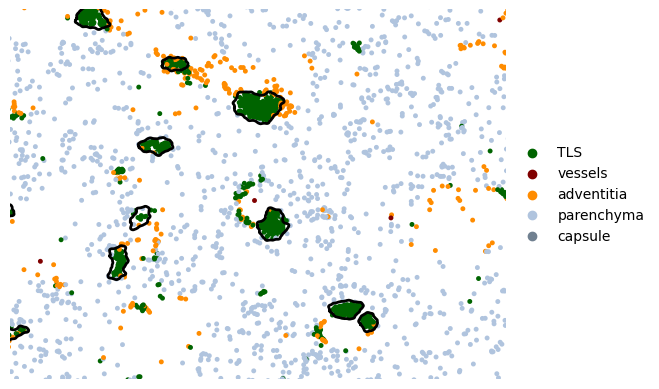

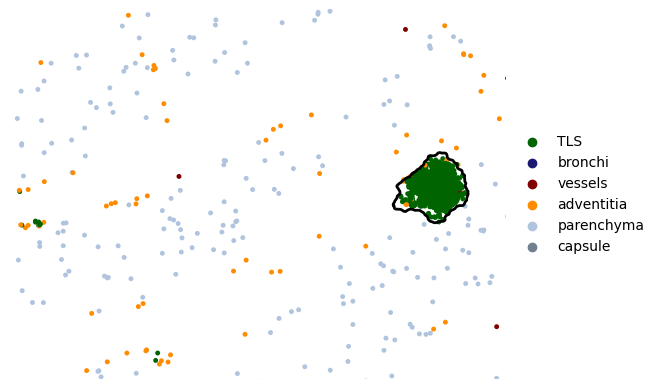

In [12]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['B cell'])], 
                    basis='spatial', color='zone_consol', 
                    palette=zone_consol_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=50, 
                    # legend_loc = 'none',
                    show=False)

    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
    vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=2)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.show()

In [64]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['Th0'])], 
                    basis='spatial', color='zone_consol', 
                    palette=zone_consol_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=50, 
                    # legend_loc = 'none',
                    show=False)

    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
    vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=2)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.show()

,cell_area,zone_consol
aaaadoof-1_1,73.920784,capsule
aaaajdak-1_1,64.167034,parenchyma
aaaamdfg-1_1,57.935471,capsule
aaaamenn-1_1,38.563439,parenchyma
aaaappoa-1_1,58.522502,capsule
...,...,...
oildjhno-1_1,13.050157,parenchyma
oildmnpb-1_1,8.399063,parenchyma
oiledico-1_1,38.021564,parenchyma
oileejmi-1_1,33.686564,parenchyma


In [39]:
adata.obs['sample_label'].unique()

['HDM_day30', 'HDM_day3']
Categories (2, object): ['HDM_day3' < 'HDM_day30']

In [80]:
adata_sample.obs['label_coarse'].unique()

['Alv Epi', 'CD4 T cell', 'Mesenchymal', 'Endothelial', 'Myeloid', 'B cell', 'Innate Lymphoid', 'CD8 T cell', 'Airwary Epi']
Categories (9, object): ['Alv Epi' < 'Airwary Epi' < 'Mesenchymal' < 'Endothelial' ... 'B cell' < 'Innate Lymphoid' < 'CD8 T cell' < 'CD4 T cell']

In [15]:
cd4_density

label_fine,Th0,CD4 trans,Th1,Th17,Th2,Treg,sample
zone_consol,,,,,,,
TLS,10.792107,0.913178,3.735729,3.486681,1.079211,3.154616,HDM_day30
bronchi,0.000000,0.000000,0.000000,0.015710,0.007855,0.000000,HDM_day30
vessels,0.135680,0.013568,0.094976,0.094976,0.040704,0.013568,HDM_day30
adventitia,0.978266,0.205951,0.459099,0.961104,1.287193,0.506296,HDM_day30
parenchyma,0.126721,0.049053,0.050416,0.149885,0.117183,0.044965,HDM_day30
capsule,0.225170,0.143290,0.184230,0.429870,0.634570,0.368460,HDM_day30


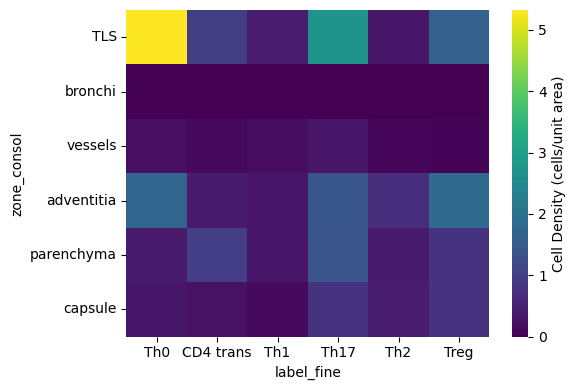

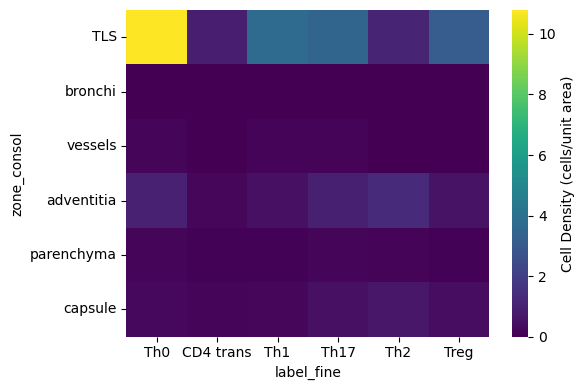

In [8]:

zone_col = 'zone_consol'
label_col = 'label_fine'

density_dfs = []
for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]
    adata_cd4 = adata_sample[adata_sample.obs['label_medium']=='CD4 act', :]
    # adata_cd4 = adata_sample[adata_sample.obs['label_coarse']=='CD4 T cell', :]
    
    # calculate counts of CD4 subsets in each zone
    counts_df_cd4 = adata_cd4.obs.groupby([zone_col, label_col]).size().reset_index(name='count')
    counts_df_cd4 = pd.pivot_table(
        counts_df_cd4, values='count', index=zone_col, columns=label_col, fill_value=0
    )
    
    # now calculate total area covered by each zone
    df = adata_sample.obs[['cell_area', 'zone_consol']].copy()
    area_summary = (
        df.groupby([zone_col])['cell_area']
        .sum())
    area_summary = area_summary/10000 # divide by 10000 to make the area values here 10000 um^2
    
    cd4_density = counts_df_cd4.div(area_summary, axis=0) 

    plt.figure(figsize=(6, 4))
    sns.heatmap(cd4_density, cmap='viridis', cbar_kws={'label': 'Cell Density (cells/unit area)'})
    plt.tight_layout()
    # plt.show()
    plt.savefig(os.path.join(plot_out_dir, f"CD4_zone_density_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)

    
    cd4_density['sample'] = sample_label
    density_dfs.append(cd4_density)
    

density_df_combined = pd.concat(density_dfs)

### CD4 zone density bar plot

In [44]:
density_df_combined.columns

Index(['Th0', 'CD4 trans', 'Th1', 'Th17', 'Th2', 'Treg', 'sample'], dtype='object', name='label_fine')

In [45]:
adata_cd4.obs['label_fine']

aaagbjph-1_0          Th0
aacjcnkp-1_0         Th17
aacnmmda-1_0         Th17
aafkcohk-1_0          Th2
aaipemje-1_0    CD4 trans
                  ...    
ohkdepme-1_0         Th17
oieahmon-1_0          Th0
oiefekjc-1_0         Th17
oiefobol-1_0         Treg
oigomcfo-1_0         Th17
Name: label_fine, Length: 1828, dtype: category
Categories (6, object): ['Th0' < 'CD4 trans' < 'Th1' < 'Th17' < 'Th2' < 'Treg']

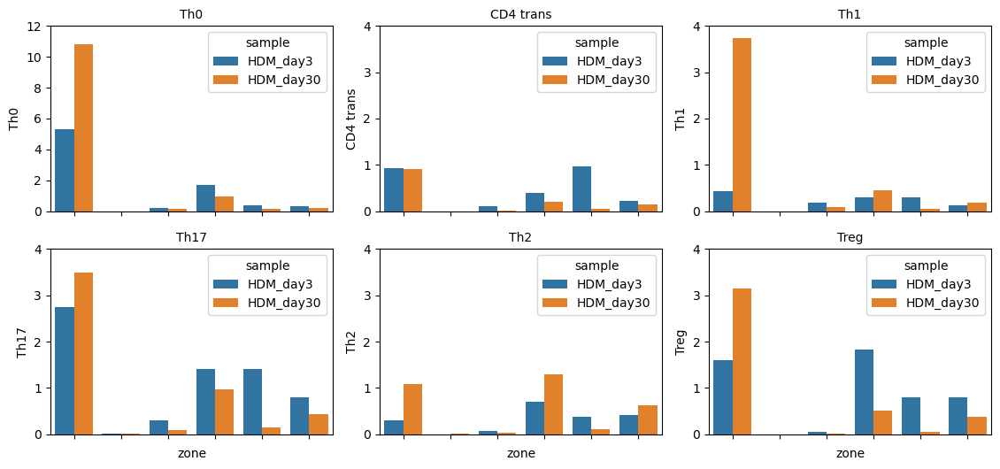

In [68]:
cells_plot = adata_cd4.obs['label_fine'].cat.categories
n_cells = len(cells_plot)
n_cols = 3  
n_rows = math.ceil(n_cells / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True, sharey=False)
axes = axes.flatten()
yaxis_max = [12,4,4,4,4,4]

for i, celltype in enumerate(cells_plot):

    ax = axes[i]

    df_celltype = density_df_combined[[celltype,'sample']]
    df_celltype['zone'] = df_celltype.index
    sns.barplot(df_celltype, x = 'zone', y = celltype, hue = 'sample', ax=ax)

    ax.set_ylim(0,yaxis_max[i])
    ax.set_title(celltype, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


In [34]:
cells_plot = adata_select.obs['label_fine'].unique().tolist()
cells_plot = celltypes
x_axis_col = 'tls_radial_dist_scaled_bin'

# compute counts and fractions per dist bin
composition_counts = adata_select.obs.groupby([x_axis_col, 'label_fine']).size().unstack(fill_value=0)
composition_fractions = composition_counts.div(composition_counts.sum(axis=1), axis=0)
composition_fractions.reset_index(inplace=True)

# melt the df
composition_long = composition_fractions.melt(id_vars=x_axis_col, var_name='celltype', value_name='fraction')

# subset to only the cell types of interest 
composition_long = composition_long[composition_long['celltype'].isin(cells_plot)]

# === Create Subplots ===

n_cells = len(cells_plot)
n_cols = 5  # Customize number of columns
n_rows = math.ceil(n_cells / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True, sharey=False)
axes = axes.flatten()

for i, celltype in enumerate(cells_plot):
    ax = axes[i]
    subset = composition_long[composition_long['celltype'] == celltype]

    ax.plot(
        subset[x_axis_col], 
        subset['fraction'], 
        lw=2,
        label=celltype,
        color=celltype_palette_mapped.get(celltype, "gray")
    )
    ax.set_title(celltype, fontsize=10)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['0', '1'], fontsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.text(0.5, 0.04, x_axis_col, ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Cell Composition Fraction', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.suptitle("Celltype Fractions by TLS Radial Bin", fontsize=14)
plt.show()



In [41]:
df_celltype

label_fine,Th0,sample,zone
zone_consol,,,
TLS,5.323988,HDM_day3,TLS
bronchi,0.000000,HDM_day3,bronchi
vessels,0.201734,HDM_day3,vessels
adventitia,1.708729,HDM_day3,adventitia
parenchyma,0.380657,HDM_day3,parenchyma
capsule,0.305036,HDM_day3,capsule
TLS,10.792107,HDM_day30,TLS
bronchi,0.000000,HDM_day30,bronchi
vessels,0.135680,HDM_day30,vessels


<Axes: xlabel='zone', ylabel='Th0'>

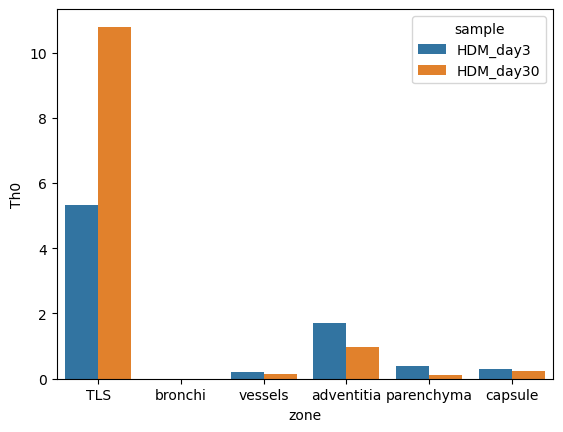

In [75]:
counts_df_cd4

label_fine,Th0,CD4 trans,Th1,Th17,Th2,Treg
zone_consol,,,,,,
TLS,130.0,11.0,45.0,42.0,13.0,38.0
bronchi,0.0,0.0,0.0,2.0,1.0,0.0
vessels,10.0,1.0,7.0,7.0,3.0,1.0
adventitia,228.0,48.0,107.0,224.0,300.0,118.0
parenchyma,93.0,36.0,37.0,110.0,86.0,33.0
capsule,11.0,7.0,9.0,21.0,31.0,18.0


In [76]:
area_summary

zone_consol
TLS            12.045841
bronchi       127.304455
vessels        73.702833
adventitia    233.065368
parenchyma    733.896706
capsule        48.852015
Name: cell_area, dtype: float64

In [77]:
cd4_density

label_fine,Th0,CD4 trans,Th1,Th17,Th2,Treg
zone_consol,,,,,,
TLS,10.792107,0.913178,3.735729,3.486681,1.079211,3.154616
bronchi,0.000000,0.000000,0.000000,0.015710,0.007855,0.000000
vessels,0.135680,0.013568,0.094976,0.094976,0.040704,0.013568
adventitia,0.978266,0.205951,0.459099,0.961104,1.287193,0.506296
parenchyma,0.126721,0.049053,0.050416,0.149885,0.117183,0.044965
capsule,0.225170,0.143290,0.184230,0.429870,0.634570,0.368460


### CD4 subset fold changes D30 / D3

In [44]:
adata_cd4.obs['label_fine'].unique().tolist()

['Th0', 'Th17', 'Th2', 'CD4 trans', 'Th1', 'Treg']

In [45]:
summary_df

,sample_label,label_fine,count
0,HDM_day3,Th0,1494
1,HDM_day3,CD4 trans,1558
2,HDM_day3,Th1,542
3,HDM_day3,Th17,2617
4,HDM_day3,Th2,735
5,HDM_day3,Treg,1712
6,HDM_day30,Th0,472
7,HDM_day30,CD4 trans,103
8,HDM_day30,Th1,205
9,HDM_day30,Th17,406


In [67]:
summary_counts.T

sample_label,HDM_day3,HDM_day30
label_fine,,
Th0,1494.0,472.0
CD4 trans,1558.0,103.0
Th1,542.0,205.0
Th17,2617.0,406.0
Th2,735.0,434.0
Treg,1712.0,208.0


In [70]:
summary_frac = summary_frac.T.reset_index()
summary_frac

sample_label,label_fine,HDM_day3,HDM_day30
0,Th0,0.172557,0.258206
1,CD4 trans,0.179949,0.056346
2,Th1,0.062601,0.112144
3,Th17,0.302264,0.222101
4,Th2,0.084893,0.237418
5,Treg,0.197736,0.113786


In [82]:
summary_counts.T.reset_index()

sample_label,label_fine,HDM_day3,HDM_day30
0,Th0,1494.0,472.0
1,CD4 trans,1558.0,103.0
2,Th1,542.0,205.0
3,Th17,2617.0,406.0
4,Th2,735.0,434.0
5,Treg,1712.0,208.0


In [77]:
summary_frac['label_fine'].astype(str)

1    CD4 trans
5         Treg
3         Th17
0          Th0
2          Th1
4          Th2
Name: label_fine, dtype: object

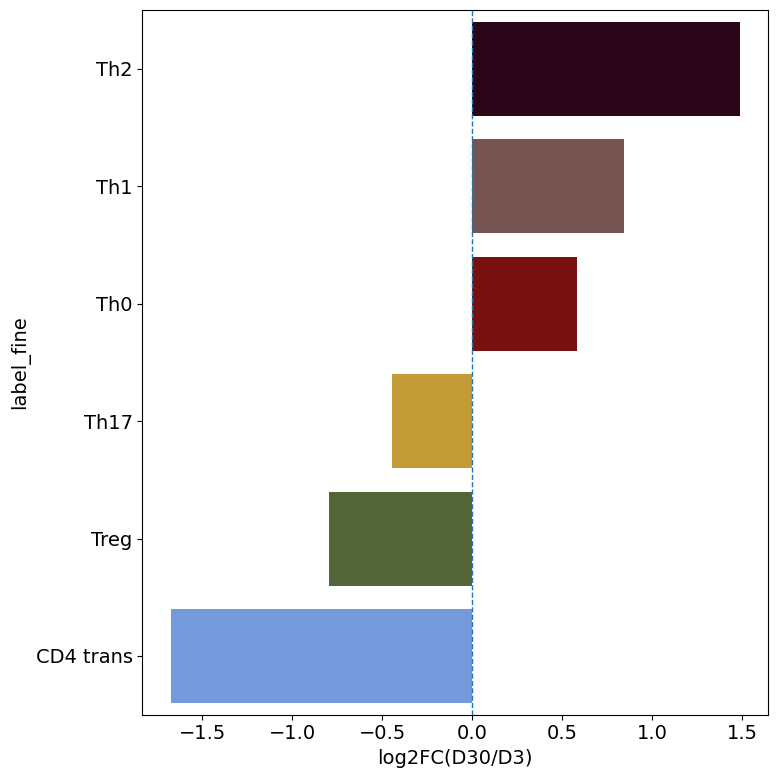

In [80]:
sample_col = 'sample_label'
label_col = 'label_fine'
palette_map = celltype_palette_mapped

adata_cd4 = adata[adata.obs['label_medium']=='CD4 act', :]

plt.rcParams.update({'font.size': 14})


# Summarize counts
summary_df = adata_cd4.obs.groupby([sample_col, label_col]).size().reset_index(name='count')

# Pivot table: zones x celltypes
summary_counts = pd.pivot_table(
    summary_df, values='count', index=sample_col, columns=label_col, fill_value=0
)

# Calculate fractions
row_sums = summary_counts.sum(axis=1)
summary_frac = summary_counts.div(row_sums, axis=0)

# Calculate fraction log2FC
summary_frac = summary_frac.T.reset_index()
summary_frac['log2FC(D30/D3)'] = np.log2(summary_frac['HDM_day30'] / summary_frac['HDM_day3'])
summary_frac['label_fine'] = summary_frac['label_fine'].astype(str)
summary_frac = summary_frac.sort_values(by='log2FC(D30/D3)', ascending=False)

plt.figure(figsize=(8, 8))
sns.barplot(
    data=summary_frac,
    y="label_fine", x="log2FC(D30/D3)",
    orient="h", palette = palette_map
)
plt.axvline(0, linestyle="--", linewidth=1)
plt.tight_layout()
plt.show()



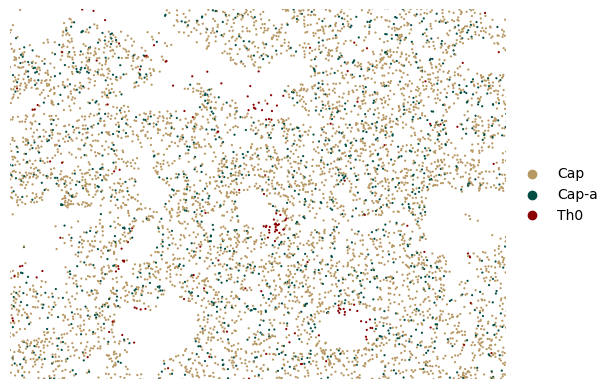

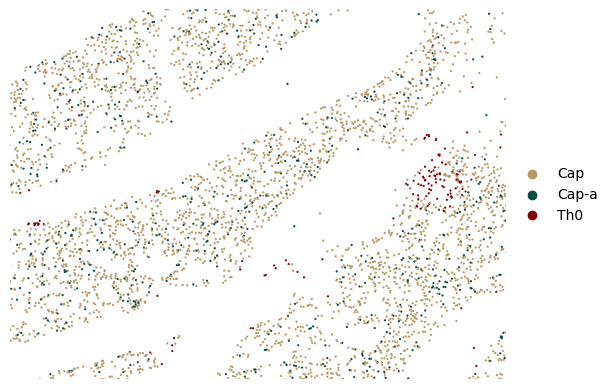

In [22]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample[adata_sample.obs['label_fine'].isin(['Cap', 'Cap-a', 'Th0'])], 
                    basis='spatial', color='label_fine', 
                    palette=celltype_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=10, 
                    # legend_loc = 'none',
                    show=False)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.show()

# Distance within TLS
1. distance from other zone or structure (bronchi, vessels)
2. radial distance from center out


#### Spearman correlation functions

In [11]:
## KA adapted functions

def df_correlation(adata, var):
    """
    Calculate the correlation between an observation and gene expression across the cells in an adata

    Parameters:
    - adata (anndata): The anndata object containing the gene expression
    - var (str): The observation name to correlate with

    Return:
    - results (pd.DataFrame): A dataframe containing the correlation coefficient and p-value for each gene
    """

    mask = ~np.isnan(adata.obs[var])
    rho, p = scipy.stats.spearmanr(adata.obs[var][mask], adata.X.toarray()[mask])
    if isinstance(rho, float):
        # print('skipping results')
        results = pd.DataFrame(
            {"gene": adata.var_names, "rho": 0, "p": 0, "var": var}
        )
    else:
        results = pd.DataFrame(
            {"gene": adata.var_names, "rho": rho[0, 1:], "p": p[0, 1:], "var": var}
        )
    return results





In [12]:
def correlation_swarm(
    df, # correlation results df
    title, # title of plot
    var, # column name to correlate genes with
    pos_corr_name, # names for legend
    neg_corr_name,
    highlight=None, # genes to highlight
    rho_cutoff=0.2, # rho significance cutoff
    tick_label_fontsize=18,  # font size for axis ticks
    legend_fontsize=18,  # font size for legend labels
    annotation_fontsize=22,  # font size for text annotations
):

    # add columns to results df for plotting
    
    # df["color"] = (
    #     df["rho"]
    #     .apply(
    #         lambda x: (
    #             "positive correlation"
    #             if x > rho_cutoff
    #             else "negative correlation" if x < rho_cutoff * -1 else "no correlation"
    #         )
    #     )
    #     .astype("category")
    #     .cat.reorder_categories(
    #         ["positive correlation", "no correlation", "negative correlation"],
    #         ordered=True,
    #     )
    # )

    df["color"] = (
        df["rho"]
        .apply(
            lambda x: (
                pos_corr_name
                if x > rho_cutoff
                else neg_corr_name if x < rho_cutoff * -1 else "no correlation" 
            )
        )
        .astype("category")
    )
    
    # Check if all desired categories are present, and only add missing ones
    desired_categories = [pos_corr_name, "no correlation", neg_corr_name]
    current_categories = df["color"].cat.categories.tolist()
    
    missing_categories = [cat for cat in desired_categories if cat not in current_categories]
    
    if missing_categories:
        df["color"] = df["color"].cat.add_categories(missing_categories)
    
    # Reorder categories
    df["color"] = df["color"].cat.reorder_categories(
        desired_categories, ordered=True
    )
    
    df["size"] = df["rho"].apply(
        lambda x: 2 if x > rho_cutoff else 2 if x < rho_cutoff * -1 else 2
    )
    
    
    
    # initialize figure
    
    fig, ax = plt.subplots(figsize=(8,3))
    # ax.set_aspect(0.5)
    ax.axvline(x=rho_cutoff, linestyle=":", color="#AAAAAA", linewidth=0.5)
    ax.axvline(x=rho_cutoff * -1, linestyle=":", color="#AAAAAA", linewidth=0.5)
    
    # swarmplot
    sns.swarmplot(
        df,
        x="rho",
        # y="var",
        ax=ax,
        s=4,
        hue="color",
        palette = ["#53a5b9", "#D3D3D3","#f03701"] # manually enter from colorbar
        # palette=["#4E79A7", "#EDC94884", "#E15759"],
    )
    
    
    # axis and label setup
    rho_max = np.max(df.rho)
    rho_min = np.min(df.rho)
    ax.legend(bbox_to_anchor=(1.02, 0.99), loc="upper left", borderaxespad=0, fontsize=legend_fontsize)
    # ax.legend(bbox_to_anchor=(0.99,0.99), loc="upper right", borderaxespad=0, fontsize=legend_fontsize)
    # ax.set_title(title)
    ax.set_title('')
    ax.set_ylabel(r"Spearman correlation: $\rho$")
    
    # ax.set_xlim(rho_min - (rho_max - rho_min)*.1,
    #            rho_max + (rho_max - rho_min)*.1)
    # KA set xlims manually
    # ax.set_xlim(-0.3, 0.34)
    ax.set_xlim(-0.2, 0.2)

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.tick_params(axis='both', which='major', labelsize=tick_label_fontsize)
    
    # add labels for n in each positive or negative rho cutoff
    n_pos_rho = np.sum((df["var"] == var) & (df["rho"] > rho_cutoff))
    n_neg_rho = np.sum((df["var"] == var) & (df["rho"] < rho_cutoff * -1))
    # adjust location of text
    pos_text_x = rho_cutoff + 0.06
    neg_text_x = - rho_cutoff -0.06
    ax.text(pos_text_x, -0.2, f"n = {n_pos_rho}", ha="center", fontsize=annotation_fontsize)
    ax.text(neg_text_x, -0.2, f"n = {n_neg_rho}", ha="center", fontsize=annotation_fontsize)
    
    # points (genes) that pass rho cutoff
    filtered_points = df[
        (np.abs(df["rho"]) > rho_cutoff) & (df["gene"].isin(highlight))
    ]
    
    
    # Annotate points with positive correlation
    filtered_points_pos = filtered_points[
        (filtered_points["var"] == var) & (filtered_points["rho"] > 0)
    ]
    filtered_points_pos = filtered_points_pos.sort_values(by=["rho"])
    
    y_offset = 0.12 # 0.08
    y_init = 0.02
    gene_i = 1
    # Annotate selected points
    for index, row in filtered_points_pos.iterrows():
        ax.text(row["rho"], y_init + y_offset*gene_i, f"{row['gene']}", ha="center", va="center", fontsize=annotation_fontsize)
        ax.annotate(
            "",
            xy=(row["rho"], y_init),  # Position of the annotated point
            xytext=(row["rho"], y_init + y_offset*gene_i),  # Position of the text
            arrowprops=dict(arrowstyle="->", color="black", alpha=0.3,linewidth=0.5),  # Arrow style
            ha="center",  # Horizontal alignment of text
            va="center",  # Vertical alignment of text
            fontsize=annotation_fontsize,
        )
        gene_i = gene_i + 1
    
    
    # Annotate points with negative correlation
    filtered_points_neg = filtered_points[
        (filtered_points["var"] == var) & (filtered_points["rho"] < 0)
    ]
    filtered_points_neg = filtered_points_neg.sort_values(by=["rho"])
    
    y_init = 0
    gene_i = 1
    # Annotate selected points
    for index, row in filtered_points_neg.iterrows():
        ax.text(row["rho"], y_init + y_offset*gene_i, f"{row['gene']}", ha="center", va="center", fontsize=annotation_fontsize)
        ax.annotate(
            "",
            xy=(row["rho"], y_init),  # Position of the annotated point
            xytext=(row["rho"], y_init + y_offset*gene_i),  # Position of the text
            arrowprops=dict(arrowstyle="->", color="black", alpha=0.3,linewidth=0.5),  # Arrow style
            ha="center",  # Horizontal alignment of text
            va="center",  # Vertical alignment of text
            fontsize=annotation_fontsize,
        )
        gene_i = gene_i + 1
    
    return (fig, ax)


In [13]:
def run_correlation(adata, var, cell_type = None, 
                    highlight_top_genes = True,
                    extra_highlight_genes=[], plot_spearman=True, 
                    pos_corr_name = "positive correlation", neg_corr_name = "negative correlation",
                   gene_filter_list = None,
                   expression_threshold = None):

    # filter by gene list if provided
    if gene_filter_list is not None:
        print('filtering by provided gene list')
        adata = adata[:, adata.var.index.isin(gene_filter_list)]

    # filter out genes expressed in threshold % of cells
    if expression_threshold is not None:
        print('removing genes expressed in less than ', expression_threshold, ' fraction of cells')
        adata=filter_adata_expressed_in_n_cells(
                adata, fraction = expression_threshold)
    
    # select celltype only
    if cell_type:
        adata = adata[adata.obs['final_labels'] == cell_type, :]
    
    # df correlation 
    var = var
    results = df_correlation(adata, var)
    
    # get top and bottom most correlated genes 
    top_n = 5
    far_genes_df = results.nlargest(top_n, 'rho') # positive correlation with distance
    close_genes_df = results.nsmallest(top_n, 'rho') # negative correlation with distance
    # conver to list
    far_genes = far_genes_df['gene'].tolist()
    close_genes = close_genes_df['gene'].tolist()
    # print(far_genes)
    # print(close_genes)

    if plot_spearman==True:

        if cell_type:
            plot_title = cell_type + '_' + var
        else:
            plot_title = var

        if highlight_top_genes:
            highlight_genes = set(far_genes + close_genes + extra_highlight_genes)
        else: 
            highlight_genes = set(extra_highlight_genes)
            
        # plot spearmann
        correlation_swarm(
            df = results,
            title= plot_title,
            var = var,
            pos_corr_name = pos_corr_name,
            neg_corr_name = neg_corr_name,
            rho_cutoff=0.05,
            highlight= highlight_genes,
        )

    return(results)


In [14]:
from sklearn.preprocessing import PowerTransformer
def scale_structure_distance(adata, dist_col, structure_index_col = 'tls_index'):

    dist_col_scaled = dist_col + '_scaled'
    
    adata.obs[dist_col_scaled] = np.nan

    # loop through each structure
    for single_structure in adata.obs[structure_index_col].unique():

        # subset adata by cluster
        adata_structure_index = adata[adata.obs[structure_index_col] == single_structure, :]

        if pd.notna(single_structure):
    
            # make scaled distance column
            adata_structure_index.obs[dist_col_scaled] = MinMaxScaler().fit_transform(
                PowerTransformer().fit_transform(adata_structure_index.obs[[dist_col]])
            )
            
            # add scaled distance column for this cluster back to main adata
            structure_indices = adata.obs.loc[adata.obs[structure_index_col] == single_structure].index
            adata.obs.loc[structure_indices, dist_col_scaled] = adata_structure_index.obs[dist_col_scaled]
        
    return adata

### 1. Distance within TLS to bronchi or vessels

I already previously calculated the distance to bronchi or vessel zone for the entire tissue. Scale that distance within each TLS from 0 to 1

In [20]:
# structure_index_col = 'tls_index'
# dist_col = 'avg_distance_to_bronchi_zone'
# dist_col_scaled = dist_col + '_scaled'

# # Scale distance within each follicle
# adata_dist_list = []
# for sample_label in adata.obs['sample_label'].unique().tolist():

#     print(sample_label)

#     adata_sample = adata[adata.obs['sample_label']==sample_label, :]

#     adata_sample = scale_structure_distance(adata_sample, dist_col)

#     adata_dist_list.append(adata_sample)

#     # get distance df for each structure and add it back to the main adata object
#     dist_df = adata_sample.obs[[dist_col_scaled]] 
#     adata.obs.loc[dist_df.index, dist_col_scaled] = dist_df[dist_col_scaled]

In [21]:
# structure_index_col = 'tls_index'
# dist_col = 'avg_distance_to_vessels_zone'
# dist_col_scaled = dist_col + '_scaled'

# # Scale distance within each follicle
# adata_dist_list = []
# for sample_label in adata.obs['sample_label'].unique().tolist():

#     print(sample_label)

#     adata_sample = adata[adata.obs['sample_label']==sample_label, :]

#     adata_sample = scale_structure_distance(adata_sample, dist_col)

#     adata_dist_list.append(adata_sample)

#     # get distance df for each structure and add it back to the main adata object
#     dist_df = adata_sample.obs[[dist_col_scaled]] 
#     adata.obs.loc[dist_df.index, dist_col_scaled] = dist_df[dist_col_scaled]

In [22]:
# for sample_label in adata.obs['sample_label'].cat.categories:
#     adata_sample = adata[adata.obs['sample_label']==sample_label, :]
#     sc.pl.embedding(adata_sample, basis="spatial", 
#                     color="avg_distance_to_bronchi_zone_scaled",
#                     # vmax=500,
#                      # size=1,
#                     cmap = colormap_r, legend_loc = None, frameon=False, show=False)
   

In [23]:
# for sample_label in adata.obs['sample_label'].cat.categories:
#     adata_sample = adata[adata.obs['sample_label']==sample_label, :]
#     sc.pl.embedding(adata_sample, basis="spatial", 
#                     color="avg_distance_to_vessels_zone_scaled",
#                     # vmax=500,
#                      # size=1,
#                     cmap = colormap_r, legend_loc = None, frameon=False, show=False)
   

In [24]:
# sample_label = 'HDM_day3'
# adata_plot = adata[adata.obs['sample_label']==sample_label, :]

# adata_vessels = adata_plot[adata_plot.obs['zone_consol'].isin(['bronchi']), :]

# fig = sc.pl.embedding(adata_plot, basis='spatial', 
#                 color = 'avg_distance_to_bronchi_zone_scaled',
#                 cmap = colormap_r,
#                 frameon=False, 
#                 size=20, 
#                 show=False, return_fig=True)

# ax = plt.gca()
# tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
# for p in tls_poly.geoms:
#         ax.plot(*p.exterior.xy, c='black', linewidth=2)

# sc.pl.embedding(adata_vessels, 
#                 basis='spatial', 
#                 color='zone_consol',
#                 palette = zone_consol_palette_mapped,
#                 size=20, 
#                 # legend_loc = 'none',
#                 show=False, title = '', ax=ax)

# for ax in fig.axes:
#     if ax.get_label() == '<colorbar>':  
#         ax.set_yticks([])
#         ax.set_yticklabels([])
        
# # plt.xlim([3700, 4400])
# # plt.ylim([4200, 4900])
# plt.xlim([2500, 4500])
# plt.ylim([3500, 5500])


In [25]:
# sample_label = 'HDM_day3'
# adata_plot = adata[adata.obs['sample_label']==sample_label, :]

# adata_vessels = adata_plot[adata_plot.obs['zone_consol'].isin(['vessels']), :]

# fig = sc.pl.embedding(adata_plot, basis='spatial', 
#                 color = 'avg_distance_to_vessels_zone_scaled',
#                 cmap = colormap_r,
#                 frameon=False, 
#                 size=20, 
#                 show=False, return_fig=True)

# ax = plt.gca()
# tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
# for p in tls_poly.geoms:
#         ax.plot(*p.exterior.xy, c='black', linewidth=2)

# sc.pl.embedding(adata_vessels, 
#                 basis='spatial', 
#                 color='zone_consol',
#                 palette = zone_consol_palette_mapped,
#                 size=20, 
#                 # legend_loc = 'none',
#                 show=False, title = '', ax=ax)

# for ax in fig.axes:
#     if ax.get_label() == '<colorbar>':  
#         ax.set_yticks([])
#         ax.set_yticklabels([])
        
# # plt.xlim([3700, 4400])
# # plt.ylim([4200, 4900])
# plt.xlim([2500, 4500])
# plt.ylim([3500, 5500])


In [26]:
# adata_cd4 = adata[adata.obs['label_medium']=='CD4 act', :]

In [27]:
# # CITE genes expressed in 5% of at least one subset
# gene_df = pd.read_csv('/home/workspace/spatial_mouse_lung_outputs/distance_analysis/ouputs_mouselung_xenseg_HDM/R/cite_expressed_genes_by_annotation.csv')
# genes_cite_filt = gene_df['x'].tolist()

# # Xenium genes expressed in 5% of at least one subset
# genes_xen_filt = []
# adata_cd4 = adata.copy()
# for subset in adata_cd4.obs['label_fine'].unique().tolist():
#     adata_cd4_subset = adata_cd4[adata_cd4.obs['label_fine'] == subset, :]
#     adata_cd4_subset = filter_adata_expressed_in_n_cells(adata_cd4_subset, fraction=0.05)
#     genes_xen_filt.extend(adata_cd4_subset.var.index.tolist())
# genes_xen_filt = list(set(genes_xen_filt))

# # take the intersection 
# genes_cite_xen_filt = list(set(genes_cite_filt) & set(genes_xen_filt))

In [28]:
# sample_label = 'HDM_day3'
# adata_plot = adata_cd4[adata_cd4.obs['sample_label']==sample_label, genes_cite_xen_filt]
# print(adata_plot.shape)

# res_bronchi_cd4 = run_correlation(adata_plot, 'avg_distance_to_bronchi_zone_scaled', 
#                 # extra_highlight_genes=['MKI67', 'AICDA', 'BCL2', 'CCR6'],
#                 # pos_corr_name = "far from bronchi", neg_corr_name = "close to bronchi"
#                )

# res_vessels_cd4 = run_correlation(adata_plot, 'avg_distance_to_vessels_zone_scaled', 
#                 # extra_highlight_genes=['MKI67', 'AICDA', 'BCL2', 'CCR6'],
#                 # pos_corr_name = "far from bronchi", neg_corr_name = "close to bronchi"
#                )


In [29]:
# sample_label = 'HDM_day3'
# adata_plot = adata[adata.obs['sample_label']==sample_label, :]
# print(adata_plot.shape)

# res_bronchi = run_correlation(adata_plot, 'avg_distance_to_bronchi_zone_scaled', 
#                 # extra_highlight_genes=['MKI67', 'AICDA', 'BCL2', 'CCR6'],
#                 # pos_corr_name = "far from bronchi", neg_corr_name = "close to bronchi"
#                )

# res_vessels = run_correlation(adata_plot, 'avg_distance_to_vessels_zone_scaled', 
#                 # extra_highlight_genes=['MKI67', 'AICDA', 'BCL2', 'CCR6'],
#                 # pos_corr_name = "far from bronchi", neg_corr_name = "close to bronchi"
#                )


# Radial distance from center of TLS, incorporating a surrounding ring

2. Create surrounding ring around tls
3. Calculate radial distance from center of tls to edge of tls
4. Calculate ratial distance from center of tls to surrounding edge
5. Scale within tls distance (divide by d_max for each tls)
6. Scale within tls surrounging (divide by tls d_max for associated tls; this will give values > 1)


In [15]:
from shapely.geometry import Point
import geopandas as gpd
from shapely.ops import nearest_points

In [113]:
xen_filepath = os.path.join(dist_out_dir,'adata_distance_zones_structure.h5ad')
adata = sc.read_h5ad(xen_filepath)

### TLS and TLS surroundings radial distance calculations:
1. Create surrounding ring around each tls with specified buffer distance from tls edge
2. For cells in the tls, compute the radial distance to the tls centroid within each tls
3. For cells in the tls surrounding, compute the radial distance to the tls edge
4. Add these values back to adata
5. Create scaled distances: Within tls, scale distance to centroid by max distance to centroid for each tls
6. Create scaled distances: Within tls surrounding, scale distance to tls edge by max distance to edge (eg buffer distance) for each tls surrounding

In [8]:
def create_surrounding_ring(geom, buffer_distance=50):
    """Create a single ring geometry around a polygon (TLS)."""
    return geom.buffer(buffer_distance).difference(geom)

# params
buffer_distance = 50

# Init
adata.obs['tls_surr_index'] = 'none'
adata.obs['tls_radial_dist'] = np.nan
adata.obs['tls_radial_dist_surr'] = np.nan

# Process each sample
for sample_label in adata.obs['sample_label'].cat.categories:

    print(f"Processing sample: {sample_label}")
    
    # Subset AnnData
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]

    # Load TLS geometries
    tls_gdf = gpd.read_file(os.path.join(dist_out_dir, f'tls_gdf_{sample_label}.geojson'))

    # Add centroid columns
    tls_gdf["tls_centroid_x"] = tls_gdf.geometry.centroid.x
    tls_gdf["tls_centroid_y"] = tls_gdf.geometry.centroid.y

    # Create surrounding ring geometry
    tls_gdf['geometry_ring'] = tls_gdf.geometry.apply(create_surrounding_ring, buffer_distance=buffer_distance)

    # --- Prepare TLS core and ring GeoDataFrames ---
    core_gdf = tls_gdf[['id', 'tls_centroid_x', 'tls_centroid_y', 'geometry']]
    ring_gdf = tls_gdf[['id', 'geometry_ring']].rename(columns={'geometry_ring': 'geometry'})
    ring_gdf['tls_surr_index'] = ring_gdf['id']
    core_gdf = gpd.GeoDataFrame(core_gdf, crs=tls_gdf.crs)
    ring_gdf = gpd.GeoDataFrame(ring_gdf, crs=tls_gdf.crs)

    # --- Build cell coordinate GeoDataFrame --- CORE
    points_df = adata_sample.obs[['x_centroid', 'y_centroid']].copy()
    points_gdf = gpd.GeoDataFrame(
        points_df,
        geometry=gpd.points_from_xy(points_df.x_centroid, points_df.y_centroid),
        crs=core_gdf.crs
    )

    # --- Spatial join: cells in TLS cores ---
    core_joined = gpd.sjoin(points_gdf, core_gdf, how='left', predicate='within')
    core_joined = core_joined[~core_joined['id'].isna()]
    core_joined['tls_radial_dist'] = np.hypot(
        core_joined['x_centroid'] - core_joined['tls_centroid_x'],
        core_joined['y_centroid'] - core_joined['tls_centroid_y']
    )
    adata.obs.loc[core_joined.index, 'tls_radial_dist'] = core_joined['tls_radial_dist']




    
    # --- Spatial join: cells in TLS surrounding rings ---
    ring_joined = gpd.sjoin(points_gdf, ring_gdf, how='left', predicate='within')
    ring_joined = ring_joined[~ring_joined['tls_surr_index'].isna()]
    adata.obs.loc[ring_joined.index, 'tls_surr_index'] = ring_joined['tls_surr_index'].astype(str)

    # Before spatial join, add cell index to points_gdf
    points_gdf["cell_index"] = points_df.index
    
    # Re-do spatial join a
    ring_joined = gpd.sjoin(points_gdf, ring_gdf, how='left', predicate='within')
    
    # Drop NaNs
    ring_joined = ring_joined[~ring_joined['tls_surr_index'].isna()]

    # compute tls surrounding distance
    # Merge with original TLS geometry for edge distance
    ring_joined = ring_joined.merge(
        tls_gdf[['id', 'geometry']],
        left_on='tls_surr_index', right_on='id', how='left',
        suffixes=('', '_tls')
    )
    
    # Compute distance to TLS edge (not center!)
    from shapely.ops import nearest_points
    tls_surr_edge_dists = []
    
    for _, row in ring_joined.iterrows():
        cell_pt = row['geometry']
        tls_geom = row['geometry_tls']
        
        if cell_pt is not None and tls_geom is not None:
            edge_pt = nearest_points(cell_pt, tls_geom.boundary)[1]
            dist = cell_pt.distance(edge_pt)
            tls_surr_edge_dists.append(dist)
        else:
            tls_surr_edge_dists.append(np.nan)
    
    # Assign distances to column
    ring_joined['tls_radial_dist_surr'] = tls_surr_edge_dists
    

    # Assign back using cell_index
    adata.obs.loc[ring_joined['cell_index'], 'tls_radial_dist_surr'] = ring_joined['tls_radial_dist_surr'].values


# Make category dtype
adata.obs['tls_surr_index'] = adata.obs['tls_surr_index'].astype('category')

# Set surrounding ring fields to NaN for cells inside TLS
in_tls_mask = adata.obs['tls_index'].notna()
adata.obs.loc[in_tls_mask, 'tls_surr_index'] = np.nan
adata.obs.loc[in_tls_mask, 'tls_radial_dist_surr'] = np.nan


Processing sample: HDM_day3


ERROR 1: PROJ: proj_create_from_database: Open of /home/workspace/environment/space2/share/proj failed


Processing sample: HDM_day30


In [9]:
# Initialize scaled columns
adata.obs['tls_radial_dist_scaled'] = np.nan
adata.obs['tls_radial_dist_surr_scaled'] = np.nan

# Loop through each TLS
for tls_id in adata.obs['tls_index'].dropna().unique():
    # Get cells assigned to this TLS (both core and surround)
    in_core = adata.obs['tls_index'] == tls_id
    in_surr = adata.obs['tls_surr_index'] == tls_id
    in_tls = in_core | in_surr

    # Skip if no distances exist
    if in_core.sum() == 0:
        continue

    # Get max distance from within-TLS cells
    max_core_dist = adata.obs.loc[in_core, 'tls_radial_dist'].max()
    # Get max distance from surrounding (should be equal to buffer distance)
    max_surr_dist = adata.obs.loc[in_surr, 'tls_radial_dist_surr'].max()

    # Scale core
    adata.obs.loc[in_core, 'tls_radial_dist_scaled'] = adata.obs.loc[in_core, 'tls_radial_dist'] / max_core_dist

    # Scale surround
    adata.obs.loc[in_surr, 'tls_radial_dist_surr_scaled'] = adata.obs.loc[in_surr, 'tls_radial_dist_surr'] / max_surr_dist


In [10]:
### Now make a column that combines the scaled distance with in tls and within surrounding
adata.obs['tls_radial_dist_scaled_combined'] = adata.obs['tls_radial_dist_scaled'].copy()
adata.obs.loc[~adata.obs['tls_surr_index'].isna(), 'tls_radial_dist_scaled_combined'] = 1 + adata.obs['tls_radial_dist_surr_scaled']


In [11]:
print('tsls')
print(np.min(adata.obs['tls_radial_dist']))
print(np.max(adata.obs['tls_radial_dist']))

print('surrounding')
print(np.min(adata.obs['tls_radial_dist_surr']))
print(np.max(adata.obs['tls_radial_dist_surr']))

tsls
0.06622491338696726
197.81449026999874
surrounding
0.0007300046656959201
49.99566606332586


In [12]:
print('tsls scaled')
print(np.min(adata.obs['tls_radial_dist_scaled']))
print(np.max(adata.obs['tls_radial_dist_scaled']))

print('surrounding scaled')
print(np.min(adata.obs['tls_radial_dist_surr_scaled']))
print(np.max(adata.obs['tls_radial_dist_surr_scaled']))

tsls scaled
0.0009939386596666629
1.0
surrounding scaled
1.4619776206325238e-05
1.0


In [13]:
print(np.max(adata.obs['tls_radial_dist_scaled_combined']))

2.0


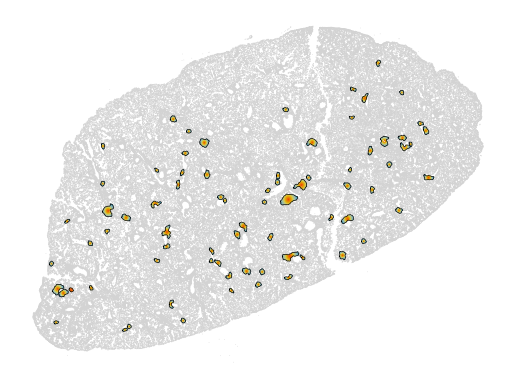

In [14]:
sample_label = 'HDM_day3'
    
# get sample subset of adata 
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
        
fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'tls_radial_dist_scaled',
                # color = 'tls_radial_dist_surr_scaled',
                      # color = 'tls_radial_dist_scaled_combined',
                      title='',
                cmap = colormap_r,
                      colorbar_loc=None,
                frameon=False, 
                size=1, 
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=0.5)

# plt.xlim([2500, 6500])
# plt.ylim([2500, 6500])
plt.savefig(os.path.join(plot_out_dir, "tls_radial_tls_dist.png"), dpi=300, bbox_inches='tight', transparent=True)

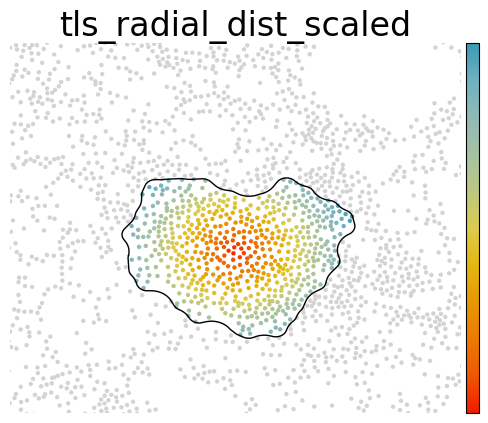

In [15]:
sample_label = 'HDM_day3'
    
# get sample subset of adata 
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
    
fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'tls_radial_dist_scaled',
                cmap = colormap_r,
                frameon=False, 
                size=40, 
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=1)

for ax in fig.axes:
    if ax.get_label() == '<colorbar>':  
        ax.set_yticks([])
        ax.set_yticklabels([])

# plt.xlim([2500, 6500])
# plt.ylim([2500, 6500])
plt.xlim([3800, 4200])
plt.ylim([4300, 4700])
plt.savefig(os.path.join(plot_out_dir, "tls_zoom_radial_tls_dist_colorbar.png"), dpi=300, bbox_inches='tight', transparent=True)


#### Make a quick colorbar for figure panels!

In [113]:
import matplotlib.cm as cm
# Define the colormap
cmap = colormap_r  # or e.g., cm.viridis_r, cm.Reds, etc.

# Create a dummy scalar mappable for the colorbar
norm = mcolors.Normalize(vmin=0, vmax=1)
sm = cm.ScalarMappable(norm=norm, cmap=cmap)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(1, 4))  # adjust size as needed

# Add the colorbar to the axis
cb = fig.colorbar(sm, cax=ax)

# Remove ticks and labels
cb.ax.set_yticks([])
cb.ax.set_yticklabels([])

# Remove outline
cb.outline.set_visible(False)

# Save the figure
fig.savefig(os.path.join(plot_out_dir, "colormap_r_clean.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.close(fig)

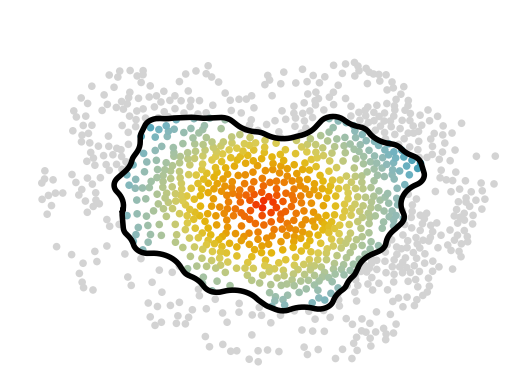

In [28]:
sample_label ='HDM_day3'
    
# get sample subset of adata 
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
adata_sample = adata_sample[~adata_sample.obs['tls_radial_category'].isna(), :]

fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'tls_radial_dist_scaled',
                # color = 'tls_radial_dist_surr_scaled',
                cmap = colormap_r,
                      title='',
                frameon=False, 
                size=120, 
                      colorbar_loc=None,
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)

# plt.xlim([2500, 6500])
# plt.ylim([2500, 6500])
plt.xlim([3830, 4160])
plt.ylim([4320, 4650])
plt.savefig(os.path.join(plot_out_dir, "tls_zoom_radial_tls_dist.png"), dpi=300, bbox_inches='tight', transparent=True)


In [25]:
plot_out_dir

'/home/workspace/spatial_mouse_lung_outputs/downstream_analysis/distance/plots_updates'

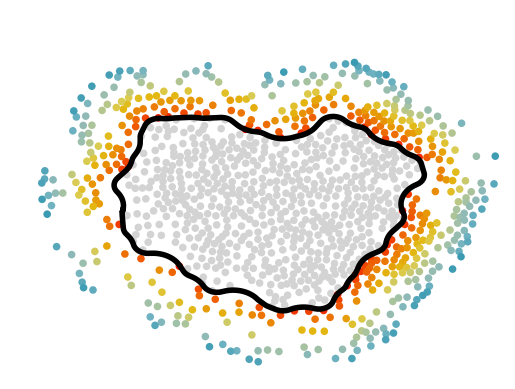

In [27]:
sample_label ='HDM_day3'
    
# get sample subset of adata 
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
adata_sample = adata_sample[~adata_sample.obs['tls_radial_category'].isna(), :]

fig = sc.pl.embedding(adata_sample, basis='spatial', 
                # color = 'tls_radial_dist_scaled',
                color = 'tls_radial_dist_surr_scaled',
                cmap = colormap_r,
                      title='',
                frameon=False, 
                size=120, 
                      colorbar_loc=None,
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)

# plt.xlim([2500, 6500])
# plt.ylim([2500, 6500])
plt.xlim([3830, 4160])
plt.ylim([4320, 4650])
plt.savefig(os.path.join(plot_out_dir, "tls_zoom_radial_surr_dist.png"), dpi=300, bbox_inches='tight', transparent=True)


In [29]:
celltype_palette_mapped

{'AT1': '#ffff00',
 'AT2': '#1ce6ff',
 'Club': '#ff34ff',
 'Ciliated': '#ff4a46',
 'SMC': '#008941',
 'Col13a1+ fibroblast': '#006fa6',
 'Col14a1+ fibroblast': '#a30059',
 'Myofibroblast': '#ffdbe5',
 'Pericyte 1': '#7a4900',
 'Pericyte 2': '#0000a6',
 'Mesothelial': '#63ffac',
 'Cap': '#b79762',
 'Cap-a': '#004d43',
 'Art': '#8fb0ff',
 'Vein': '#997d87',
 'Lymph': '#5a0007',
 'Mono': '#809693',
 'Int Mf': '#6a3a4c',
 'Alv Mf': '#1b4400',
 'Neut': '#4fc601',
 'cDC1': '#3b5dff',
 'Ccr7- cDC2': '#4a3b53',
 'Ccr7+ cDC2': '#ff2f80',
 'B cell': '#61615a',
 'Plasmablast': '#ba0900',
 'NK cell': '#6b7900',
 'gd T cell': '#00c2a0',
 'ILC2': '#ffaa92',
 'CD8 naive': '#ff90c9',
 'CD8 act': '#b903aa',
 'CD4 naive': '#d16100',
 'Th0': 'darkred',
 'CD4 trans': 'cornflowerblue',
 'Th1': '#7b4f4b',
 'Th17': 'goldenrod',
 'Th2': '#300018',
 'Treg': 'darkolivegreen'}

In [23]:
# categorize cells into tls core, tls outer, or tls surrounding
adata.obs['tls_radial_category'] = pd.cut(adata.obs['tls_radial_dist_scaled'], bins=2, labels=False)
adata.obs.loc[adata.obs['tls_radial_dist_scaled_combined']<=0.5, 'tls_radial_category'] = 'tls core'
adata.obs.loc[adata.obs['tls_radial_dist_scaled_combined']>0.5, 'tls_radial_category'] = 'tls outer'
adata.obs.loc[adata.obs['tls_radial_dist_scaled_combined']>1.0, 'tls_radial_category'] = 'tls surround'
# adata.obs['tls_radial_dist_scaled_bin'] = adata.obs['tls_radial_dist_scaled_bin'] / np.max(adata.obs['tls_radial_dist_scaled_bin']
radial_category_palette = {'tls core': 'darkgreen', 
                           'tls outer':'palegreen', 
                           'tls surround':'darkkhaki'}

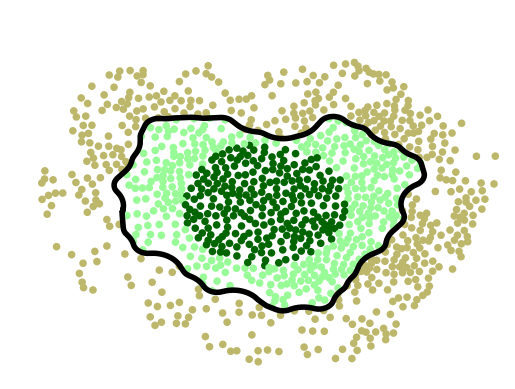

In [26]:
sample_label ='HDM_day3'
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
adata_sample = adata_sample[~adata_sample.obs['tls_radial_category'].isna(), :]

fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'tls_radial_category', 
                      palette = radial_category_palette,
                      title='',
                frameon=False, 
                size=120, 
                legend_loc = 'none',
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)

# plt.xlim([2500, 6500])
# plt.ylim([2500, 6500])
plt.xlim([3830, 4160])
plt.ylim([4320, 4650])
plt.savefig(os.path.join(plot_out_dir, "tls_zoom_radial_categories.png"), dpi=300, bbox_inches='tight', transparent=True)

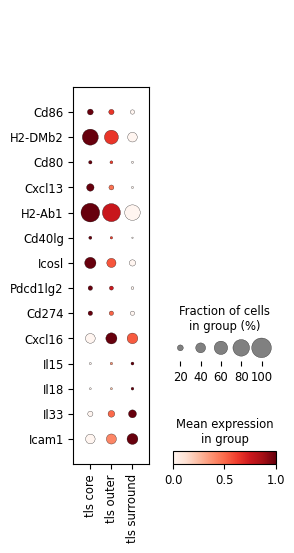

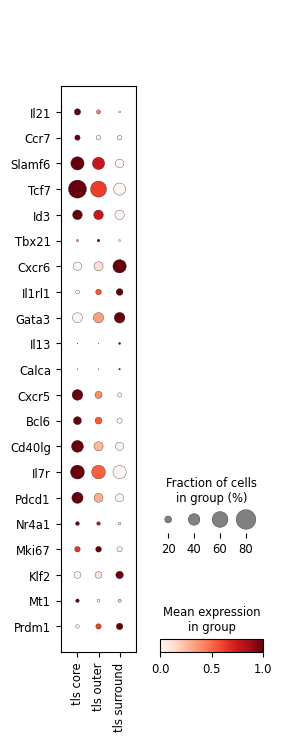

In [21]:
ligands_highlight = ['Cd86', 'H2-DMb2', 'Cd80', 'Cxcl13', 'H2-Ab1', 
                     'Cd40lg', 'Icosl', 'Pdcd1lg2', 'Cd274', 
                     'Cxcl16', 'Il15', 'Il18', 'Il33', 'Icam1'    
]
genes_highlight_tls = ['Il21', 'Ccr7', 'Slamf6', 'Tcf7', 'Id3', 'Tbx21', 'Cxcr6', 'Il1rl1', 'Gata3', 'Il13', 'Calca',
                       'Cxcr5', 'Bcl6', 'Cd40lg', 'Il7r',
                      'Pdcd1', 'Nr4a1', 'Mki67',
                      'Klf2', 'Mt1', 'Prdm1']
sc.pl.dotplot(adata, var_names = ligands_highlight, groupby='tls_radial_category', standard_scale = 'var', swap_axes=True)
sc.pl.dotplot(adata[adata.obs['label_medium']=='CD4 act', :], var_names = genes_highlight_tls, groupby='tls_radial_category', standard_scale = 'var', swap_axes=True)

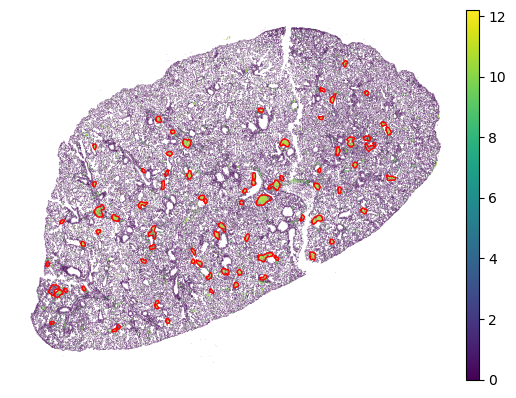

In [29]:
sample_label ='HDM_day3'
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]

fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'Cd79a',     
                # cmap = colormap_r,
                frameon=False, 
                # size=50, 
                title = '',
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='red', linewidth=1)


## Plot composition of cells in each category, with a separate dot for each TLS

This plotting function is currently wrong, because it's including the tls surroundings in the total counts for each tls! 

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from statannotations.Annotator import Annotator

def plot_celltype_tls_fraction(adata, celltypes, ncols=3, figsize=(12, 4), palette='tab10'):
    """
    Plot bar plots showing per-TLS cell type fraction across spatial categories.

    Parameters:
    - adata: AnnData object with obs columns 'label_fine', 'tls_index', 'tls_radial_category'
    - celltypes: list of cell types to plot
    - ncols: number of columns for subplots
    - figsize: tuple for overall figure size
    - palette: seaborn color palette for bars
    """
    # Ensure required columns exist
    required_cols = ['label_fine', 'tls_index','tls_surr_index', 'tls_radial_category']
    for col in required_cols:
        if col not in adata.obs.columns:
            raise ValueError(f"Missing required column in adata.obs: '{col}'")
    
    df = adata.obs.copy()
    df = df[df['tls_index'].notna() | df['tls_surr_index'].notna()]  # Only use cells inside a TLS or surroundings
    df['tls_index'] = df['tls_index'].astype(str)
    df.loc[~df['tls_surr_index'].isna(), 'tls_index'] = df['tls_surr_index'].astype(str)

    # Count all cells per tls_index and category
    total_counts = df.groupby(['tls_index', 'tls_radial_category']).size().reset_index(name='total_cells')

    nrows = -(-len(celltypes) // ncols)  # ceiling division
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False)
    axes = axes.flatten()

    celltypes_df = []
    for i, celltype in enumerate(celltypes):
        ax = axes[i]

        # Count cells of this type
        df_sub = df[df['label_fine'] == celltype]
        ct_counts = df_sub.groupby(['tls_index', 'tls_radial_category']).size().reset_index(name='ct_count')

        # Merge with total counts to compute fractions
        merged = pd.merge(total_counts, ct_counts, how='left',
                          on=['tls_index', 'tls_radial_category'])
        merged['ct_count'] = merged['ct_count'].fillna(0)
        merged['fraction'] = merged['ct_count'] / merged['total_cells']

        # Compute means for bars
        bar_means = merged.groupby('tls_radial_category')['fraction'].mean().reset_index()

        # Plot
        sns.barplot(
            data=merged,
            x='tls_radial_category',
            y='fraction',
            ax=ax,
            palette=palette,
            errorbar = 'ci',
            # ci='se',  # Show standard error
            capsize=0.1,
            errwidth=3,
            # alpha=0.7
        )
        # sns.barplot(data=bar_means, x='tls_radial_category', y='fraction', ax=ax,
        #             palette=palette, ci=None, alpha=0.7)
        sns.stripplot(data=merged, x='tls_radial_category', y='fraction', ax=ax,
                      color='black', alpha=0.6, jitter=0.1, size=3)

        ax.set_title(celltype, fontsize=12)
        ax.set_ylabel("Fraction")
        ax.set_xlabel("")

        # # Perform t-tests and annotate
        # categories = merged['tls_radial_category'].unique()
        # categories = sorted(categories)
        # pairs = [(a, b) for i, a in enumerate(categories) for b in categories[i+1:]]
    
        # if len(pairs) > 0:
        #     annotator = Annotator(ax, pairs, data=merged, x='tls_radial_category', y='fraction')
        #     annotator.configure(test='t-test_ind', text_format='star', loc='outside', verbose=0)
        #     annotator.apply_and_annotate()

        merged['celltype'] = celltype
        celltypes_df.append(merged)

    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

    dfs_concat = pd.concat(celltypes_df)
    return(dfs_concat)


In [296]:
sample_label = 'HDM_day3'
adata_select = adata[adata.obs['sample_label']==sample_label, :]
print(adata_select.shape)
adata_select = adata_select[~adata_select.obs['tls_radial_category'].isna(), :]
print(adata_select.shape)

tls_counts = pd.DataFrame(adata_select.obs['label_fine'].value_counts())
tls_counts['frac'] = tls_counts / sum(tls_counts['count'])

celltypes = tls_counts[tls_counts['frac']>0.005].index.tolist()
# celltypes = tls_counts.sort_values(by='frac', ascending=False).head(10).index.tolist()


(355812, 480)
(38988, 480)


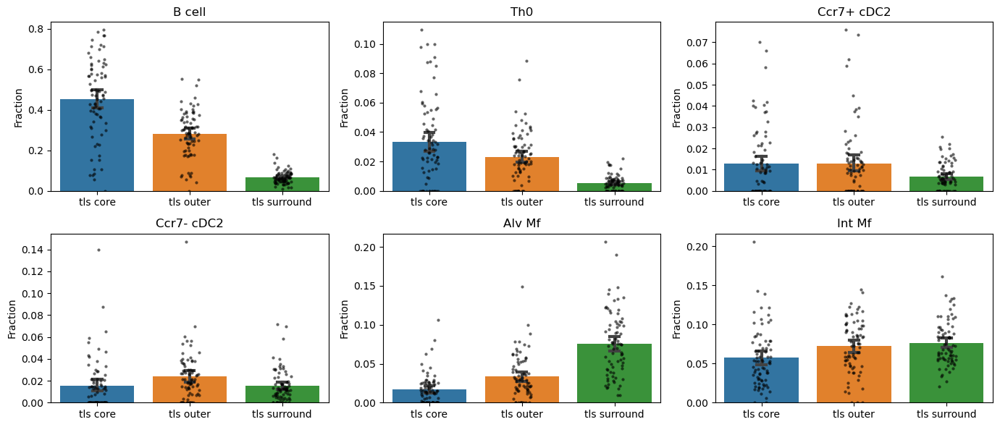

In [297]:
df = plot_celltype_tls_fraction(adata_select, celltypes=['B cell', 'Th0',
                                                    'Ccr7+ cDC2', 'Ccr7- cDC2', 'Alv Mf', 'Int Mf',
                                                   ], figsize=(14, 6))


In [281]:
df

,tls_index,tls_radial_category,total_cells,ct_count,fraction,celltype
0,0.0,tls core,47,5.0,0.106383,B cell
1,0.0,tls outer,57,5.0,0.087719,B cell
2,0.0,tls surround,292,17.0,0.058219,B cell
3,1.0,tls core,197,98.0,0.497462,B cell
4,1.0,tls outer,196,39.0,0.198980,B cell
...,...,...,...,...,...,...
223,8.0,tls outer,47,3.0,0.063830,Int Mf
224,8.0,tls surround,120,6.0,0.050000,Int Mf
225,9.0,tls core,38,3.0,0.078947,Int Mf
226,9.0,tls outer,56,3.0,0.053571,Int Mf


In [282]:
df_core = df[df['tls_radial_category']=='tls core']
df_core_b = df_core[df_core['celltype']=='B cell']
df_core_b

,tls_index,tls_radial_category,total_cells,ct_count,fraction,celltype
0,0.0,tls core,47,5.0,0.106383,B cell
3,1.0,tls core,197,98.0,0.497462,B cell
6,10.0,tls core,50,11.0,0.220000,B cell
9,11.0,tls core,61,29.0,0.475410,B cell
12,12.0,tls core,224,144.0,0.642857,B cell
...,...,...,...,...,...,...
213,73.0,tls core,36,2.0,0.055556,B cell
216,74.0,tls core,152,87.0,0.572368,B cell
219,75.0,tls core,70,32.0,0.457143,B cell
222,8.0,tls core,48,16.0,0.333333,B cell


In [286]:
df_core_b.sort_values(by='total_cells').head(25)

,tls_index,tls_radial_category,total_cells,ct_count,fraction,celltype
135,5.0,tls core,29,0.0,0.000000,B cell
213,73.0,tls core,36,2.0,0.055556,B cell
150,54.0,tls core,36,3.0,0.083333,B cell
225,9.0,tls core,38,3.0,0.078947,B cell
21,15.0,tls core,38,18.0,0.473684,B cell
171,60.0,tls core,39,22.0,0.564103,B cell
204,70.0,tls core,41,23.0,0.560976,B cell
111,42.0,tls core,41,15.0,0.365854,B cell
0,0.0,tls core,47,5.0,0.106383,B cell
30,18.0,tls core,47,16.0,0.340426,B cell


# Save 

In [195]:
# adata.write_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure_tls_dist_categories.h5ad'), compression='gzip')
# adata = sc.read_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure_tls_dist.h5ad'))

### First create surrounding ring for each tls with index matching the corresponding tls index

In [36]:
def create_surrounding_ring(row, buffer_distance=50):
    """
    Create a single surrounding ring geometry around a follicle.

    Parameters:
    - row: A row of the GeoDataFrame containing the original geometry.
    - buffer_distance: Distance outward to buffer from the original geometry.

    Returns:
    - A shapely geometry representing the ring.
    """
    original_geom = row['geometry']
    outer_buffer = original_geom.buffer(buffer_distance)
    ring = outer_buffer.difference(original_geom)
    return ring

# initial new column in adata
adata.obs['tls_surr_index'] = 'none'

for sample_label in adata.obs['sample_label'].cat.categories:

    # Subset
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
    
    # Load GeoDataFrame and apply surrounding ring
    tls_gdf = gpd.read_file(os.path.join(dist_out_dir, f'tls_gdf_{sample_label}.geojson'))
    tls_gdf['geometry_ring'] = tls_gdf.apply(create_surrounding_ring, buffer_distance=buffer_distance, axis=1)
    
    # Flatten to GeoDataFrame
    ring_records = [{
        'geometry': row['geometry_ring'],
        'tls_surr_index': row['id'] if 'id' in row else i
    } for i, row in tls_gdf.iterrows()]
    structure_gdf = gpd.GeoDataFrame(ring_records, crs=tls_gdf.crs)

    # Cell coordinates
    points_df = adata_sample.obs[['x_centroid', 'y_centroid']].copy()
    points_gdf = gpd.GeoDataFrame(
        points_df,
        geometry=gpd.points_from_xy(points_df.x_centroid, points_df.y_centroid),
        crs=structure_gdf.crs
    )

    # Spatial join
    joined_gdf = gpd.sjoin(points_gdf, structure_gdf, how="left", predicate="within")
    joined_gdf = joined_gdf.reset_index().drop_duplicates(subset='index').set_index('index')

    # Update adata
    adata.obs.loc[joined_gdf.index, 'tls_surr_index'] = joined_gdf['tls_surr_index']
    
adata.obs['tls_surr_index'] = adata.obs['tls_surr_index'].astype('category')


In [39]:
adata[~adata.obs['tls_surr_index'].isna(), :].obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,...,vessels_centroid_x,vessels_centroid_y,avg_distance_to_bronchi_zone,avg_distance_to_vessels_zone,avg_distance_to_TLS_zone,distance_to_tls,distance_to_bronchi,inside_tls,inside_bronchi,tls_surr_index
abcijjle-1_0,abcijjle-1,6120.148926,2974.156006,304.0,0.0,0.0,0.0,0.0,0.0,304.0,...,NaN,NaN,474.617811,82.643843,42.755350,25.756911,454.345484,False,False,4.0
abddhaie-1_0,abddhaie-1,6186.295410,2988.291504,154.0,0.0,0.0,0.0,0.0,0.0,154.0,...,NaN,NaN,415.560693,21.905977,41.655530,25.884687,393.781682,False,False,4.0
abddiodg-1_0,abddiodg-1,6244.221191,2976.004639,134.0,0.0,0.0,0.0,0.0,0.0,134.0,...,6257.088697,2997.745672,356.706560,0.000000,50.140513,32.837626,334.774847,False,False,4.0
abddkbbd-1_0,abddkbbd-1,6197.945312,3008.796143,198.0,0.0,0.0,0.0,0.0,0.0,198.0,...,6257.088697,2997.745672,410.857228,0.000000,60.750790,41.410441,389.073550,False,False,4.0
abddmjnj-1_0,abddmjnj-1,6202.320801,2999.286621,247.0,0.0,0.0,0.0,0.0,0.0,247.0,...,6257.088697,2997.745672,403.620687,0.000000,51.609739,31.480744,381.810592,False,False,4.0


### Next, calculate distance to edge of tls and distance to edge of surrounding ring

In [41]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    
    # get sample subset of adata 
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]

    # add column for radial distance
    adata_sample.obs['tls_radial_dist'] = np.nan
    
    # load follicle GeoDataFrame and create surrounding rings ---
    tls_gdf = gpd.read_file(os.path.join(dist_out_dir, f'tls_gdf_{sample_label}.geojson'))
    
    # add tls centroid column
    tls_gdf["tls_centroid_x"] = tls_gdf.geometry.centroid.x
    tls_gdf["tls_centroid_y"] = tls_gdf.geometry.centroid.y
    
    # build GeoDataFrame of cell coordinates 
    points_df = adata_sample.obs[['x_centroid', 'y_centroid']].copy()
    points_gdf = gpd.GeoDataFrame(
        points_df,
        geometry=gpd.points_from_xy(points_df.x_centroid, points_df.y_centroid),
        crs=tls_gdf.crs
    )
    
    # this provides a gdf now where every row is a cell, and if it lies within a TLS, it will have the structure info for that tls 
    joined_gdf = gpd.sjoin(points_gdf, tls_gdf, how="left", predicate="within")
    
    # subset to only the cells that lie within TLS
    joined_gdf = joined_gdf[~joined_gdf['id'].isna()]
    
    # now for ever tls, compute the distance of each cell in the tls to the center of the tls
    joined_gdf['tls_radial_dist'] = np.hypot(
        joined_gdf["x_centroid"] - joined_gdf["tls_centroid_x"],
        joined_gdf["y_centroid"] - joined_gdf["tls_centroid_y"])
        
    # update adata with this information
    adata_sample.obs.loc[joined_gdf.index, 'tls_radial_dist'] = joined_gdf['tls_radial_dist']

    # scale distance within each tls
    # adata_sample = scale_structure_distance(adata_sample, dist_col='tls_radial_dist')

    # add to main adata
    
    dist_df = adata_sample.obs[['tls_radial_dist', 'tls_radial_dist_scaled']] 
    adata.obs.loc[dist_df.index, 'tls_radial_dist'] = dist_df['tls_radial_dist']
    # adata.obs.loc[dist_df.index, 'tls_radial_dist_scaled'] = dist_df['tls_radial_dist_scaled']





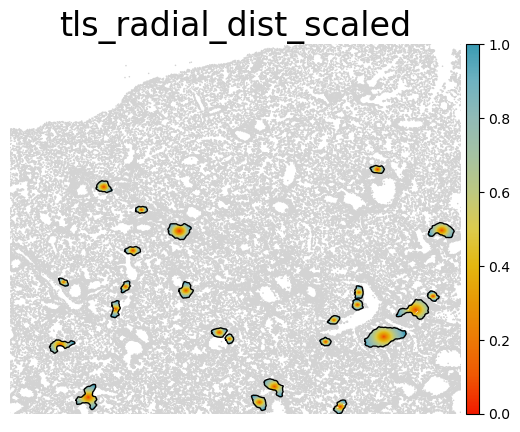

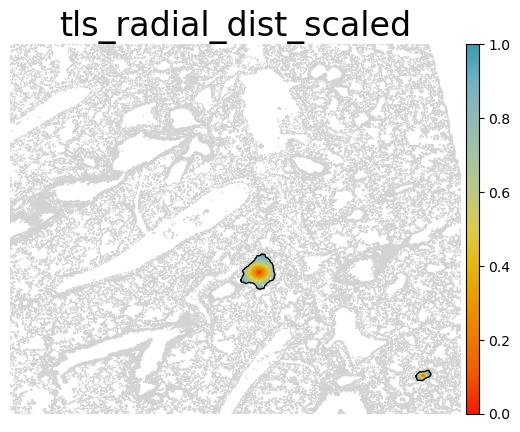

In [42]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    
    # get sample subset of adata 
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
        
    fig = sc.pl.embedding(adata_sample, basis='spatial', 
                    # color = 'tls_radial_dist',
                          color = 'tls_radial_dist_scaled',
                    cmap = colormap_r,
                    frameon=False, 
                    size=5, 
                    show=False, return_fig=True)
    
    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=1)
    
    plt.xlim([2500, 6500])
    plt.ylim([2500, 6500])


In [40]:
# def create_surrounding_rings(row, buffer_distance=10, n_bins=1):
#     """
#     Create multiple concentric ring geometries around a follicle by incrementally buffering outward.

#     Parameters:
#     - row: A row of the GeoDataFrame containing the original geometry.
#     - buffer_distance: Total distance outward to buffer 
#     - n_bins: Number of concentric rings to create.

#     Returns:
#     - List of ring geometries from inner to outer.
#     """
#     original_geom = row['geometry']
#     bin_step = buffer_distance / n_bins
#     rings = []

#     for i in range(1, n_bins + 1):
#         outer_buffer = original_geom.buffer(i * bin_step)
#         inner_buffer = original_geom.buffer((i - 1) * bin_step)
#         ring = outer_buffer.difference(inner_buffer)
#         rings.append(ring)

#     return rings


# # initial new column in adata
# adata.obs['tls_surr_index'] = 'none'
# # for surrounding ring, use radius of 50 um, and just 1 bin
# buffer_distance = 50
# n_bins = 1

# # --- 1. Define Parameters ---
# for sample_label in adata.obs['sample_label'].cat.categories:

#     # --- 2. Get sample subset of adata ---
#     adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
    
#     # --- 3. Load  GeoDataFrame and create surrounding rings ---
#     tls_gdf = gpd.read_file(os.path.join(dist_out_dir, f'tls_gdf_{sample_label}.geojson'))
#     tls_gdf['surrounding_ring'] = tls_gdf.apply(create_surrounding_rings, buffer_distance=buffer_distance, n_bins = n_bins, axis=1)
    
#     # --- 4. Flatten rings into a GeoDataFrame with bin and index ---
#     ring_records = []
#     for i, row in tls_gdf.iterrows():
#         for bin_idx, geom in enumerate(row['surrounding_ring']):
#             ring_records.append({
#                 'geometry': geom,
#                 'surr_ring_bin': bin_idx / (n_bins - 1),
#                 'tls_surr_index': row['id'] if 'id' in row else i
#             })
    
#     structure_gdf = gpd.GeoDataFrame(ring_records, crs=tls_gdf.crs)
    
#     # --- 5. Build GeoDataFrame of cell coordinates ---
#     points_df = adata_sample.obs[['x_centroid', 'y_centroid']].copy()
#     points_gdf = gpd.GeoDataFrame(
#         points_df,
#         geometry=gpd.points_from_xy(points_df.x_centroid, points_df.y_centroid),
#         crs=structure_gdf.crs
#     )

#     # --- 6. Spatial join: map cells to rings (can have duplicates) ---
#     joined_gdf = gpd.sjoin(points_gdf, structure_gdf, how="left", predicate="within")
    
#     # --- 6.1 Keep only assignment with lowest surr_ring_bin for each cell ---
#     joined_gdf = joined_gdf.reset_index()
#     joined_gdf = joined_gdf.sort_values('surr_ring_bin').drop_duplicates(subset='index')
#     joined_gdf = joined_gdf.set_index('index')

#     # --- 7. Update adata_multitissue.obs ---
#     adata.obs.loc[joined_gdf.index, 'tls_surr_index'] = joined_gdf['tls_surr_index'] #.astype('str')
#     adata.obs.loc[joined_gdf.index, 'surr_ring_bin'] = joined_gdf['surr_ring_bin']
    
# adata.obs['tls_surr_index'] = adata.obs['tls_surr_index'].astype('category')


In [26]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    
    # get sample subset of adata 
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]

    # add column for radial distance
    adata_sample.obs['tls_radial_dist'] = np.nan
    
    # load follicle GeoDataFrame and create surrounding rings ---
    tls_gdf = gpd.read_file(os.path.join(dist_out_dir, f'tls_gdf_{sample_label}.geojson'))
    
    # add tls centroid column
    tls_gdf["tls_centroid_x"] = tls_gdf.geometry.centroid.x
    tls_gdf["tls_centroid_y"] = tls_gdf.geometry.centroid.y
    
    # build GeoDataFrame of cell coordinates 
    points_df = adata_sample.obs[['x_centroid', 'y_centroid']].copy()
    points_gdf = gpd.GeoDataFrame(
        points_df,
        geometry=gpd.points_from_xy(points_df.x_centroid, points_df.y_centroid),
        crs=tls_gdf.crs
    )
    
    # this provides a gdf now where every row is a cell, and if it lies within a TLS, it will have the structure info for that tls 
    joined_gdf = gpd.sjoin(points_gdf, tls_gdf, how="left", predicate="within")
    
    # subset to only the cells that lie within TLS
    joined_gdf = joined_gdf[~joined_gdf['id'].isna()]
    
    # now for ever tls, compute the distance of each cell in the tls to the center of the tls
    joined_gdf['tls_radial_dist'] = np.hypot(
        joined_gdf["x_centroid"] - joined_gdf["tls_centroid_x"],
        joined_gdf["y_centroid"] - joined_gdf["tls_centroid_y"])
        
    # update adata with this information
    adata_sample.obs.loc[joined_gdf.index, 'tls_radial_dist'] = joined_gdf['tls_radial_dist']

    # scale distance within each tls
    adata_sample = scale_structure_distance(adata_sample, dist_col='tls_radial_dist')

    # add to main adata
    
    dist_df = adata_sample.obs[['tls_radial_dist', 'tls_radial_dist_scaled']] 
    adata.obs.loc[dist_df.index, 'tls_radial_dist'] = dist_df['tls_radial_dist']
    adata.obs.loc[dist_df.index, 'tls_radial_dist_scaled'] = dist_df['tls_radial_dist_scaled']





ERROR 1: PROJ: proj_create_from_database: Open of /home/workspace/environment/space2/share/proj failed


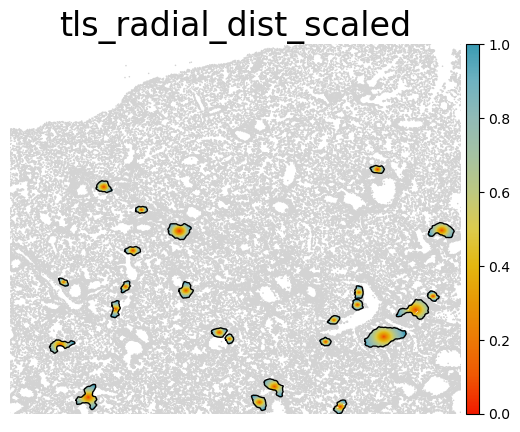

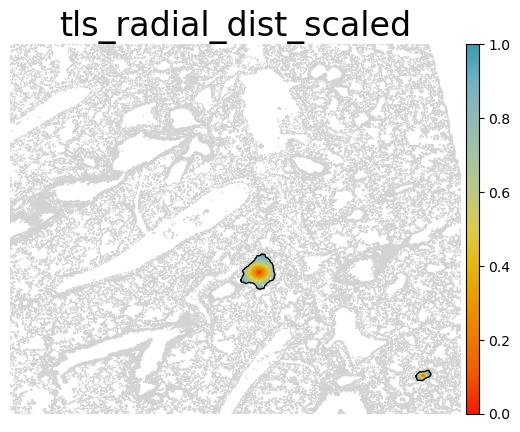

In [27]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    
    # get sample subset of adata 
    adata_sample = adata[adata.obs['sample_label'] == sample_label, :]
        
    fig = sc.pl.embedding(adata_sample, basis='spatial', 
                    # color = 'tls_radial_dist',
                          color = 'tls_radial_dist_scaled',
                    cmap = colormap_r,
                    frameon=False, 
                    size=5, 
                    show=False, return_fig=True)
    
    ax = plt.gca()
    tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
    for p in tls_poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=1)
    
    plt.xlim([2500, 6500])
    plt.ylim([2500, 6500])


In [56]:
# make binned version of tls_radial_dist_scaled - first try equal dist bins
n_radial_bins = 5
adata.obs['tls_radial_dist_scaled_bin'] = pd.cut(adata.obs['tls_radial_dist_scaled'], bins=n_radial_bins, labels=False)
adata.obs['tls_radial_dist_scaled_bin'] = adata.obs['tls_radial_dist_scaled_bin'] / np.max(adata.obs['tls_radial_dist_scaled_bin'])

# # also try bins with equal numbers of cells - quantile - 
# # the quantile method makes more sense when computing separately for each TLS rather than across all TLS 
# adata.obs['tls_radial_dist_scaled_bin_quantile'] = pd.qcut(adata.obs['tls_radial_dist_scaled'], q=n_radial_bins, labels=False)
# adata.obs['tls_radial_dist_scaled_bin_quantile'] = adata.obs['tls_radial_dist_scaled_bin_quantile'] / np.max(adata.obs['tls_radial_dist_scaled_bin_quantile'])

(4300.0, 4700.0)

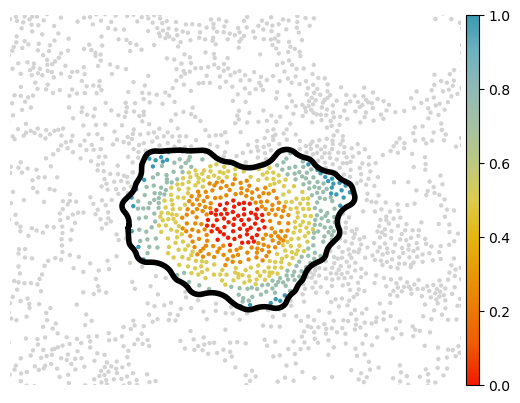

In [57]:
sample_label ='HDM_day3'
adata_sample = adata[adata.obs['sample_label'] == sample_label, :]

fig = sc.pl.embedding(adata_sample, basis='spatial', 
                color = 'tls_radial_dist_scaled_bin',     
                cmap = colormap_r,
                frameon=False, 
                size=40, 
                title = '',
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)

plt.xlim([3800, 4200])
plt.ylim([4300, 4700])
# plt.savefig(os.path.join(plot_out_dir, "distance_day3_tls_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

In [68]:
print(np.max(adata.obs['tls_radial_dist']))

197.81449026999874


### Make tls radial category, which for each tls will classify cells as in (1) tls core, (2) tls outer, (3) tls surround

In [99]:
# adata.obs['tls_radial_category'] = pd.cut(adata.obs['tls_radial_dist_scaled'], bins=2, labels=False)
# adata.obs.loc[adata.obs['tls_radial_category']==0, 'tls_radial_category'] = 'tls core'
# adata.obs.loc[adata.obs['tls_radial_category']==1, 'tls_radial_category'] = 'tls outer'
# adata.obs.loc[~adata.obs['tls_surr_index'].isna(), 'tls_radial_category'] = 'tls surround'
# # adata.obs['tls_radial_dist_scaled_bin'] = adata.obs['tls_radial_dist_scaled_bin'] / np.max(adata.obs['tls_radial_dist_scaled_bin']

In [158]:
adata.obs['tls_radial_category'].unique()

array([nan, 'tls surround', 'tls core', 'tls outer'], dtype=object)

In [160]:
adata.obs['tls_radial_category'].value_counts()

tls_radial_category
tls surround    21414
tls core        11109
tls outer       10336
Name: count, dtype: int64

# Save / Load

In [ ]:
# adata.write_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure_tls_dist.h5ad'), compression='gzip')
# adata = sc.read_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure_tls_dist.h5ad'))

## Correlations along distance

(355812, 480)


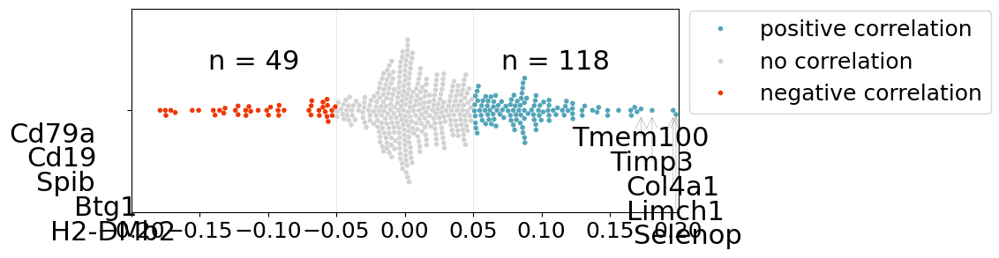

In [94]:
sample_label = 'HDM_day3'
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
print(adata_plot.shape)

res_tls_scaled = run_correlation(adata_plot, 'tls_radial_dist_scaled')



(8658, 184)


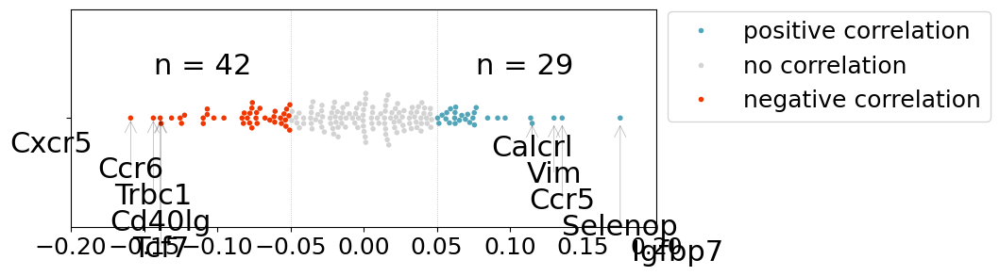

In [103]:
sample_label = 'HDM_day3'
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[adata_plot.obs['label_medium']=='CD4 act', genes_cite_xen_filt]
print(adata_plot.shape)

res_tls_scaled_cd4 = run_correlation(adata_plot, 'tls_radial_dist_scaled')

## Plotting along radial TLS distance

In [105]:
import scvelo as scv
def scvelo_heatmap(
    adata: sc.AnnData,
    sample_label: list[str],
    sortby: str,
    key_name: str,
    key_value: str = None,
    highlight: list[str] = None,
    n_bins: int = 5,
    col_color = None, 
    palette = None,
    x_clip = None,
    expression_threshold = None, 
    figsize: tuple = None 
):
    """
    Create a heatmap to visualize gene expression trends in single-cell RNA-seq data,
    with options for subsetting, sorting, and highlighting genes.

    Parameters:
    - adata (sc.AnnData): Annotated data object containing single-cell RNA-seq data.
    - sample_label (List[str]): List of batch identifiers to subset the data.
    - key_name (str): String representing the key in `adata.obs` to use for subsetting cells.
    - key_value (str): String representing the value of `key_name` to subset to.
    - sortby (str): Variable to sort the heatmap by (e.g., "crypt_villi_axis").
    - highlight (List[str]): List of labels to highlight on the heatmap.
    - n_bins (int, optional): Integer specifying the number of bins to use for convolution (default: 5).

    Returns:
    - s (seaborn.matrix.ClusterGrid): Matplotlib figure object representing the heatmap.

    This function subsets the input data based on specified sample_labels and key-value pairs,
    filters genes expressed in a minimum percentage of cells, and creates a heatmap
    to visualize gene expression trends along a specified variable. The function also allows
    highlighting specific labels on the y-axis.
    """
    print("Creating Heatmap for sample labels ", " + ".join(sample_label))

    # Subset sample_label
    adata = adata[adata.obs["sample_label"].isin(sample_label)]
    if key_value:
        print(f"Subset to '{key_name}'=='{key_value}'")
        # Subset to key
        adata = adata[adata.obs[key_name] == key_value]
    else:
        print("using all cells")
        
    # Filter to include only genes that are expressed in 5% of the cells
    if expression_threshold:
        print('removing genes by expression threshold: ', expression_threshold, ' fraction')
        adata=filter_adata_expressed_in_n_cells(adata,fraction=expression_threshold)
    else:
        adata = adata.copy()
    print('adata shape: ', adata.shape)

    # Clip x axis
    if x_clip:
        print('clipping x to ', x_clip)
        print('max value before clip ', np.max(adata.obs[sortby]))
        adata = adata[adata.obs[sortby] <= x_clip, :]
        # adata.obs.loc[adata.obs[sortby] > x_clip, sortby] = x_clip
    else: 
        adata = adata.copy()
        
    n_convolve = len(adata) // n_bins
    print(f"Setting `n_convolve` to {n_convolve} ({n_bins} bins, {len(adata)} cells) ")
    # Plot
    s = scv.pl.heatmap(
        adata,
        var_names=adata.var_names,
        sortby=sortby,
        n_convolve=n_convolve,
        show=False,
        yticklabels=True,
        rasterized=True,
        # color_map=colormap,
        color_map='viridis',
        col_color = col_color,
        palette = palette, 
        figsize=figsize
        
    )
    ax = s.ax_heatmap

    # Loop through the x-axis tick labels and show/hide based on the 'highlight' list
    if highlight:
        for i, label in enumerate(ax.get_yticklabels()):
            if label.get_text() not in highlight:
                label.set_visible(False)
                ax.get_yticklines()[2 * i + 1].set_visible(False)
            ax.get_yticklines()[2 * i].set_visible(False)
    else:
        # Make sure all labels and ticks are visible
        for label in ax.get_yticklabels():
            label.set_visible(True)
    
        for tickline in ax.get_yticklines():
            tickline.set_visible(False)  # optional: hide all tick lines
        

    ax.set_xlabel("")
    ax.set_title("")
    return s

In [19]:
genes_highlight_tls = ['Il21', 'Ccr7', 'Slamf6', 'Tcf7', 'Id3', 'Tbx21', 'Cxcr6', 'Il1rl1', 'Gata3', 'Il13', 'Calca',
                       'Cxcr5', 'Bcl6', 'Cd40lg', 'Il7r',
                      'Pdcd1', 'Tigit', 'Nr4a1', 'Mki67',
                      'Klf2', 'Mt1', 'Prdm1']

In [82]:
# CITE genes expressed in 5% of at least one subset
gene_df = pd.read_csv('/home/workspace/spatial_mouse_lung_outputs/distance_analysis/ouputs_mouselung_xenseg_HDM/R/cite_expressed_genes_by_annotation.csv')
genes_cite_filt = gene_df['x'].tolist()

# Xenium genes expressed in 5% of at least one subset
genes_xen_filt = []
adata_cd4 = adata.copy()
for subset in adata_cd4.obs['label_fine'].unique().tolist():
    adata_cd4_subset = adata_cd4[adata_cd4.obs['label_fine'] == subset, :]
    adata_cd4_subset = filter_adata_expressed_in_n_cells(adata_cd4_subset, fraction=0.05)
    genes_xen_filt.extend(adata_cd4_subset.var.index.tolist())
genes_xen_filt = list(set(genes_xen_filt))

# take the intersection 
genes_cite_xen_filt = list(set(genes_cite_filt) & set(genes_xen_filt))

HDM_day3
Creating Heatmap for sample labels  HDM_day3
Subset to 'label_medium'=='CD4 act'
adata shape:  (1082, 184)
Setting `n_convolve` to 216 (5 bins, 1082 cells) 


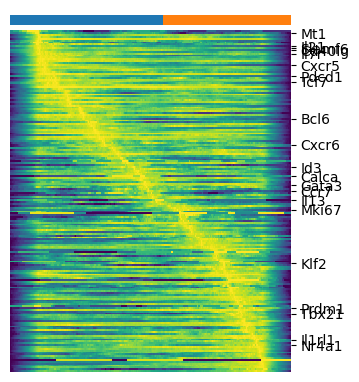

In [106]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[~adata_plot.obs['tls_radial_dist_scaled'].isna(), :]
adata_plot.obs['tls_radial_category'] = adata_plot.obs['tls_radial_category'].astype('category')
s = scvelo_heatmap(
    adata_plot[:,genes_cite_xen_filt],
    sample_label=[sample_label],
    sortby = 'tls_radial_dist_scaled',
    key_name = 'label_medium',
    key_value = 'CD4 act',
    col_color = 'tls_radial_category',
    palette = radial_category_palette,
    highlight = genes_highlight_tls,
    expression_threshold= None, # already using a filtered gene list 
    figsize=(4,4)
)
s
# plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls-zone_CD4.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [87]:
radial_category_palette

{'tls core': 'darkgreen',
 'tls outer': 'palegreen',
 'tls surround': 'yellowgreen'}

HDM_day3
Creating Heatmap for sample labels  HDM_day3
Subset to 'label_medium'=='CD4 act'
removing genes by expression threshold:  0.05  fraction
adata shape:  (1610, 164)
Setting `n_convolve` to 322 (5 bins, 1610 cells) 


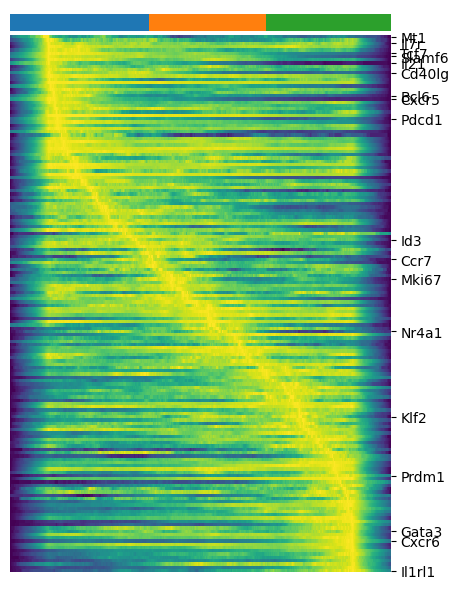

In [107]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[~adata_plot.obs['tls_radial_dist_scaled_combined'].isna(), :]
s = scvelo_heatmap(
    adata_plot[:,genes_cite_xen_filt],
    sample_label=[sample_label],
    sortby = 'tls_radial_dist_scaled_combined',
    key_name = 'label_medium',
    key_value = 'CD4 act',
    col_color = 'tls_radial_category',
    palette = radial_category_palette,
    highlight = genes_highlight_tls,
    expression_threshold= 0.05, # filter in addition to genes cite filter (since now analyze just the tls associated subset)
    figsize=(5,6)
    # figsize=(5,16)
)
s
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls_radial_dist_scaled_combined_CD4.pdf"), dpi=300, bbox_inches='tight', transparent=True)
# plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls_radial_dist_scaled_combined_CD4_showallgenes.pdf"), dpi=300, bbox_inches='tight', transparent=True)


## ligands

In [93]:
df_lr = pd.read_csv('/home/workspace/spatial_tls_manuscript/inputs/interaction_input_CellChatDB.csv')

ligands = df_lr['ligand'].tolist()

ligands_panel = list(set(ligands) & set(adata.var.index))
len(ligands_panel)

99

In [98]:
ligands_highlight = ['Cd86', 'H2-DMb2', 'Cd80', 'Cxcl13', 'H2-Ab1', 
                     'Cd40lg', 'Icosl', 'Pdcd1lg2', 'Cd274', 
                     'Cxcl16', 'Il15', 'Il18', 'Il33', 'Icam1'    
]

HDM_day3
Creating Heatmap for sample labels  HDM_day3
using all cells
removing genes by expression threshold:  0.05  fraction
adata shape:  (18790, 53)
Setting `n_convolve` to 3758 (5 bins, 18790 cells) 


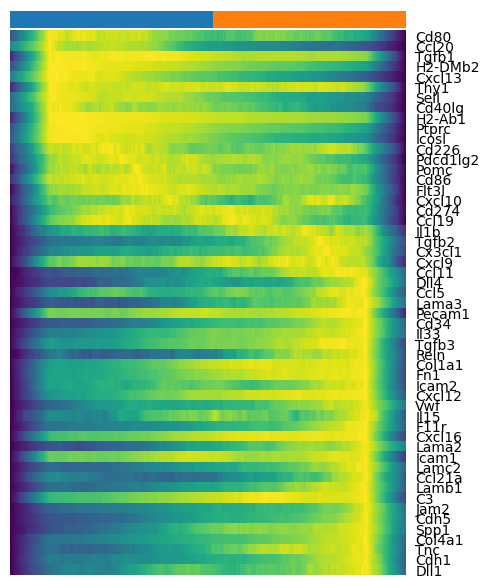

In [95]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[~adata_plot.obs['tls_radial_dist_scaled'].isna(), :]
s = scvelo_heatmap(
    adata_plot[:,ligands_panel],
    sample_label=[sample_label],
    sortby = 'tls_radial_dist_scaled',
    key_name = 'label_medium',
    col_color = 'tls_radial_category',
    key_value = None,
    highlight = None,
    expression_threshold= 0.05,
    figsize=(5,6)
)
s
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls_radial_dist_scaled_allcells_ligands_showallgenes.pdf"), dpi=300, bbox_inches='tight', transparent=True)

HDM_day3
Creating Heatmap for sample labels  HDM_day3
using all cells
removing genes by expression threshold:  0.05  fraction
adata shape:  (38988, 54)
Setting `n_convolve` to 7797 (5 bins, 38988 cells) 


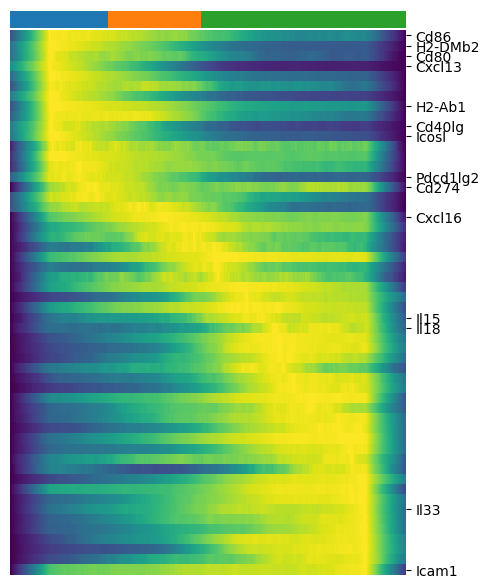

In [100]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[~adata_plot.obs['tls_radial_dist_scaled_combined'].isna(), :]
s = scvelo_heatmap(
    adata_plot[:,ligands_panel],
    sample_label=[sample_label],
    sortby = 'tls_radial_dist_scaled_combined',
    key_name = 'label_medium',
    col_color = 'tls_radial_category',
    palette = radial_category_palette,
    key_value = None,
    highlight = ligands_highlight,
    expression_threshold= 0.05,
    figsize=(5,6)
)
s
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls_radial_dist_scaled_combined_allcells_ligands.pdf"), dpi=300, bbox_inches='tight', transparent=True)


HDM_day3
Creating Heatmap for sample labels  HDM_day3
using all cells
removing genes by expression threshold:  0.05  fraction
adata shape:  (355812, 50)
clipping x to  450
Setting `n_convolve` to 3758 (5 bins, 18790 cells) 
HDM_day30
Creating Heatmap for sample labels  HDM_day30
using all cells
removing genes by expression threshold:  0.05  fraction
adata shape:  (237425, 43)
clipping x to  450
Setting `n_convolve` to 531 (5 bins, 2655 cells) 


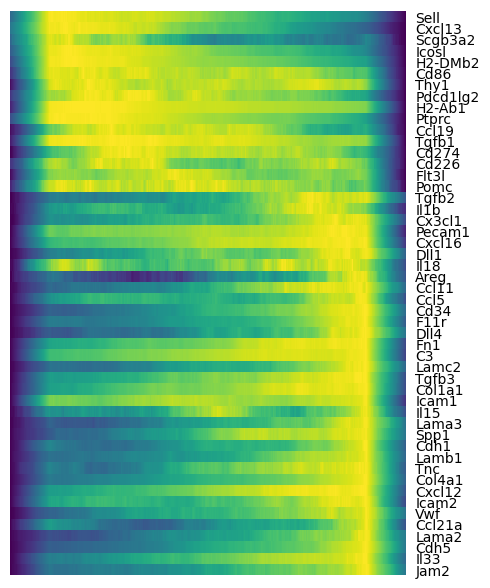

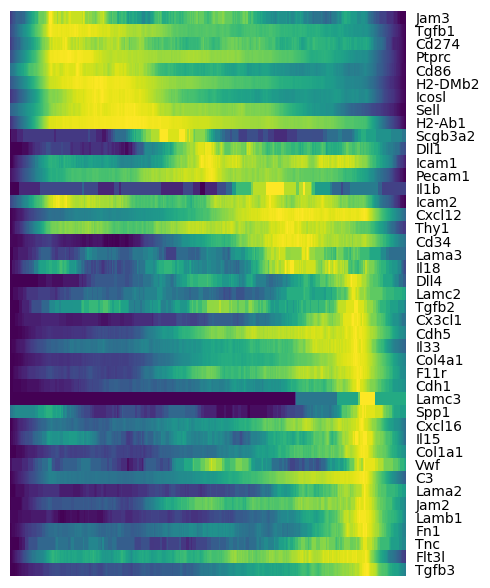

In [176]:
for sample_label in adata.obs['sample_label'].cat.categories:
    print(sample_label)
    adata_plot = adata[adata.obs['sample_label']==sample_label, :]
    s = scvelo_heatmap(
        adata_plot[:,ligands_panel],
        sample_label=[sample_label],
        sortby = 'tls_radial_dist_scaled',
        key_name = 'label_medium',
        key_value = None,
        highlight = None,
        # x_clip = 450,
        expression_threshold= 0.05,
        figsize=(5,6)
    )
    s
    # plt.savefig(os.path.join(plot_out_dir, "HDM_day3_scVelo_tls-structure_allcells_cyto.pdf"), dpi=300, bbox_inches='tight', transparent=True)

HDM_day3
Creating Heatmap for sample labels  HDM_day3
Subset to 'label_fine'=='B cell'
removing genes by expression threshold:  0.05  fraction
adata shape:  (23754, 41)
clipping x to  450
Setting `n_convolve` to 1525 (5 bins, 7628 cells) 
HDM_day30
Creating Heatmap for sample labels  HDM_day30
Subset to 'label_fine'=='B cell'
removing genes by expression threshold:  0.05  fraction
adata shape:  (5394, 38)
clipping x to  450
Setting `n_convolve` to 231 (5 bins, 1157 cells) 


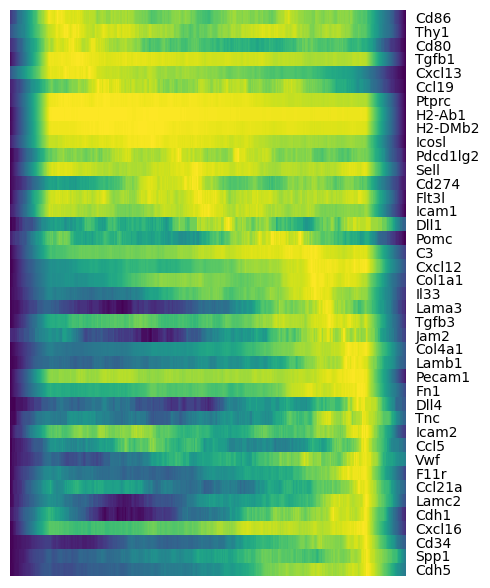

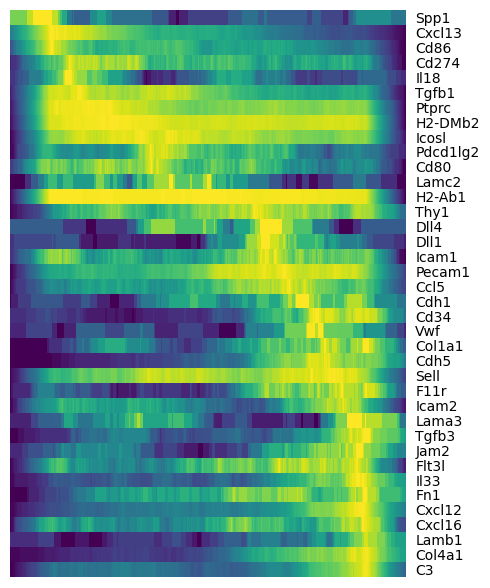

In [183]:
for sample_label in adata.obs['sample_label'].cat.categories:
    print(sample_label)
    adata_plot = adata[adata.obs['sample_label']==sample_label, :]
    s = scvelo_heatmap(
        adata_plot[:,ligands_panel],
        sample_label=[sample_label],
        sortby = 'tls_radial_dist_scaled',
        key_name = 'label_fine',
        key_value = 'B cell',
        highlight = None,
        x_clip = 450,
        expression_threshold= 0.05,
        figsize=(5,6)
    )
    s
    # plt.savefig(os.path.join(plot_out_dir, "HDM_day3_scVelo_tls-structure_allcells_cyto.pdf"), dpi=300, bbox_inches='tight', transparent=True)

### Composition plotting

In [60]:
sample_label = 'HDM_day3'
adata_select = adata[adata.obs['sample_label']==sample_label, :]
print(adata_select.shape)
adata_select = adata_select[~adata_select.obs['tls_radial_dist_scaled_bin'].isna(), :]
print(adata_select.shape)

tls_counts = pd.DataFrame(adata_select.obs['label_fine'].value_counts())
tls_counts['frac'] = tls_counts / sum(tls_counts['count'])

celltypes = tls_counts[tls_counts['frac']>0.01].index.tolist()
celltypes = tls_counts.sort_values(by='frac', ascending=False).head(10).index.tolist()


(355812, 480)
(18790, 480)


In [62]:
celltypes

['B cell',
 'AT2',
 'gd T cell',
 'Int Mf',
 'Cap',
 'Col14a1+ fibroblast',
 'Th0',
 'Plasmablast',
 'Alv Mf',
 'cDC1']

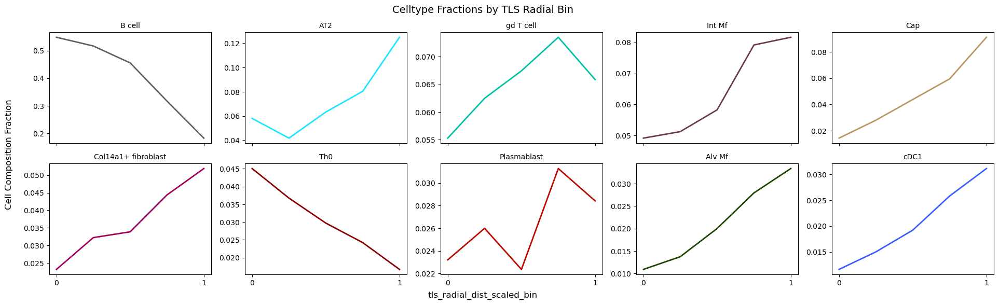

In [63]:
cells_plot = adata_select.obs['label_fine'].unique().tolist()
cells_plot = celltypes
x_axis_col = 'tls_radial_dist_scaled_bin'

# compute counts and fractions per dist bin
composition_counts = adata_select.obs.groupby([x_axis_col, 'label_fine']).size().unstack(fill_value=0)
composition_fractions = composition_counts.div(composition_counts.sum(axis=1), axis=0)
composition_fractions.reset_index(inplace=True)

# melt the df
composition_long = composition_fractions.melt(id_vars=x_axis_col, var_name='celltype', value_name='fraction')

# subset to only the cell types of interest 
composition_long = composition_long[composition_long['celltype'].isin(cells_plot)]

# === Create Subplots ===

n_cells = len(cells_plot)
n_cols = 5  # Customize number of columns
n_rows = math.ceil(n_cells / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True, sharey=False)
axes = axes.flatten()

for i, celltype in enumerate(cells_plot):
    ax = axes[i]
    subset = composition_long[composition_long['celltype'] == celltype]

    ax.plot(
        subset[x_axis_col], 
        subset['fraction'], 
        lw=2,
        label=celltype,
        color=celltype_palette_mapped.get(celltype, "gray")
    )
    ax.set_title(celltype, fontsize=10)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['0', '1'], fontsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.text(0.5, 0.04, x_axis_col, ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Cell Composition Fraction', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.suptitle("Celltype Fractions by TLS Radial Bin", fontsize=14)
plt.show()



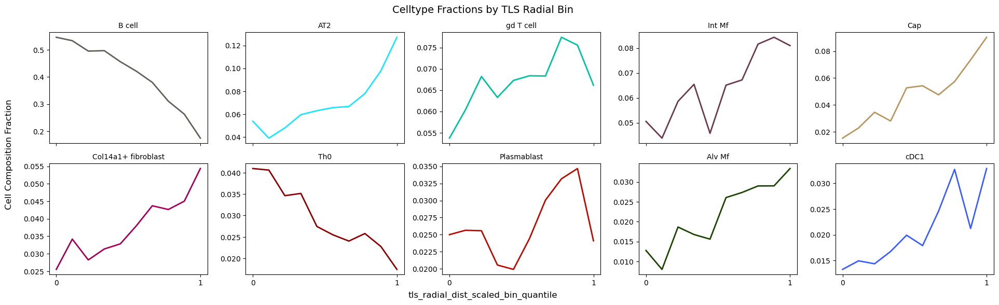

In [246]:
cells_plot = adata_select.obs['label_fine'].unique().tolist()
cells_plot = celltypes
x_axis_col = 'tls_radial_dist_scaled_bin_quantile'

# compute counts and fractions per dist bin
composition_counts = adata_select.obs.groupby([x_axis_col, 'label_fine']).size().unstack(fill_value=0)
composition_fractions = composition_counts.div(composition_counts.sum(axis=1), axis=0)
composition_fractions.reset_index(inplace=True)

# melt the df
composition_long = composition_fractions.melt(id_vars=x_axis_col, var_name='celltype', value_name='fraction')

# subset to only the cell types of interest 
composition_long = composition_long[composition_long['celltype'].isin(cells_plot)]

# === Create Subplots ===

n_cells = len(cells_plot)
n_cols = 5  # Customize number of columns
n_rows = math.ceil(n_cells / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True, sharey=False)
axes = axes.flatten()

for i, celltype in enumerate(cells_plot):
    ax = axes[i]
    subset = composition_long[composition_long['celltype'] == celltype]

    ax.plot(
        subset[x_axis_col], 
        subset['fraction'], 
        lw=2,
        label=celltype,
        color=celltype_palette_mapped.get(celltype, "gray")
    )
    ax.set_title(celltype, fontsize=10)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['0', '1'], fontsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.text(0.5, 0.04, x_axis_col, ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Cell Composition Fraction', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.suptitle("Celltype Fractions by TLS Radial Bin", fontsize=14)
plt.show()



In [ ]:
#########################

In [ ]:
import numpy as np
from shapely.geometry import Point, Polygon, MultiPolygon
from tqdm import  tqdm

def calculate_distances_to_regions(adata, dist_out_dir):
    """
    Calculate distances from each cell to the closest TLS and bronchi regions.
    Also determine if cells are inside these regions.
    
    Parameters
    ----------
    adata : AnnData
        The AnnData object containing spatial coordinates of cells
    dist_out_dir : str
        Directory where polygon files are stored
    
    Returns
    -------
    adata : AnnData
        Updated AnnData object with distance and boolean columns
    """
    # Create new columns in adata.obs for storing distances and boolean flags
    adata.obs['distance_to_tls'] = np.nan
    adata.obs['distance_to_bronchi'] = np.nan
    adata.obs['inside_tls'] = False
    adata.obs['inside_bronchi'] = False
    
    # Process each sample separately
    for sample_label in adata.obs['sample_label'].cat.categories:
        print(f"Processing sample: {sample_label}")
        
        # Get cells for current sample
        sample_mask = adata.obs['sample_label'] == sample_label
        
        # Load TLS polygons for this sample
        tls_poly_path = os.path.join(dist_out_dir, f'tls_poly_{sample_label}.pkl')
        tls_poly = joblib.load(tls_poly_path)
        
        # Load bronchi polygons for this sample
        bronchi_poly_path = os.path.join(dist_out_dir, f'bronchi_poly_{sample_label}.pkl')
        bronchi_poly = joblib.load(bronchi_poly_path)
        
        # Get spatial coordinates for cells in this sample
        coords = adata[sample_mask].obsm['spatial']
        
        # Calculate distances and check if cells are inside regions
        distances_to_tls = []
        distances_to_bronchi = []
        inside_tls_flags = []
        inside_bronchi_flags = []
        
        for i, (x, y) in tqdm(enumerate(coords), total=len(coords), desc=f"Processing {sample_label}", ncols=100):
            # Create point for current cell
            point = Point(x, y)
            
            # Check TLS regions
            min_dist_tls = float('inf')
            is_inside_tls = False
            
            # Handle potential MultiPolygon case
            if isinstance(tls_poly, MultiPolygon):
                tls_polygons = list(tls_poly.geoms)
            else:
                tls_polygons = [tls_poly]
                
            for poly in tls_polygons:
                # Check if point is inside polygon
                if poly.contains(point):
                    min_dist_tls = 0
                    is_inside_tls = True
                    break
                # Calculate distance to polygon if not inside
                dist = point.distance(poly)
                if dist < min_dist_tls:
                    min_dist_tls = dist
            
            # Check bronchi regions
            min_dist_bronchi = float('inf')
            is_inside_bronchi = False
            
            # Handle potential MultiPolygon case
            if isinstance(bronchi_poly, MultiPolygon):
                bronchi_polygons = list(bronchi_poly.geoms)
            else:
                bronchi_polygons = [bronchi_poly]
                
            for poly in bronchi_polygons:
                # Check if point is inside polygon
                if poly.contains(point):
                    min_dist_bronchi = 0
                    is_inside_bronchi = True
                    break
                # Calculate distance to polygon if not inside
                dist = point.distance(poly)
                if dist < min_dist_bronchi:
                    min_dist_bronchi = dist
            
            distances_to_tls.append(min_dist_tls)
            distances_to_bronchi.append(min_dist_bronchi)
            inside_tls_flags.append(is_inside_tls)
            inside_bronchi_flags.append(is_inside_bronchi)
        
        # Update AnnData object with calculated values for this sample
        adata.obs.loc[sample_mask, 'distance_to_tls'] = distances_to_tls
        adata.obs.loc[sample_mask, 'distance_to_bronchi'] = distances_to_bronchi
        adata.obs.loc[sample_mask, 'inside_tls'] = inside_tls_flags
        adata.obs.loc[sample_mask, 'inside_bronchi'] = inside_bronchi_flags
        
    return adata

In [ ]:
for zone_label in ['bronchi', 'vessels', 'TLS']:
    cell_type_col = 'label_fine'
    zone_col = 'zone_consol'
    dist_col = f'avg_distance_to_{zone_label}_zone'
    nearest_n = 10 
    
    start_time = time.time()
    
    adata.obs[dist_col] = np
    
    for sample_label in adata.obs['sample_label'].cat.categories:
        
        print(sample_label)
    
        adata_sample = adata[adata.obs['sample_label']==sample_label, :]
        
        # run distance calculation for each sample 
        adata_sample = cell_dist_to_zone(adata=adata_sample, 
                                                   cell_type_col=cell_type_col, 
                                                   zone_col=zone_col, 
                                                   zone_label=zone_label, 
                                                   nearest_n=nearest_n, 
                                                   dist_col=dist_col)
        
        # get distance df for each structure and add it back to the main adata object
        dist_df = adata_sample.obs[[dist_col]] 
        adata.obs.loc[dist_df.index, dist_col] = dist_df[dist_col]
    
    adata.obs[dist_col] = pd.to_numeric(adata.obs[dist_col])
    end_time = time.time()
    elapsed_time = (end_time - start_time) / 60
    print(elapsed_time, ' min')

calculate_distances_to_regions(adata, dist_out_dir)

adata.write_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure.h5ad'), compression='gzip')

# Plot distances

In [ ]:
adata = sc.read_h5ad(os.path.join(dist_out_dir,'adata_distance_zones_structure.h5ad'))

In [ ]:
# matplotlib settings
plt.rcdefaults()
mpl.rcParams['pdf.fonttype'] = 42

In [ ]:
import scvelo as scv
def scvelo_heatmap(
    adata: sc.AnnData,
    sample_label: list[str],
    sortby: str,
    key_name: str,
    key_value: str = None,
    highlight: list[str] = None,
    n_bins: int = 5,
    col_color = None, 
    x_clip = None,
    expression_threshold = None, 
    figsize: tuple = None 
):
    """
    Create a heatmap to visualize gene expression trends in single-cell RNA-seq data,
    with options for subsetting, sorting, and highlighting genes.

    Parameters:
    - adata (sc.AnnData): Annotated data object containing single-cell RNA-seq data.
    - sample_label (List[str]): List of batch identifiers to subset the data.
    - key_name (str): String representing the key in `adata.obs` to use for subsetting cells.
    - key_value (str): String representing the value of `key_name` to subset to.
    - sortby (str): Variable to sort the heatmap by (e.g., "crypt_villi_axis").
    - highlight (List[str]): List of labels to highlight on the heatmap.
    - n_bins (int, optional): Integer specifying the number of bins to use for convolution (default: 5).

    Returns:
    - s (seaborn.matrix.ClusterGrid): Matplotlib figure object representing the heatmap.

    This function subsets the input data based on specified sample_labels and key-value pairs,
    filters genes expressed in a minimum percentage of cells, and creates a heatmap
    to visualize gene expression trends along a specified variable. The function also allows
    highlighting specific labels on the y-axis.
    """
    print("Creating Heatmap for sample labels ", " + ".join(sample_label))

    # Subset sample_label
    adata = adata[adata.obs["sample_label"].isin(sample_label)]
    if key_value:
        print(f"Subset to '{key_name}'=='{key_value}'")
        # Subset to key
        adata = adata[adata.obs[key_name] == key_value]
    else:
        print("using all cells")
        
    # Filter to include only genes that are expressed in 5% of the cells
    if expression_threshold:
        print('removing genes by expression threshold: ', expression_threshold, ' %')
        adata=filter_adata_expressed_in_n_cells(adata,percent=expression_threshold)
    else:
        adata = adata.copy()
    print('adata shape: ', adata.shape)

    # Clip x axis
    if x_clip:
        print('clipping x to ', x_clip)
        adata = adata[adata.obs[sortby] <= x_clip, :]
        # adata.obs.loc[adata.obs[sortby] > x_clip, sortby] = x_clip
        
    n_convolve = len(adata) // n_bins
    print(f"Setting `n_convolve` to {n_convolve} ({n_bins} bins, {len(adata)} cells) ")
    # Plot
    s = scv.pl.heatmap(
        adata,
        var_names=adata.var_names,
        sortby=sortby,
        n_convolve=n_convolve,
        show=False,
        yticklabels=True,
        rasterized=True,
        # color_map=colormap,
        color_map='viridis',
        col_color = col_color,
        figsize=figsize
        
    )
    ax = s.ax_heatmap

    # Loop through the x-axis tick labels and show/hide based on the 'highlight' list
    if highlight:
        for i, label in enumerate(ax.get_yticklabels()):
            if label.get_text() not in highlight:
                label.set_visible(False)
                ax.get_yticklines()[2 * i + 1].set_visible(False)
            ax.get_yticklines()[2 * i].set_visible(False)
    else:
        # Make sure all labels and ticks are visible
        for label in ax.get_yticklabels():
            label.set_visible(True)
    
        for tickline in ax.get_yticklines():
            tickline.set_visible(False)  # optional: hide all tick lines
        

    ax.set_xlabel("")
    ax.set_title("")
    return s

## Separate by sample timepoint 

In [ ]:
adata_d3 = adata[adata.obs['sample_label']=='HDM_day3', :]
adata_d30 = adata[adata.obs['sample_label']=='HDM_day30', :]

In [ ]:
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'avg_distance_to_bronchi_zone',
               vmax = 500)
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'distance_to_bronchi',
               vmax = 500)

In [ ]:
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'distance_to_tls', vmax = 500)
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'avg_distance_to_TLS_zone', vmax = 500)
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'tls_index')
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'zone_consol')

In [ ]:
sc.pl.embedding(adata_d3, basis = 'spatial', color = 'avg_distance_to_vessels_zone', vmax = 300)


## Plot CD4 DE genes along distance axes (in CD4 act only)

#### Filter genes by those robustly expressed in CITE dataset and in Xenium datast (5% threshold in at least one subset):

In [ ]:
# CITE genes expressed in 5% of at least one subset
gene_df = pd.read_csv('/home/workspace/spatial_mouse_lung_outputs/distance_analysis/ouputs_mouselung_xenseg_HDM/R/cite_expressed_genes_by_annotation.csv')
genes_cite_filt = gene_df['x'].tolist()

# Xenium genes expressed in 5% of at least one subset
genes_xen_filt = []
adata_cd4 = adata.copy()
for subset in adata_cd4.obs['label_fine'].unique().tolist():
    adata_cd4_subset = adata_cd4[adata_cd4.obs['label_fine'] == subset, :]
    adata_cd4_subset = filter_adata_expressed_in_n_cells(adata_cd4_subset, percent=0.05)
    genes_xen_filt.extend(adata_cd4_subset.var.index.tolist())
genes_xen_filt = list(set(genes_xen_filt))

# take the intersection and use this list for heatmaps 
genes_cite_xen_filt = list(set(genes_cite_filt) & set(genes_xen_filt))

In [ ]:
genes_highlight_tls = ['Il21', 'Ccr7', 'Slamf6', 'Tcf7', 'Id3', 'Tbx21', 'Cxcr6', 'Il1rl1', 'Gata3', 'Il13', 'Calca']
genes_highlight_bronchi = ['Il1rl1', 'Il2ra', 'Foxp3', 'Gata3', 'Klrg1', 'Nmur1', 'Prdm1', 'Cxcr6', 'Id3', 'Slamf6', 'Tcf7', 'Tbx21', 'Ccr7']

In [ ]:
for sample_label in adata.obs['sample_label'].cat.categories:
    print(sample_label)
    adata_plot = adata[adata.obs['sample_label']==sample_label, :]
    s = scvelo_heatmap(
        adata_plot[:,genes_cite_xen_filt],
        sample_label=[sample_label],
        # sortby = 'distance_to_tls',
        sortby = 'avg_distance_to_TLS_zone',
        key_name = 'label_medium',
        key_value = 'CD4 act',
        highlight = genes_highlight_tls,
        x_clip = 450, 
        expression_threshold= None, # already using a filtered gene list 
        figsize=(4,4)
    )
    s
    plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls-zone_CD4.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
for sample_label in adata.obs['sample_label'].cat.categories:
    print(sample_label)
    adata_plot = adata[adata.obs['sample_label']==sample_label, :]
    s = scvelo_heatmap(
        adata_plot[:,genes_cite_xen_filt],
        sample_label=[sample_label],
        sortby = 'distance_to_tls',
        key_name = 'label_medium',
        key_value = 'CD4 act',
        highlight = genes_highlight_tls,
        x_clip = 450, 
        expression_threshold= None, # already using a filtered gene list 
        figsize=(4,4)
    )
    s
    plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls-structure_CD4.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
for sample_label in adata.obs['sample_label'].cat.categories:
    print(sample_label)
    adata_plot = adata[adata.obs['sample_label']==sample_label, :]
    s = scvelo_heatmap(
        adata_plot[~adata_plot.obs['zone_consol'].isin(['TLS']),genes_cite_xen_filt],
        sample_label=[sample_label],
        sortby = 'avg_distance_to_bronchi_zone',
        key_name = 'label_medium',
        key_value = 'CD4 act',
        highlight = genes_highlight_bronchi,
        x_clip = 450, 
        expression_threshold= None, # already using a filtered gene list 
        figsize=(4,4)
    )
    s
    plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_bronchi-zone_CD4.pdf"), dpi=300, bbox_inches='tight', transparent=True)

### Generate heatmaps showing all gene labels, just for day 3

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
s = scvelo_heatmap(
    adata_plot[:,genes_cite_xen_filt],
    sample_label=[sample_label],
    sortby = 'distance_to_tls',
    # sortby = 'avg_distance_to_TLS_zone',
    key_name = 'label_medium',
    key_value = 'CD4 act',
    highlight = None,
    x_clip = 500, 
    expression_threshold= None, # already using a filtered gene list 
    figsize=(5,25)
)
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_tls-structure_CD4_showallgenes.pdf"), dpi=300, bbox_inches='tight', transparent=True)
# plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_TLS-zone_CD4_showallgenes.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
s = scvelo_heatmap(
    adata_plot[~adata_plot.obs['zone_consol'].isin(['TLS']),genes_cite_xen_filt],
    sample_label=[sample_label],
    sortby = 'avg_distance_to_bronchi_zone',
    key_name = 'label_medium',
    key_value = 'CD4 act',
    highlight = None,
    x_clip = 500, 
    expression_threshold= None, # already using a filtered gene list 
    figsize=(5,25)
)
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_scVelo_bronchi-zone_CD4_showallgenes.pdf"), dpi=300, bbox_inches='tight', transparent=True)

## Plot cytokine ligand DE genes along distance axes (in all cells)

In [ ]:
df_kegg_cytokines = pd.read_csv("/home/workspace/spatial_tls_manuscript/inputs/kegg_cytokines.csv")
df_kegg_cytokines = df_kegg_cytokines[df_kegg_cytokines["type"] == "ligand"]

all_cyto_genes = df_kegg_cytokines['gene'].tolist()

cyto_genes_panel = list(set(all_cyto_genes) & set(adata_d3.var.index))
len(cyto_genes_panel)

### All cytokine ligands in panel 

In [ ]:
s = scvelo_heatmap(
    adata_d3[:,cyto_genes_panel],
    sample_label=['HDM_day3'],
    sortby = 'distance_to_tls',
    key_name = 'label_medium',
    key_value = None,
    highlight = None,
    x_clip = 500,
    expression_threshold= 0.05,
    figsize=(5,4)
)
s
plt.savefig(os.path.join(plot_out_dir, "HDM_day3_scVelo_tls-structure_allcells_cyto.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
s = scvelo_heatmap(
    adata_d3[~adata_d3.obs['zone_consol'].isin(['TLS']),cyto_genes_panel],
    sample_label=['HDM_day3'],
    sortby = 'avg_distance_to_bronchi_zone',
    key_name = 'label_medium',
    key_value = None,
    highlight = None,
    x_clip = 500,
    expression_threshold= 0.05,
    figsize=(5,4)
)
s
plt.savefig(os.path.join(plot_out_dir, "HDM_day3_scVelo_bronchi-zone_allcells_cyto_allgenesinpanel.pdf"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
s = scvelo_heatmap(
    adata_d3[~adata_d3.obs['zone_consol'].isin(['TLS']),cyto_genes_panel],
    sample_label=['HDM_day3'],
    sortby = 'avg_distance_to_vessels_zone',
    key_name = 'label_medium',
    key_value = None,
    highlight = None,
    x_clip = 500,
    expression_threshold= 0.05,
    figsize=(5,4)
)
s
plt.savefig(os.path.join(plot_out_dir, "HDM_day3_scVelo_vessels-zone_allcells_cyto_allgenesinpanel.pdf"), dpi=300, bbox_inches='tight', transparent=True)

## 2D distance plots

In [ ]:
def distance_xy(
    adata: sc.AnnData,
    sample_label: list[str],
    x_axis: str,
    y_axis: str,
    key_name: str,
    key_value: str = None,
    gene_name: str = None,
    signature_col: str = None,
    palette=None, 
    x_clip=None,
    y_clip=None,
    figsize: tuple = None,
    vline: float = None, 
    hline: float = None,
):

    # Subset by sample_label
    adata = adata[adata.obs["sample_label"].isin(sample_label)]
    
    if key_value:
        print(f"Subset to '{key_name}' == '{key_value}'")
        adata = adata[adata.obs[key_name] == key_value]
    else:
        print("Using all cells")

    # Clip x and y axes
    if x_clip:
        print('Clipping x to', x_clip)
        adata = adata[adata.obs[x_axis] <= x_clip, :]
    if y_clip:
        print('Clipping y to', y_clip)
        adata = adata[adata.obs[y_axis] <= y_clip, :]

    sub_adata = adata.copy()

    if signature_col:
        print('plotting signature')
        gene_expr = sub_adata.obs[signature_col]
        title = signature_col
    else:
        print('plotting gene expr')
        gene_expr = sub_adata[:, gene_name].X.toarray().flatten() if hasattr(sub_adata[:, gene_name].X, "toarray") else sub_adata[:, gene_name].X.flatten()
        gene_expr = np.nan_to_num(gene_expr)
        title = gene_name

     # add scatter plot here
    fig, ax = plt.subplots(figsize=(3, 3), dpi=200)

    # Add scatter plot colored by gene_expr
    sc = ax.scatter(
        adata.obs[x_axis],
        adata.obs[y_axis],
        c=gene_expr,
        cmap="viridis",
        s=5,
        linewidth=0,
    )
    # plt.colorbar(sc, ax=ax, label='Expression')

    # Add vline and hline if specified
    if vline is not None:
        ax.axvline(x=vline, color='gray', linestyle='--', linewidth=1)
    if hline is not None:
        ax.axhline(y=hline, color='gray', linestyle='--', linewidth=1)


    ax.set_xlim(-10,x_clip+10)
    ax.set_ylim(-10,y_clip+10)
    
        
    ax.set_xlabel(x_axis)
    ax.set_ylabel(y_axis)
    ax.grid(False)

    fig.tight_layout()
    plt.title(title)



In [ ]:
from scipy.spatial import KDTree
from scipy.stats import gaussian_kde

def scatter_with_gaussian_kde(ax, x, y, weights=None, **kwargs): 

    xy = np.vstack([x, y])

    try:
        z = gaussian_kde(xy, weights=weights)(xy)
    except:
        z = gaussian_kde(xy)(xy)

    kwargs.setdefault('marker', '.')
    ax.scatter(x, y, c=z, **kwargs)

def distance_xy_kde(
    adata: sc.AnnData,
    sample_label: list[str],
    x_axis: str,
    y_axis: str,
    key_name: str,
    key_value: str = None,
    gene_name: str = None,
    signature_col: str = None, 
    palette=None, 
    x_clip=None,
    y_clip=None,
    figsize: tuple = None,
    vline: float = None, 
    hline: float = None,
    point_size = 2,
):

    fig = plt.figure(figsize=(3, 3), dpi=200)
    
    # Subset by sample_label
    adata = adata[adata.obs["sample_label"].isin(sample_label)]
    
    if key_value:
        print(f"Subset to '{key_name}' == '{key_value}'")
        adata = adata[adata.obs[key_name] == key_value]
    else:
        print("Using all cells")

    # Clip x and y axes
    if x_clip:
        print('Clipping x to', x_clip)
        adata = adata[adata.obs[x_axis] <= x_clip, :]
    if y_clip:
        print('Clipping y to', y_clip)
        adata = adata[adata.obs[y_axis] <= y_clip, :]

    sub_adata = adata.copy()

    if signature_col:
        print('plotting signature')
        gene_expr = sub_adata.obs[signature_col]
        title = signature_col
    else:
        print('plotting gene expr')
        gene_expr = sub_adata[:, gene_name].X.toarray().flatten() if hasattr(sub_adata[:, gene_name].X, "toarray") else sub_adata[:, gene_name].X.flatten()
        gene_expr = np.nan_to_num(gene_expr)
        title = gene_name
    
    ax = fig.add_subplot(1, 1, 1)
    
     
    # KDE scatter plot
    scatter_with_gaussian_kde(
        ax=ax,
        x=sub_adata.obs[x_axis],
        y=sub_adata.obs[y_axis],
        s=point_size,
        weights=(gene_expr - np.min(gene_expr)) ** 2,
        cmap="viridis",
    )

    # KDE weighted by expression
    sns.kdeplot(
        data=sub_adata.obs,
        x=x_axis,
        y=y_axis,
        ax=ax,
        color="#444444",
        linewidths=1,
        weights=(gene_expr - np.min(gene_expr)) ** 2,
        cmap="viridis",
    )

    # Add vline and hline if specified
    if vline is not None:
        # ax.axvline(x=vline, color='black', linestyle='--', linewidth=2)
        ax.plot([vline, vline], [hline, y_clip], color='black', linestyle='--', linewidth=2)
    if hline is not None:
        ax.axhline(y=hline, color='black', linestyle='--', linewidth=2)


    ax.set_xlim(-10,x_clip+10)
    ax.set_ylim(-10,y_clip+10)
    
    ax.set_xticks([0, x_clip])
    ax.set_yticks([0, y_clip])
    ax.set_xticklabels(['0', str(x_clip)], fontsize=16)
    ax.set_yticklabels(['0', str(y_clip)], fontsize=16)    
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.grid(False)

    fig.tight_layout()
    plt.title(title, fontsize=20)
    
    return(plt)


In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
for gene_name in ['Gata3', 'Il1rl1', 'Klrg1',
                  'Tcf7', 'Slamf6', 'Ccr7',
                  'Il13', 'Il5', 'Il4','Il9',
                  'Foxp3', 'Il10', 'Il2ra'
                 ]:
    p = distance_xy(adata_plot,
                    sample_label=[sample_label],
                    x_axis = 'avg_distance_to_bronchi_zone',
                    # y_axis = 'avg_distance_to_TLS_zone',
                    y_axis = 'distance_to_tls',
                    key_name = 'label_medium',
                    key_value = 'CD4 act',
                    gene_name = gene_name,
                    signature_col=None,
                   x_clip = 450,
                   y_clip= 450)
    p

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
for gene_name in ['Gata3', 'Il1rl1', 'Klrg1',
                  'Tcf7', 'Slamf6', 'Ccr7',
                  'Il13', 'Il5', 'Il4',
                  'Foxp3', 'Il10', 'Il2ra'
                 ]:
    p = distance_xy_kde(adata_plot,
                    sample_label=[sample_label],
                    x_axis = 'avg_distance_to_bronchi_zone',
                        # y_axis = 'avg_distance_to_TLS_zone',
                        y_axis = 'distance_to_tls',
                        gene_name = gene_name,
                    key_name = 'label_medium',
                    key_value = 'CD4 act',
                   x_clip = 450,
                   y_clip= 450,
                        vline = 150, hline = 100
                       )
    plt.savefig(os.path.join(plot_out_dir, f"2D_{gene_name}.pdf"), dpi=300, bbox_inches='tight', transparent=True)


### Distance quadrant gene expression heatmap

In [ ]:
def quantify_quadrant_expression(adata, 
                                 x_axis = 'avg_distance_to_bronchi_zone',
                                 y_axis = 'distance_to_tls',
                                 # y_axis = 'avg_distance_to_TLS_zone',
                                 x_clip = 450, y_clip = 450,
                                 # x_clip=None, y_clip=None,
                                 x_threshold = 150, y_threshold = 100):
    
    adata = adata.copy()

    # Clip x and y axes
    if x_clip:
        print('Clipping x to', x_clip)
        adata = adata[adata.obs[x_axis] <= x_clip, :]
    if y_clip:
        print('Clipping y to', y_clip)
        adata = adata[adata.obs[y_axis] <= y_clip, :]
        
    quadrant_order = ['near-bronchi (B)', 'parenchyma (P)', 'near-TLS (T)']
    adata.obs['spatial_quadrant']= 'none'
    adata.obs.loc[(adata.obs[x_axis] > x_threshold) & (adata.obs[y_axis] > y_threshold), 'spatial_quadrant'] = 'parenchyma (P)'
    adata.obs.loc[adata.obs[y_axis] < y_threshold, 'spatial_quadrant'] = 'near-TLS (T)'
    adata.obs.loc[(adata.obs[x_axis] < x_threshold) & (adata.obs[y_axis] > y_threshold), 'spatial_quadrant'] = 'near-bronchi (B)'
    adata.obs['spatial_quadrant'] = pd.Categorical(adata.obs['spatial_quadrant'], categories=quadrant_order, ordered=True)
    return(adata) 

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = adata_plot[adata_plot.obs['label_medium']=='CD4 act', :]

adata_plot = quantify_quadrant_expression(adata_plot)

print(adata_plot.shape)
sc.pl.matrixplot(adata_plot, var_names=['Gata3', 'Il1rl1', 'Klrg1', 'Tcf7', 'Slamf6', 'Ccr7'], groupby='spatial_quadrant', 
                 standard_scale='var', 
                 show=False
                )
plt.savefig(os.path.join(plot_out_dir, "spatial_quadrant_gene_matrixplot.pdf"), dpi=300, bbox_inches='tight', transparent=True)

## Plot zones and distance in space

In [ ]:
sample_label = 'HDM_day3'
adata_plot = adata_d3.copy()
adata_plot.obs['zone_consol_temp'] = adata_plot.obs['zone_consol'].copy()
adata_plot.obs.loc[adata_plot.obs['zone_consol'] != 'TLS', 'zone_consol_temp'] = np.nan
sc.pl.embedding(adata_plot, basis='spatial', color='zone_consol_temp',
                palette = zone_consol_palette_mapped,
                frameon=False, 
                size=50, 
                title = '',
                legend_loc = 'none',
                show=False)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)
   
plt.xlim([3700, 4400])
plt.ylim([4200, 4900])
plt.savefig(os.path.join(plot_out_dir, "zone_day3_tls_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

fig = sc.pl.embedding(adata_d3, basis='spatial', 
                # color='avg_distance_to_TLS_zone',
                color = 'distance_to_tls',
                cmap = colormap_r,
                vmax=450,
                frameon=False, 
                size=50, 
                title = '',
                show=False, return_fig=True)

ax = plt.gca()
tls_poly = joblib.load(os.path.join(dist_out_dir, 'tls_poly_' + sample_label + '.pkl'))
bronchi_poly = joblib.load(os.path.join(dist_out_dir, 'bronchi_poly_' + sample_label + '.pkl'))
vessels_poly = joblib.load(os.path.join(dist_out_dir, 'vessels_poly_' + sample_label + '.pkl'))
for p in tls_poly.geoms:
        ax.plot(*p.exterior.xy, c='black', linewidth=4)

for ax in fig.axes:
    if ax.get_label() == '<colorbar>':  
        ax.set_yticks([])
        ax.set_yticklabels([])
        
plt.xlim([3700, 4400])
plt.ylim([4200, 4900])
plt.savefig(os.path.join(plot_out_dir, "distance_day3_tls_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
adata_plot = adata_d3.copy()
adata_plot.obs['zone_consol_temp'] = adata_plot.obs['zone_consol'].copy()
adata_plot.obs.loc[adata_plot.obs['zone_consol'] != 'bronchi', 'zone_consol_temp'] = np.nan
sc.pl.embedding(adata_plot, basis='spatial', color='zone_consol_temp',
                palette = zone_consol_palette_mapped,
                frameon=False, 
                size=50, 
                title = '',
                legend_loc = 'none',
                show=False)
    
plt.xlim([3150, 3900])
plt.ylim([2850, 3600])
plt.savefig(os.path.join(plot_out_dir, "zone_day3_bronchi_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

fig = sc.pl.embedding(adata_d3, basis='spatial', color='avg_distance_to_bronchi_zone',
                cmap = colormap_r,
                vmax=450,
                frameon=False, 
                size=50, 
                title = '',
                show=False, return_fig=True)

for ax in fig.axes:
    if ax.get_label() == '<colorbar>':  # scanpy marks colorbars this way
        ax.set_yticks([])
        ax.set_yticklabels([])
    
plt.xlim([3200, 3900])
plt.ylim([2900, 3600])
plt.savefig(os.path.join(plot_out_dir, "distance_day3_bronchi_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

In [ ]:
adata_plot = adata_d3.copy()
adata_plot.obs['zone_consol_temp'] = adata_plot.obs['zone_consol'].copy()
adata_plot.obs.loc[adata_plot.obs['zone_consol'] != 'vessels', 'zone_consol_temp'] = np.nan
sc.pl.embedding(adata_plot, basis='spatial', color='zone_consol_temp',
                palette = zone_consol_palette_mapped,
                frameon=False, 
                size=50, 
                title = '',
                legend_loc = 'none',
                show=False)
    
plt.xlim([4100, 4800])
plt.ylim([3500, 4200])
plt.savefig(os.path.join(plot_out_dir, "zone_day3_vessels_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

sc.pl.embedding(adata_d3, basis='spatial', color='avg_distance_to_vessels_zone',
                cmap = colormap_r,
                vmax=500,
                frameon=False, 
                size=50, 
                title = '',
                show=False)
    
plt.xlim([4100, 4800])
plt.ylim([3500, 4200])
plt.savefig(os.path.join(plot_out_dir, "distance_day3_vessels_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)

## Plot 2D distances - ligand expression in all cells

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = sc.pp.subsample(adata_plot, n_obs=10000, copy=True)
for gene_name in ['Cxcl13', 'Ccl21a','Ccl19', 
                  'Tgfb1', 'Il33', 
                  'Cxcl16'
                 ]:
    p = distance_xy_kde(adata_plot,
                    sample_label=[sample_label],
                    x_axis = 'avg_distance_to_bronchi_zone',
                        # y_axis = 'avg_distance_to_TLS_zone',
                         y_axis = 'distance_to_tls',
                        gene_name = gene_name,
                    key_name = 'label_medium',
                    key_value = None,
                   x_clip = 450,
                   y_clip= 450,
                        vline = 150, hline = 100
                       )
    p
    plt.savefig(os.path.join(plot_out_dir, f"2D_{gene_name}_allcells_cyto.pdf"), dpi=300, bbox_inches='tight', transparent=True)


In [ ]:
# Run on larger number of cells - this will take awhile

import time

start = time.time()

sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = sc.pp.subsample(adata_plot, n_obs=50000, copy=True)
for gene_name in ['Ccl19',
                  'Il33']:
    p = distance_xy_kde(adata_plot,
                    sample_label=[sample_label],
                    x_axis = 'avg_distance_to_bronchi_zone',
                        # y_axis = 'avg_distance_to_TLS_zone',
                        y_axis = 'distance_to_tls',
                        gene_name = gene_name,
                    key_name = 'label_medium',
                    key_value = None,
                   x_clip = 450,
                   y_clip= 450,
                        vline = 150, hline = 100,
                        point_size = 1
                       )
    # p
    p.savefig(os.path.join(plot_out_dir, f"2D_{gene_name}_allcells_cyto_50k_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)



end = time.time()
duration = (end - start) / 60
print(f"{duration:.2f} minutes")

In [ ]:
sample_label = 'HDM_day3'
print(sample_label)
adata_plot = adata[adata.obs['sample_label']==sample_label, :]
adata_plot = sc.pp.subsample(adata_plot, n_obs=10000, copy=True)
for gene_name in ['Cxcl13', 'Ccl21a','Ccl19', 
                  'Tgfb1', 'Il33', 
                  'Cxcl16'
                 ]:

    p = distance_xy(adata_plot,
                    sample_label=[sample_label],
                    x_axis = 'avg_distance_to_bronchi_zone',
                    # y_axis = 'avg_distance_to_TLS_zone',
                    y_axis = 'distance_to_tls',
                    key_name = 'label_medium',
                    key_value = None,
                    gene_name = gene_name,
                    signature_col=None,
                   x_clip = 450,
                   y_clip= 450)
    p

### Check which cells are expressing these ligands

In [ ]:
sc.pl.embedding(adata, basis = 'X_umap', color=['Tgfb1','label_fine'])

In [ ]:
sc.pl.matrixplot(adata, var_names = ['Cxcl13', 'Ccl21a','Ccl19', 'Tgfb1', 'Il33'], groupby='label_fine', standard_scale = 'var', swap_axes=True)

In [ ]:
import session_info
print('active conda environment: ', os.path.basename(sys.prefix))
session_info.show()